#### Load the Libraries

In [1]:
import numpy as np
import pandas as pd
import polars as pl
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from glob import glob
import os
import datetime
from scipy import stats
import scipy
from matplotlib import dates as mpl_dates
import datetime
from datetime import date
import matplotlib.patches as mpatches
from matplotlib import cm
from matplotlib.dates import DateFormatter
from colorspacious import cspace_converter
from collections import OrderedDict
from matplotlib.dates import MonthLocator

In [2]:
!python --version

Python 3.11.3


In [3]:
pd.__version__

'2.0.2'

In [2]:
!ls

DF1.rds
DF1.unique.mutated.rds
DF1.unique.rds
DF2.geq1.csv
DF2.geqpt01.csv
DF2.geqpt1.csv
DF2.mutated.rds
DF2.rds
DF2.subs.geq1.csv
DF2.subs.geqpt01.csv
DF2.subs.geqpt1.csv
DF2.subs.rds
DF2.subs.top100.csv
DF2.top100.csv
MSA to csv row-wise.ipynb
Supplementary Files
Untitled.ipynb
VOCs_seq.fasta
covidCG.ipynb
del.DF2.geqpt01.csv
gisaid_data_R_01.ipynb
gisaid_data_R_02.ipynb
gisaid_data_R_03.ipynb
gisaid_data_R_04.ipynb
gisaid_data_R_04_old.ipynb
ins.DF2.geqpt01.csv
metadata.filtered.rds
metadata.manipulated.unnested.rds
metadata.tsv
metadata_filtered.csv
metadata_tsv_2023_06_29.tar.xz
monthwise_unique_mutations
monthwise_unique_mutations.ipynb
mutation_tracking_211102data.ipynb
mutation_tracking_230525data (substitutions only)-Copy1.ipynb
mutation_tracking_230525data (substitutions only).ipynb
mutation_tracking_230525data-Copy1.ipynb
mutation_tracking_230525data.ipynb
owid_china_world_jan20tojun20.csv
postAlignmentVOCs.fasta
postAlignmentVOCs_ADD_keepLength.fasta
postAlignmentVOCs_auto

#### Load the data

In [3]:
# data from 25 may '23
df1 = pd.read_csv("./raw_data/25_may_23/230525_kumar_file1.csv")
df2 = pd.read_csv("./raw_data/25_may_23/230525_kumar_file2.csv")
df3 = pd.read_csv("./raw_data/25_may_23/230525_kumar_file3.csv")

In [4]:
11692133/11740545

0.9958765116951556

In [5]:
nseqs = len(df3.index)
print(nseqs)

11740545


In [6]:
df1

,collection_date,mutation_name,mutation_str,pos,ref,alt,count
0,2019-12-30 00:00:00.000,T104A,1|104|T|A,104,T,A,1
1,2019-12-30 00:00:00.000,A21137G,1|21137|A|G,21137,A,G,1
2,2019-12-30 00:00:00.000,G21316A,1|21316|G|A,21316,G,A,1
3,2019-12-30 00:00:00.000,T21656A,1|21656|T|A,21656,T,A,1
4,2019-12-30 00:00:00.000,A24325G,1|24325|A|G,24325,A,G,4
...,...,...,...,...,...,...,...
12612198,2023-05-17 00:00:00.000,GAGGCCACGCGGAGTACGATCGAGTG29734-,1|29734|GAGGCCACGCGGAGTACGATCGAGTG|-,29734,GAGGCCACGCGGAGTACGATCGAGTG,-,1
12612199,2023-05-17 00:00:00.000,C3037T,1|3037|C|T,3037,C,T,1
12612200,2023-05-17 00:00:00.000,A405G,1|405|A|G,405,A,G,1
12612201,2023-05-17 00:00:00.000,T670G,1|670|T|G,670,T,G,1


In [7]:
df2

,mutation_name,mutation_str,pos,ref,alt,count,fraction
0,A23403G,1|23403|A|G,23403,A,G,11692133,1.829007e+00
1,C3037T,1|3037|C|T,3037,C,T,11670729,1.825659e+00
2,C14408T,1|14408|C|T,14408,C,T,11669447,1.825458e+00
3,C241T,1|241|C|T,241,C,T,11499166,1.798821e+00
4,C22995A,1|22995|C|A,22995,C,A,9139297,1.429666e+00
...,...,...,...,...,...,...,...
97096,A2283-,1|2283|A|-,2283,A,-,1,1.564306e-07
97097,C28969-,1|28969|C|-,28969,C,-,1,1.564306e-07
97098,CAA28969-,1|28969|CAA|-,28969,CAA,-,1,1.564306e-07
97099,-28969T,1|28969|-|T,28969,-,T,1,1.564306e-07


In [8]:
df2["fraction_corrected"] = df2["count"] / nseqs
df2

,mutation_name,mutation_str,pos,ref,alt,count,fraction,fraction_corrected
0,A23403G,1|23403|A|G,23403,A,G,11692133,1.829007e+00,9.958765e-01
1,C3037T,1|3037|C|T,3037,C,T,11670729,1.825659e+00,9.940534e-01
2,C14408T,1|14408|C|T,14408,C,T,11669447,1.825458e+00,9.939442e-01
3,C241T,1|241|C|T,241,C,T,11499166,1.798821e+00,9.794406e-01
4,C22995A,1|22995|C|A,22995,C,A,9139297,1.429666e+00,7.784389e-01
...,...,...,...,...,...,...,...,...
97096,A2283-,1|2283|A|-,2283,A,-,1,1.564306e-07,8.517492e-08
97097,C28969-,1|28969|C|-,28969,C,-,1,1.564306e-07,8.517492e-08
97098,CAA28969-,1|28969|CAA|-,28969,CAA,-,1,1.564306e-07,8.517492e-08
97099,-28969T,1|28969|-|T,28969,-,T,1,1.564306e-07,8.517492e-08


In [9]:
# sorting the dataframe by collection date in ascending order
df1.sort_values(by='collection_date', inplace=True)
# keeping only the first entry for each mutation, hence, revealing the first occurence of each mutation
df1.drop_duplicates(subset=['mutation_str'], keep='first', inplace=True, ignore_index=True)

In [10]:
print(len(df1.index) == len(df2.index))

True


In [11]:
df1

,collection_date,mutation_name,mutation_str,pos,ref,alt,count
0,2019-12-24 00:00:00.000,A3778G,1|3778|A|G,3778,A,G,1
1,2019-12-24 00:00:00.000,A8388G,1|8388|A|G,8388,A,G,1
2,2019-12-24 00:00:00.000,T8987A,1|8987|T|A,8987,T,A,1
3,2019-12-26 00:00:00.000,T11764A,1|11764|T|A,11764,T,A,1
4,2019-12-26 00:00:00.000,C6968A,1|6968|C|A,6968,C,A,1
...,...,...,...,...,...,...,...
97096,2023-04-12 00:00:00.000,A1058T,1|1058|A|T,1058,A,T,1
97097,2023-04-17 00:00:00.000,T23482G,1|23482|T|G,23482,T,G,1
97098,2023-04-19 00:00:00.000,ATTT21469-,1|21469|ATTT|-,21469,ATTT,-,1
97099,2023-04-24 00:00:00.000,CACTT27725-,1|27725|CACTT|-,27725,CACTT,-,1


In [12]:
df2

,mutation_name,mutation_str,pos,ref,alt,count,fraction,fraction_corrected
0,A23403G,1|23403|A|G,23403,A,G,11692133,1.829007e+00,9.958765e-01
1,C3037T,1|3037|C|T,3037,C,T,11670729,1.825659e+00,9.940534e-01
2,C14408T,1|14408|C|T,14408,C,T,11669447,1.825458e+00,9.939442e-01
3,C241T,1|241|C|T,241,C,T,11499166,1.798821e+00,9.794406e-01
4,C22995A,1|22995|C|A,22995,C,A,9139297,1.429666e+00,7.784389e-01
...,...,...,...,...,...,...,...,...
97096,A2283-,1|2283|A|-,2283,A,-,1,1.564306e-07,8.517492e-08
97097,C28969-,1|28969|C|-,28969,C,-,1,1.564306e-07,8.517492e-08
97098,CAA28969-,1|28969|CAA|-,28969,CAA,-,1,1.564306e-07,8.517492e-08
97099,-28969T,1|28969|-|T,28969,-,T,1,1.564306e-07,8.517492e-08


In [13]:
print(f'Total number of SARS-CoV-2 sequnces analyzed by CovidCG: {len(df3.index)}')

Total number of SARS-CoV-2 sequnces analyzed by CovidCG: 11740545


In [14]:
# https://stackoverflow.com/questions/8327705/what-are-and-in-regular-expressions

# # To get substitutions only
# df1[~(df1.ref.str.contains('^-') | df1.alt.str.contains('^-'))]


# # To get deletions
# df1.query('mutation_name.str.startswith("-")', engine="python")
# # # same as the statement given below
# # df1[df1.ref == '-']


# # To get insertions
# df1.query('mutation_name.str.endswith("-")', engine="python")
# # # same as the statement given below
# # df1[df1.alt == '-']

In [15]:
fil_df1 = df1.copy()
del fil_df1['count']
fil_df2 = df2.copy()

In [16]:
# arranging fil_df1 and fil_df2 so that each of their entry matches in order
fil_df1.sort_values(by='mutation_name', inplace=True)
fil_df2.sort_values(by='mutation_name', inplace=True)

# reset indices for filtered- df1 and df2
fil_df1.reset_index(drop=True, inplace=True)
fil_df2.reset_index(drop=True, inplace=True)

# Check if all rows for mutation_name are same for both dfs or not
print(sum(fil_df1.mutation_name == fil_df2.mutation_name) == len(fil_df2.index))

True


In [17]:
# concatenating fil_df1 and fil_df2, i.e. appending the columns of these two dataframes
df = pd.concat([fil_df1, fil_df2], axis=1)
df = df.loc[:,~df.columns.duplicated()]

In [18]:
# Adding the percentage abundance column
df['per_abundance'] = df['fraction_corrected'].multiply(100)

# Renaming the troubling columns
# because count is a python function as well and it may lead to trouble later on, 
# e.g. calling it as df.count.nsmallest(1) will give us attribute error
df.rename(columns={"count": "count_of_seqs"}, inplace=True)

In [19]:
# to convert collection date column to pandas datetime format
# collection_date = df['collection_date']

# way 1
# collection_date = pd.to_datetime(collection_date, format='%Y-%m-%d %H:%M:%S.%f')

# way 2
# import datetime as dt
# collection_date.apply(lambda x: dt.datetime.strptime(x,'%Y-%m-%d %H:%M:%S.%f'))

# way 3- pd.to_datetime is smart and it can figure out on its own what formats are dates in the given strings
# collection_date.apply(pd.to_datetime)

df['collection_date'] = pd.to_datetime(df['collection_date'], format='%Y-%m-%d %H:%M:%S.%f')
df3['collection_date'] = pd.to_datetime(df3['collection_date'], format='%Y-%m-%d %H:%M:%S.%f')
# to check if the type conversion was successful
print(type(df.collection_date[0]))

<class 'pandas._libs.tslibs.timestamps.Timestamp'>


In [20]:
DF = df.copy()
DF.sort_values(by='count_of_seqs', inplace=True, ascending=False)
DF = DF[DF['per_abundance'] >= 0.01]
# DF = DF[DF['count_of_seqs'] >= 10000]

print(f'Length of dataframe is: {len(DF.index)};\nSmallest count is {DF.count_of_seqs.min()}')
# print(f'Length of dataframe is: {len(DF.index)};\nSmallest count is {(DF.count_of_seqs.nsmallest(1)).to_string(index=False)}')


Length of dataframe is: 9426;
Smallest count is 1175


In [21]:
# https://stackoverflow.com/questions/8327705/what-are-and-in-regular-expressions

# # To get substitutions only
substitutions = DF[~(DF.ref.str.contains('-') | DF.alt.str.contains('-'))]
print(f'{len(substitutions.index)}')

# # To get deletions
deletions = DF[DF.alt.str.contains('-')]
# deletions = DF.query('mutation_name.str.startswith("-")', engine="python")
print(f'{len(deletions.index)}')
# # # same as the statement given below
# # DF[DF.ref == '-']


# # To get insertions
insertions = DF[DF.ref.str.contains('-')]
# insertions = DF.query('mutation_name.str.endswith("-")', engine="python")
print(f'{len(insertions.index)}')
# # # same as the statement given below
# # DF[DF.alt == '-']

9157
188
81


#### Removing any mutations with 'N' from the dataframe

In [22]:
df = substitutions.copy()

In [23]:
df = df[~(df.mutation_name.str.contains('N+', regex=True))]
# Alternative way
# df = df[~((df.ref.str.contains('N+')) | (df.alt.str.contains('N+')))]
df.reset_index(drop=True, inplace=True)

In [24]:
df

,collection_date,mutation_name,mutation_str,pos,ref,alt,count_of_seqs,fraction,fraction_corrected,per_abundance
0,2020-01-01,A23403G,1|23403|A|G,23403,A,G,11692133,1.829007,0.995877,99.587651
1,2020-01-01,C3037T,1|3037|C|T,3037,C,T,11670729,1.825659,0.994053,99.405343
2,2020-01-01,C14408T,1|14408|C|T,14408,C,T,11669447,1.825458,0.993944,99.394423
3,2020-01-01,C241T,1|241|C|T,241,C,T,11499166,1.798821,0.979441,97.944056
4,2020-03-12,C22995A,1|22995|C|A,22995,C,A,9139297,1.429666,0.778439,77.843891
...,...,...,...,...,...,...,...,...,...,...
9152,2020-03-28,G24947A,1|24947|G|A,24947,G,A,1175,0.000184,0.000100,0.010008
9153,2020-04-17,T19095C,1|19095|T|C,19095,T,C,1175,0.000184,0.000100,0.010008
9154,2020-04-18,A24619G,1|24619|A|G,24619,A,G,1175,0.000184,0.000100,0.010008
9155,2020-07-07,A1870G,1|1870|A|G,1870,A,G,1175,0.000184,0.000100,0.010008


#### Classifying as >1%, >0.1%, >0.01%

In [25]:
DF = df.copy()
DF.sort_values(by='count_of_seqs', inplace=True, ascending=False)

# ____________________________________________________________________________________

# >1%
df_per1 = DF[DF['per_abundance'] >= 1]
df_per1.reset_index(drop=True, inplace=True)
print(f'Length of dataframe is: {len(df_per1.index)};\nSmallest count is {df_per1.count_of_seqs.min()}')

# To get substitutions only
df_per1_subs = df_per1[~(df_per1.ref.str.contains('-') | df_per1.alt.str.contains('-'))]
print(f'{len(df_per1_subs.index)}')

# To get deletions
df_per1_dels = df_per1[df_per1.alt.str.contains('-')]
# df_per1_dels = df_per1.query('mutation_name.str.endswith("-")', engine="python")
print(f'{len(df_per1_dels.index)}')
# To get insertions
df_per1_ins = df_per1[df_per1.ref.str.contains('-')]
# df_per1_ins = df_per1.query('mutation_name.str.startswith("-")', engine="python")
print(f'{len(df_per1_ins.index)}')

# Setting the names for these dataframes
df_per1_subs.name = 'subs_1per'
df_per1_dels.name = 'dels_1per'
df_per1_ins.name = 'ins_1per'
# ____________________________________________________________________________________

# >0.1%
df_per_pt1 = DF[DF['per_abundance'] >= 0.1]
df_per_pt1.reset_index(drop=True, inplace=True)
print(f'Length of dataframe is: {len(df_per_pt1.index)};\nSmallest count is {df_per_pt1.count_of_seqs.min()}')

# To get substitutions only
df_per_pt1_subs = df_per_pt1[~(df_per_pt1.ref.str.contains('-') | df_per_pt1.alt.str.contains('-'))]
print(f'{len(df_per_pt1_subs.index)}')

# To get deletions
df_per_pt1_dels = df_per_pt1[df_per_pt1.alt.str.contains('-')]
# df_per_pt1_dels = df_per_pt1.query('mutation_name.str.endswith("-")', engine="python")
print(f'{len(df_per_pt1_dels.index)}')
# To get insertions
df_per_pt1_ins = df_per_pt1[df_per_pt1.ref.str.contains('-')]
# df_per_pt1_ins = df_per_pt1.query('mutation_name.str.startswith("-")', engine="python")
print(f'{len(df_per_pt1_ins.index)}')

# Setting the names for these dataframes
df_per_pt1_subs.name = 'subs_pt1per'
df_per_pt1_dels.name = 'dels_pt1per'
df_per_pt1_ins.name = 'ins_pt1per'
# ____________________________________________________________________________________

# >0.01%
df_per_pt01 = DF[DF['per_abundance'] >= 0.01]
df_per_pt01.reset_index(drop=True, inplace=True)
print(f'Length of dataframe is: {len(df_per_pt01.index)};\nSmallest count is {df_per_pt01.count_of_seqs.min()}')

# To get substitutions only
df_per_pt01_subs = df_per_pt01[~(df_per_pt01.ref.str.contains('-') | df_per_pt01.alt.str.contains('-'))]
print(f'{len(df_per_pt01_subs.index)}')

# To get deletions
df_per_pt01_dels = df_per_pt01[df_per_pt01.alt.str.contains('-')]
# df_per_pt01_dels = df_per_pt01.query('mutation_name.str.endswith("-")', engine="python")
print(f'{len(df_per_pt01_dels.index)}')
# To get insertions
df_per_pt01_ins = df_per_pt01[df_per_pt01.ref.str.contains('-')]
# df_per_pt01_ins = df_per_pt01.query('mutation_name.str.startswith("-")', engine="python")
print(f'{len(df_per_pt01_ins.index)}')

# Setting the names for these dataframes
df_per_pt01_subs.name = 'subs_pt01per'
df_per_pt01_dels.name = 'dels_pt01per'
df_per_pt01_ins.name = 'ins_pt01per'

Length of dataframe is: 281;
Smallest count is 118371
281
0
0
Length of dataframe is: 1556;
Smallest count is 11745
1556
0
0
Length of dataframe is: 9157;
Smallest count is 1175
9157
0
0


#### Position check/ Unique positions

In [26]:
pos_check = df.copy()
# sort in descending order based on counts column
pos_check.sort_values(by='count_of_seqs', inplace=True, ascending=False)
# keep only the first entry for each unique position, i.e. the entry for each position with the largest count
unique_pos = pos_check.drop_duplicates(subset=['pos'], keep='first', inplace=False, ignore_index=True)
# just to be sure, re-sorting the df in descending order
unique_pos.sort_values(by='count_of_seqs', ascending=False, inplace=True)
unique_pos.reset_index(inplace=True, drop=True)

/local/scratch/41564533.1.interactive/ipykernel_248208/2379784548.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unique_pos.sort_values(by='count_of_seqs', ascending=False, inplace=True)


In [27]:
print(f'Largest position entry in our dataframe is {(df1.pos.nlargest(1)).to_string(index=False)}')

# generating a series with all the positions in the SARS-CoV-2 reference genome
allpos = pd.Series(range(1, 29904))

Largest position entry in our dataframe is 29903


In [28]:
# No mutations in all the sequences analyzed
no_mutation_at_all = allpos[~allpos.isin(unique_pos.pos)]
no_mutation_at_all.sort_values(inplace=True)
no_mutation_at_all.reset_index(inplace=True, drop=True)
print(no_mutation_at_all)

0            1
1            2
2            3
3            4
4            5
         ...  
21679    29899
21680    29900
21681    29901
21682    29902
21683    29903
Length: 21684, dtype: int64


In [29]:
# No mutations in more than 1 percentage of all sequences analyzed
no_mutation_gt_1per = allpos[~allpos.isin(unique_pos.pos[unique_pos['per_abundance'] >= 0.05])]
no_mutation_gt_1per.sort_values(inplace=True)
no_mutation_gt_1per.reset_index(inplace=True, drop=True)
print(no_mutation_gt_1per)

0            1
1            2
2            3
3            4
4            5
         ...  
27306    29899
27307    29900
27308    29901
27309    29902
27310    29903
Length: 27311, dtype: int64


In [30]:
# No mutations in more than 0.1 percentage of all sequences analyzed
no_mutation_gt_pt1per = allpos[~allpos.isin(unique_pos.pos[unique_pos['per_abundance'] >= 0.1])]
no_mutation_gt_pt1per.sort_values(inplace=True)
no_mutation_gt_pt1per.reset_index(inplace=True, drop=True)
print(no_mutation_gt_pt1per)

0            1
1            2
2            3
3            4
4            5
         ...  
28383    29899
28384    29900
28385    29901
28386    29902
28387    29903
Length: 28388, dtype: int64


In [31]:
# No mutations in more than 10k sequences
no_mutation_gt_10k = allpos[~allpos.isin(unique_pos.pos[unique_pos['count_of_seqs'] >= 10000])]
no_mutation_gt_10k.sort_values(inplace=True)
no_mutation_gt_10k.reset_index(inplace=True, drop=True)
print(no_mutation_gt_10k)

0            1
1            2
2            3
3            4
4            5
         ...  
28162    29899
28163    29900
28164    29901
28165    29902
28166    29903
Length: 28167, dtype: int64


In [32]:
def get_consecutive_stretch_of_unmutated_bases(l):
    '''
    Input: a list of positions
    Output: prints a list with the regions with consecutive stretch of unmutated bases of length > 100nt; also, 
            prints a string with max length of a region with no mutations along with its start and stop positions
    '''
    max_in_a_row = 0
    consecutive = 0
    regions = list()

    for i in range(len(l) - 1):

        if (l[i + 1] - l[i]) == 1:
            consecutive += 1

        else:
    #         print(consecutive)
            last_num_in_row = l[i]
            first_num_in_row = l[i - consecutive]

            if consecutive >= 50:
                regions.append((consecutive, first_num_in_row, last_num_in_row))

            if max_in_a_row < consecutive:
                max_in_a_row = consecutive
                last_num_in_row_MAX = last_num_in_row
                first_num_in_row_MAX = first_num_in_row 

            consecutive = 0

    print(regions)
    print(len(regions))
    print(f'Maximum length of a region with no mutations: {max_in_a_row}, Start position: {first_num_in_row_MAX}, Stop position: {last_num_in_row_MAX}')
    

In [33]:
# Getting the consecutive stretch of unmutated bases

# l_no_mut = sorted(list(no_mutation_at_all))
# get_consecutive_stretch_of_unmutated_bases(l_no_mut)

l_gt1per = sorted(list(no_mutation_gt_1per))
get_consecutive_stretch_of_unmutated_bases(l_gt1per)

# l_gtpt1per = sorted(list(no_mutation_gt_pt1per))
# get_consecutive_stretch_of_unmutated_bases(l_gtpt1per)

# l_gt10k = sorted(list(no_mutation_gt_10k))
# get_consecutive_stretch_of_unmutated_bases(l_gt10k)

[(88, 959, 1047), (50, 1826, 1876), (52, 3178, 3230), (51, 3351, 3402), (77, 3458, 3535), (61, 4022, 4083), (51, 4347, 4398), (57, 6197, 6254), (64, 7610, 7674), (103, 8408, 8511), (60, 8992, 9052), (51, 9750, 9801), (82, 10871, 10953), (56, 11231, 11287), (102, 12192, 12294), (92, 12535, 12627), (80, 13731, 13811), (56, 14121, 14177), (58, 14512, 14570), (64, 14725, 14789), (68, 15027, 15095), (66, 15982, 16048), (60, 16112, 16172), (64, 16177, 16241), (83, 16768, 16851), (73, 17860, 17933), (64, 18187, 18251), (84, 19403, 19487), (58, 19896, 19954), (62, 20321, 20383), (59, 20763, 20822), (84, 20845, 20929), (56, 20947, 21003), (61, 21406, 21467), (57, 22689, 22746), (55, 23324, 23379), (50, 23803, 23853), (57, 24139, 24196), (108, 24225, 24333), (75, 24507, 24582), (101, 24643, 24744), (50, 24934, 24984), (56, 25356, 25412), (66, 26341, 26407), (55, 27157, 27212), (51, 28551, 28602)]
46
Maximum length of a region with no mutations: 108, Start position: 24225, Stop position: 24333


In [34]:
df3

,unnest,collection_date
0,EPI_ISL_402121,2019-12-30
1,EPI_ISL_402123,2019-12-24
2,EPI_ISL_402124,2019-12-30
3,EPI_ISL_402127,2019-12-30
4,EPI_ISL_402128,2019-12-30
...,...,...
11740540,EPI_ISL_17689839,2023-05-13
11740541,EPI_ISL_17689840,2023-05-13
11740542,EPI_ISL_17689841,2023-05-13
11740543,EPI_ISL_17689845,2023-05-02


In [35]:
# df3[(df3['collection_date'] > '2020-01-05') & (df3['collection_date'] <= '2020-02-28')]
df3[(df3['collection_date'] > '2020-02-28') & (df3['collection_date'] <= '2020-04-01')]


,unnest,collection_date
558,EPI_ISL_1015034,2020-02-29
562,EPI_ISL_1015045,2020-02-29
587,EPI_ISL_1064059,2020-02-29
675,EPI_ISL_11168643,2020-02-29
680,EPI_ISL_1181176,2020-02-29
...,...,...
105526,EPI_ISL_983342,2020-04-01
105527,EPI_ISL_983514,2020-04-01
105528,EPI_ISL_983537,2020-04-01
105531,EPI_ISL_983565,2020-04-01


In [36]:
# DF[(DF['collection_date'] > '2020-01-05') & (DF['collection_date'] <= '2020-02-28')]
# DF[(DF['collection_date'] > '2020-02-28') & (DF['collection_date'] <= '2020-04-01')]
# len((DF[DF['collection_date'] <= '2020-01-05']).index)
# DF[DF['collection_date'] <= '2020-01-05']
DF[(DF['collection_date'] > '2020-01-06') & (DF['collection_date'] <= '2020-01-25')]

,collection_date,mutation_name,mutation_str,pos,ref,alt,count_of_seqs,fraction,fraction_corrected,per_abundance
6,2020-01-09,G28881A,1|28881|G|A,28881,G,A,6920541,1.082584,0.589457,58.945654
7,2020-01-09,G28883C,1|28883|G|C,28883,G,C,6861817,1.073398,0.584455,58.445473
8,2020-01-09,G28882A,1|28882|G|A,28882,G,A,6848258,1.071277,0.583300,58.329984
26,2020-01-23,C25000T,1|25000|C|T,25000,C,T,5460121,0.854130,0.465065,46.506538
79,2020-01-10,C21846T,1|21846|C|T,21846,C,T,3459036,0.541099,0.294623,29.462312
...,...,...,...,...,...,...,...,...,...,...
8139,2020-01-10,A27237G,1|27237|A|G,27237,A,G,1377,0.000215,0.000117,0.011729
8219,2020-01-20,C10232T,1|10232|C|T,10232,C,T,1357,0.000212,0.000116,0.011558
8346,2020-01-22,C28T,1|28|C|T,28,C,T,1331,0.000208,0.000113,0.011337
8525,2020-01-16,A22622G,1|22622|A|G,22622,A,G,1296,0.000203,0.000110,0.011039


### Rate plots

#### code blocks

Till 21 Jan '20, new cases data taken from [NEJM paper](https://www.nejm.org/doi/full/10.1056/nejmoa2001316).
22 Jan '20 onwards, new cases data taken from OWID.
For cumulative cases, both data are merged.

In [37]:
# Load the data
df_w = pd.read_csv('./raw_data/owid/world_data_owid.csv')

# Rename the column
df_w.rename(columns={'date':'collection_date'}, inplace=True)
# Change the collection date column type to datetime
df_w['collection_date'] = pd.to_datetime(df_w['collection_date'], format='%Y-%m-%d')

In [38]:
# how does .value_counts() work?- count number of rows with each unique value of variable
se_s = df3.collection_date.value_counts()
# create a dataframe from series
df_s = pd.DataFrame({ 'collection_date': se_s.index, 'new_seqs': se_s }).reset_index(drop=True)
# sort the seqs dataframe based on collection date to prepare it for merging with the infection dataframe
df_s.sort_values(by='collection_date', inplace=True)
df_s.reset_index(drop=True, inplace=True)
# Way 2- to achieve the same thing as above, even better with way 2 for our case because it gives 0 instead of na like way 1
# test = df3.copy()
# test.index = test.collection_date
# test.resample('D').count()

In [39]:
df_ws = pd.merge(df_w, df_s, how='outer', on='collection_date')
# print(sum(df_ws.new_seqs.isna()))
# print(df_ws)

# Way 1
df_ws['new_seqs'].fillna(0, inplace=True)

df_ws['total_seqs'] = df_ws['new_seqs'].cumsum()

# Way 2
# df_ws['total_seqs'] = df_ws['new_seqs']

# # Correctly evaluating the total_seqs column for case when we have na in new_seqs because cumsum() doesn't works to our interest then
# for i in range(len(df_ws.new_seqs)):
#     df_ws.total_seqs[i] = df_ws.new_seqs.iloc[:(i + 1)].sum()

In [40]:
# Collection dates which correspond to no sequences
df_ws[df_ws.new_seqs == 0]
# df_ws[df_ws.new_seqs.isna()]
# print(len(df_ws[df_ws.new_seqs.isna()].index))

,collection_date,total_cases,new_cases,new_seqs,total_seqs
0,2019-12-08,1,1,0.0,0.0
1,2019-12-09,1,0,0.0,0.0
2,2019-12-10,2,1,0.0,0.0
3,2019-12-11,2,0,0.0,0.0
4,2019-12-12,2,0,0.0,0.0
5,2019-12-13,4,2,0.0,0.0
6,2019-12-14,4,0,0.0,0.0
7,2019-12-15,6,2,0.0,0.0
8,2019-12-16,7,1,0.0,0.0
9,2019-12-17,9,2,0.0,0.0


In [41]:
list_of_dfs = [df_per1_subs, df_per1_dels, df_per1_ins, 
               df_per_pt1_subs, df_per_pt1_dels, df_per_pt1_ins, 
               df_per_pt01_subs, df_per_pt01_dels, df_per_pt01_ins]

for x in list_of_dfs:

    se_s_temp = x.collection_date.value_counts()
    col_name = 'new_muts__' + x.name
#     can use | instead of __ dunder if any difficulties arise with pd.melt and hue etc. while visualization
#     col_name = 'new_muts|' + x.name
    print(col_name)
    df_s_temp = pd.DataFrame({ 'collection_date': se_s_temp.index, col_name: se_s_temp }).reset_index(drop=True)
    df_s_temp.sort_values(by='collection_date', inplace=True)
    df_s_temp.reset_index(drop=True, inplace=True)

    df_ws = pd.merge(df_ws, df_s_temp, how='outer', on='collection_date')
    # print(sum(df_ws.new_seqs.isna()))
    # print(df_ws)
#     df_ws['total_seqs'] = df_ws['new_seqs']

#     # Correctly evaluating the total_seqs column
#     for i in range(len(df_ws.new_seqs)):
#         df_ws.total_seqs[i] = df_ws.new_seqs.iloc[:(i + 1)].sum()

# test print statement
sum(df_ws[~df_ws.new_muts__subs_1per.isna()].new_muts__subs_1per)

# Handling na values
for i in range(1, len(df_ws.columns)):
    df_ws[df_ws.columns[i]].fillna(0, inplace=True)

new_muts__subs_1per
new_muts__dels_1per
new_muts__ins_1per
new_muts__subs_pt1per
new_muts__dels_pt1per
new_muts__ins_pt1per
new_muts__subs_pt01per
new_muts__dels_pt01per
new_muts__ins_pt01per


In [42]:
list_of_cols = [df_ws.new_muts__subs_1per, df_ws.new_muts__dels_1per, df_ws.new_muts__ins_1per, 
                df_ws.new_muts__subs_pt1per, df_ws.new_muts__dels_pt1per, df_ws.new_muts__ins_pt1per, 
                df_ws.new_muts__subs_pt01per, df_ws.new_muts__dels_pt01per, df_ws.new_muts__ins_pt01per]

# Rate calculations
for x in list_of_cols:
#     Rate = (#New mutations in a day) / (#New infections on that day)
    df_ws['rate_I_'+x.name] = x / df_ws.new_cases
#     Rate = (#New mutations in a day) / (#New sequences collected on that day)
    df_ws['rate_S_'+x.name] = x / df_ws.new_seqs


#### Rolling function

In [43]:
df_ws.head(45)

,collection_date,total_cases,new_cases,new_seqs,total_seqs,new_muts__subs_1per,new_muts__dels_1per,new_muts__ins_1per,new_muts__subs_pt1per,new_muts__dels_pt1per,...,rate_I_new_muts__dels_pt1per,rate_S_new_muts__dels_pt1per,rate_I_new_muts__ins_pt1per,rate_S_new_muts__ins_pt1per,rate_I_new_muts__subs_pt01per,rate_S_new_muts__subs_pt01per,rate_I_new_muts__dels_pt01per,rate_S_new_muts__dels_pt01per,rate_I_new_muts__ins_pt01per,rate_S_new_muts__ins_pt01per
0,2019-12-08,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,0.0,NaN,0.000000,NaN,0.0,NaN,0.0,NaN
1,2019-12-09,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2019-12-10,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,0.0,NaN,0.000000,NaN,0.0,NaN,0.0,NaN
3,2019-12-11,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2019-12-12,2,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2019-12-13,4,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,0.0,NaN,0.000000,NaN,0.0,NaN,0.0,NaN
6,2019-12-14,4,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2019-12-15,6,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,0.0,NaN,0.000000,NaN,0.0,NaN,0.0,NaN
8,2019-12-16,7,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,0.0,NaN,0.000000,NaN,0.0,NaN,0.0,NaN
9,2019-12-17,9,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,NaN,0.0,NaN,0.000000,NaN,0.0,NaN,0.0,NaN


In [44]:
list_of_cols = df_ws.columns[5:]

# Rolling function for columns with rates' data
for x in list_of_cols:
    df_ws['MA7_'+x] = df_ws[x].rolling(window=7, closed='both').mean()

In [45]:
# data ready for rate plots

In [46]:
# Creating dictionaries with number of mutations of each type

n_per1 = {'subs':(df_ws.new_muts__subs_1per).sum(), 
          'dels':(df_ws.new_muts__dels_1per).sum(), 'ins':(df_ws.new_muts__ins_1per).sum()}

n_pt1per = {'subs':(df_ws.new_muts__subs_pt1per).sum(), 
             'dels':(df_ws.new_muts__dels_pt1per).sum(), 'ins':(df_ws.new_muts__ins_pt1per).sum()}

n_pt01per = {'subs':(df_ws.new_muts__subs_pt01per).sum(), 
             'dels':(df_ws.new_muts__dels_pt01per).sum(), 'ins':(df_ws.new_muts__ins_pt01per).sum()}


print(f'>1%:{n_per1}\n>0.1%:{n_pt1per}\n>0.01%:{n_pt01per}')


>1%:{'subs': 281.0, 'dels': 0.0, 'ins': 0.0}
>0.1%:{'subs': 1556.0, 'dels': 0.0, 'ins': 0.0}
>0.01%:{'subs': 9157.0, 'dels': 0.0, 'ins': 0.0}


### New mutations plots, 7-day MA New mutations plots, Rate plots, 7-day MA Rate plots

#### Way 1

/local/scratch/41564533.1.interactive/ipykernel_248208/746404532.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(30,10), facecolor = (1, 1, 1))


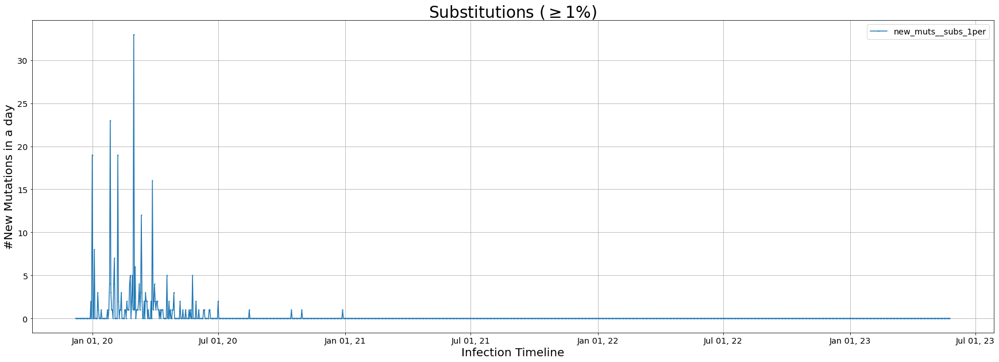

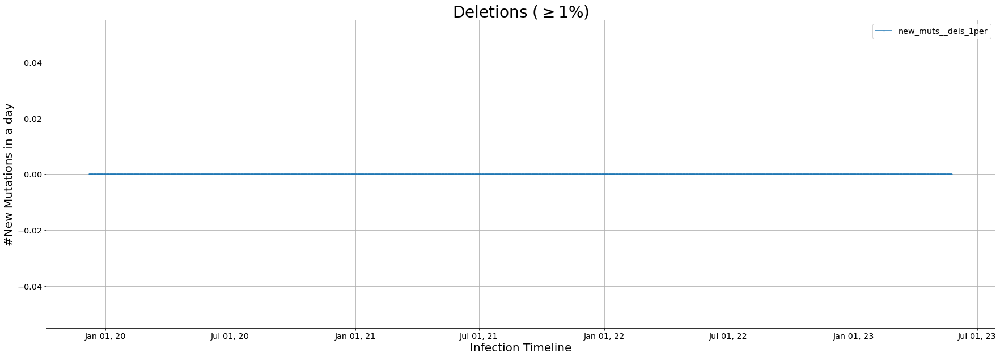

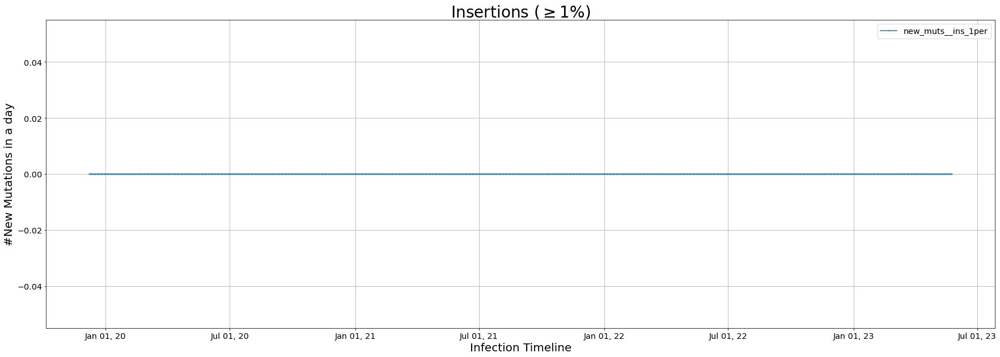

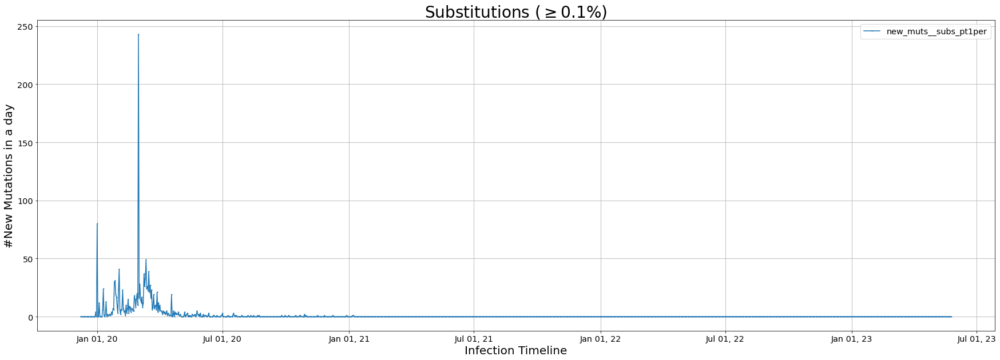

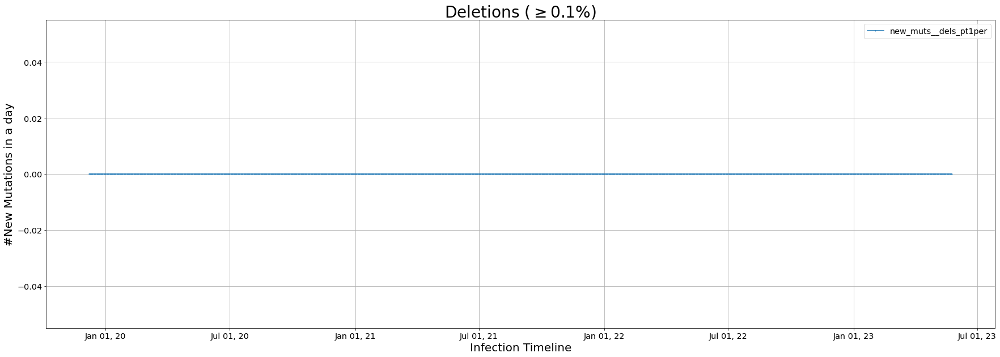

...

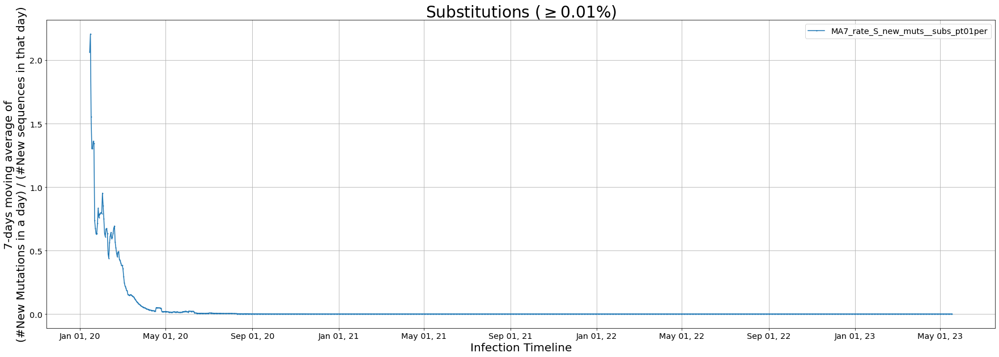

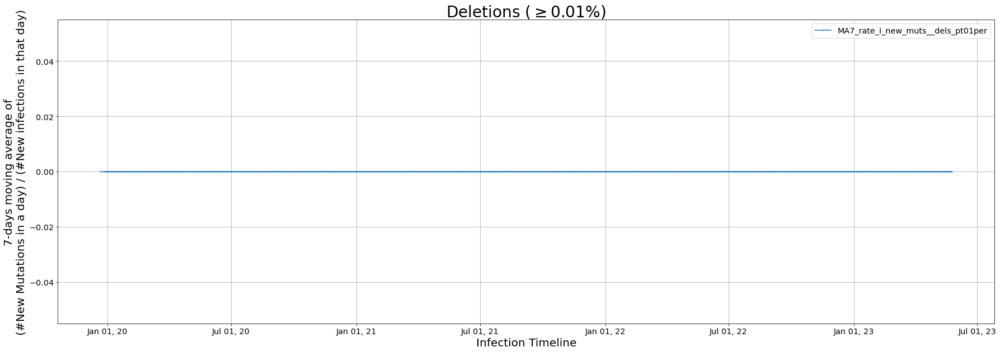

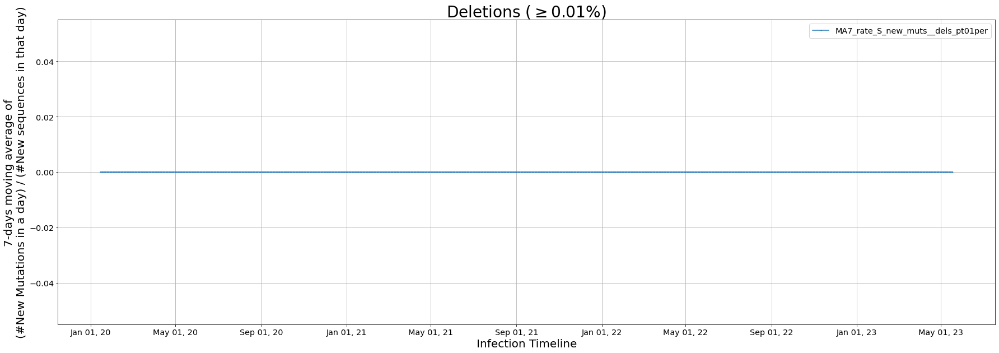

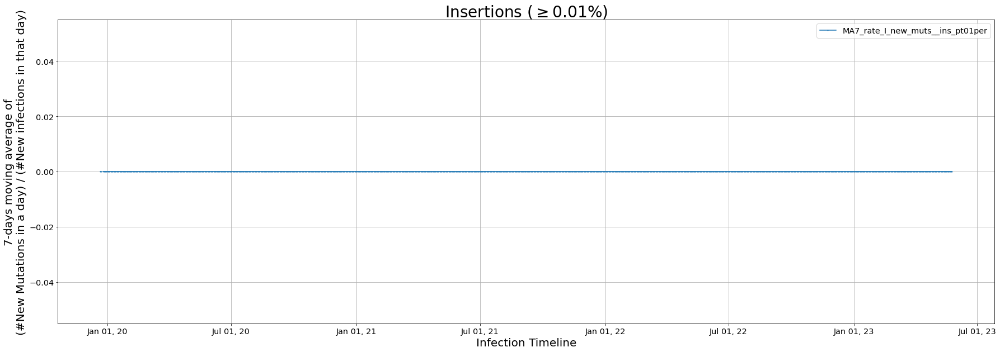

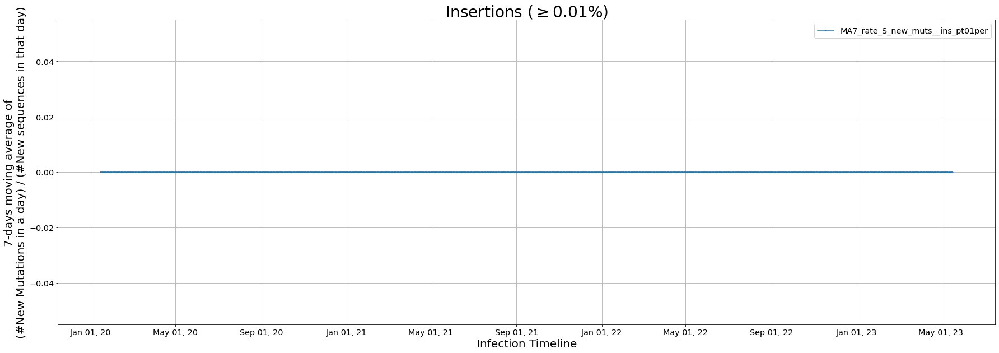

In [47]:
list_of_cols = df_ws.columns[5:]


for col in list_of_cols:
#     print(col)
    plt.figure(figsize=(30,10), facecolor = (1, 1, 1))
    plt.grid(True)
    
    if '_subs_' in col:
        if '_1per' in col:
            plt.title('Substitutions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in col:
            plt.title('Substitutions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in col:
            plt.title('Substitutions ($\geq$0.01%)', fontsize = 28)
    elif '_dels_' in col:
        if '_1per' in col:
            plt.title('Deletions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in col:
            plt.title('Deletions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in col:
            plt.title('Deletions ($\geq$0.01%)', fontsize = 28)
    elif '_ins_' in col:
        if '_1per' in col:
            plt.title('Insertions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in col:
            plt.title('Insertions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in col:
            plt.title('Insertions ($\geq$0.01%)', fontsize = 28)
    
    if 'rate_I_' in col:
        if 'MA7' in col:
            plt.ylabel('7-days moving average of\n(#New Mutations in a day) / (#New infections in that day)', fontsize = 20)
        else:
            plt.ylabel('(#New Mutations in a day) / (#New infections in that day)', fontsize = 20)
    elif 'rate_S_' in col:
        if 'MA7' in col:
            plt.ylabel('7-days moving average of\n(#New Mutations in a day) / (#New sequences in that day)', fontsize = 20)
        else:
            plt.ylabel('(#New Mutations in a day) / (#New sequences in that day)', fontsize = 20)
    else:
        if 'MA7' in col:
                plt.ylabel('#7-days moving average of\nNew Mutations in a day', fontsize = 20)
        else:
                plt.ylabel('#New Mutations in a day', fontsize = 20)
    
    plt.xlabel('Infection Timeline', fontsize = 20)
#     plt.xticks(rotation=90)

    # # Setting cutoffs for drawing vertical lines
    # from datetime import date
    # cutoff1 = date(2020,1,5)
    # cutoff2 = date(2020,2,29)
    # plt.axvline(x = cutoff1, color = 'black', linestyle = '--')
    # plt.axvline(x = cutoff2, color = 'black', linestyle = '--')
    # # Adding text on the vertical axes
    # plt.text(cutoff1, 72, "\nEnd of first week", rotation=90, verticalalignment='center', size = 18)
    # plt.text(cutoff2, 70, "\nMarch begins", rotation=90, verticalalignment='center', size = 18)
    plt.xticks(size='x-large')
    plt.yticks(size='x-large')
    # x-axis date representation formatting
    date_format = mpl_dates.DateFormatter('%b %d, %y')
    plt.gca().xaxis.set_major_formatter(date_format)
    
#     plt.plot(df_ws.collection_date, df_ws[col], marker = 'o', markersize=1, linewidth=1.5, label=col)
    plt.plot(df_ws.collection_date, df_ws[col], marker = 'o', markersize=1, label=col)

    plt.legend(loc = 'best')
    plt.legend(fontsize="x-large")
    # plt.savefig('plots_void_story/ma7_top5000.png', dpi=1000, bbox_inches='tight')

#### Way 2

/local/scratch/41564533.1.interactive/ipykernel_248208/3022435269.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(30,10), facecolor = (1, 1, 1))


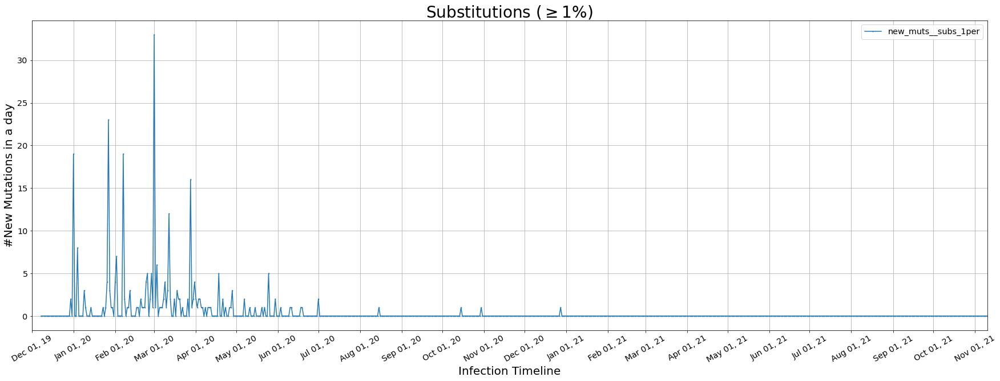

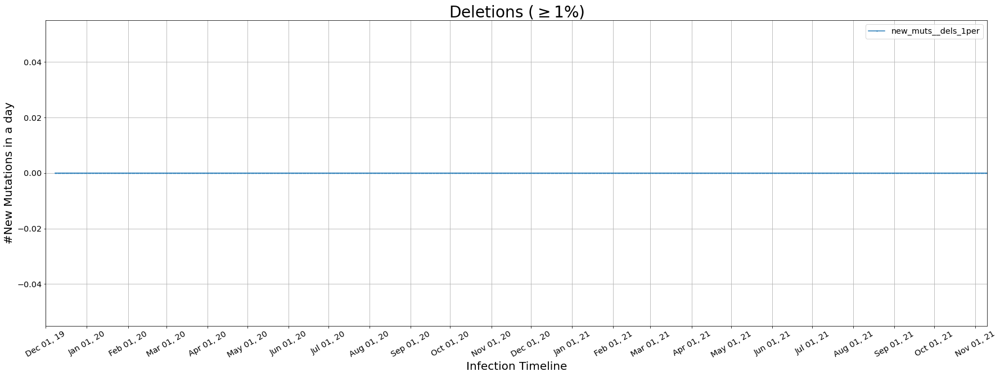

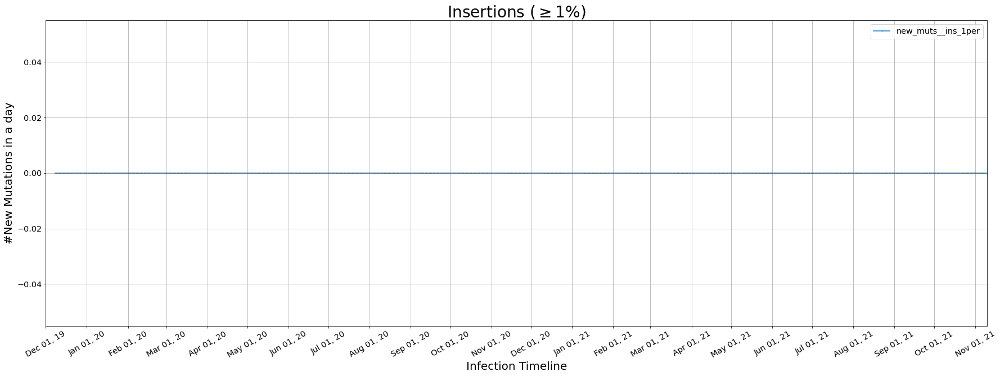

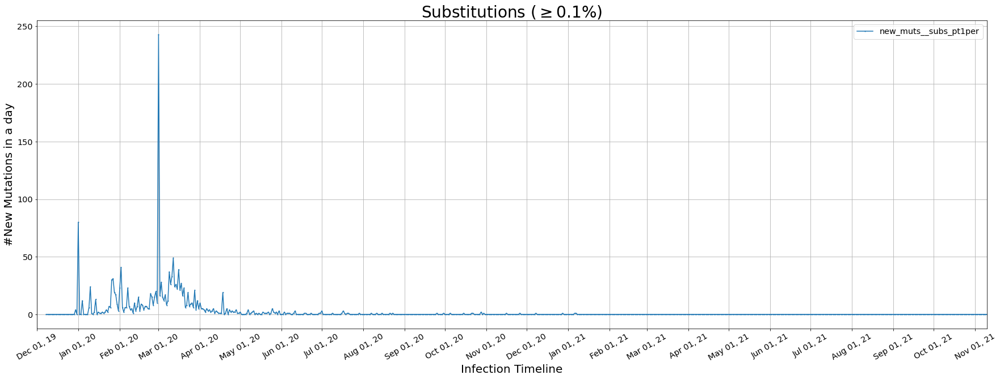

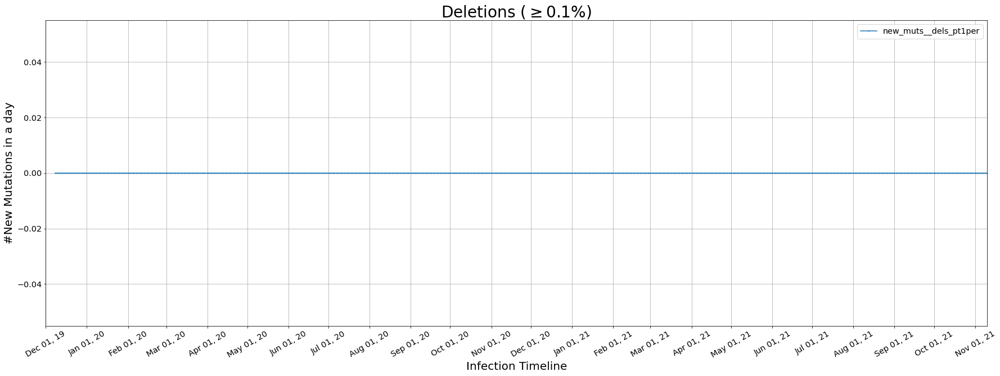

...

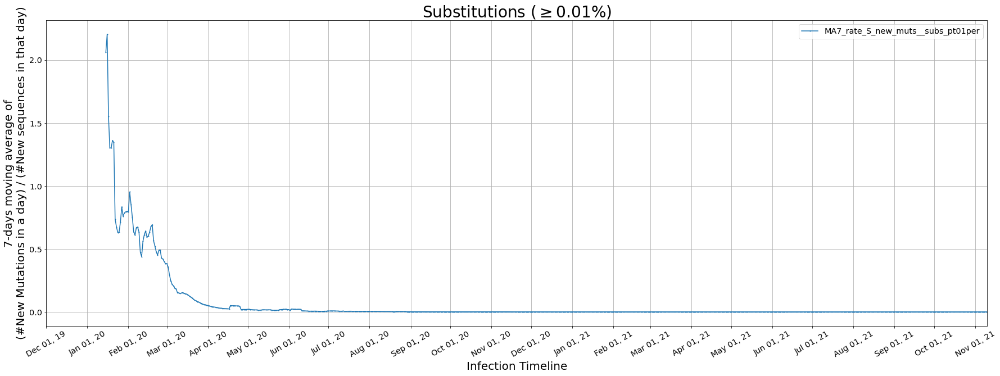

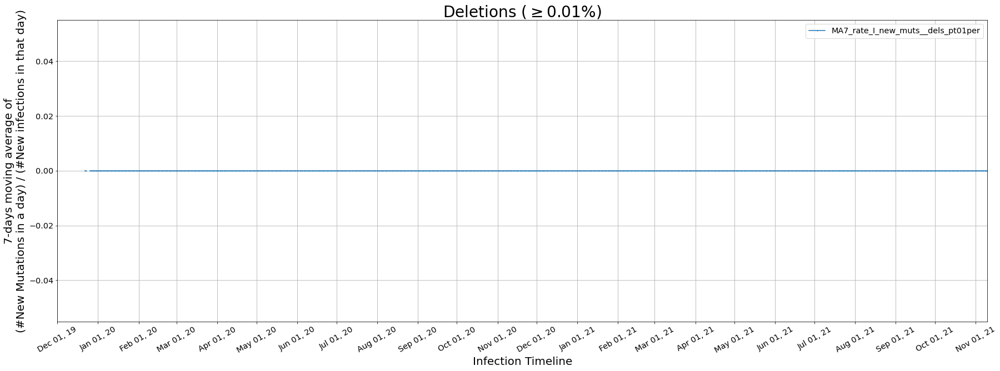

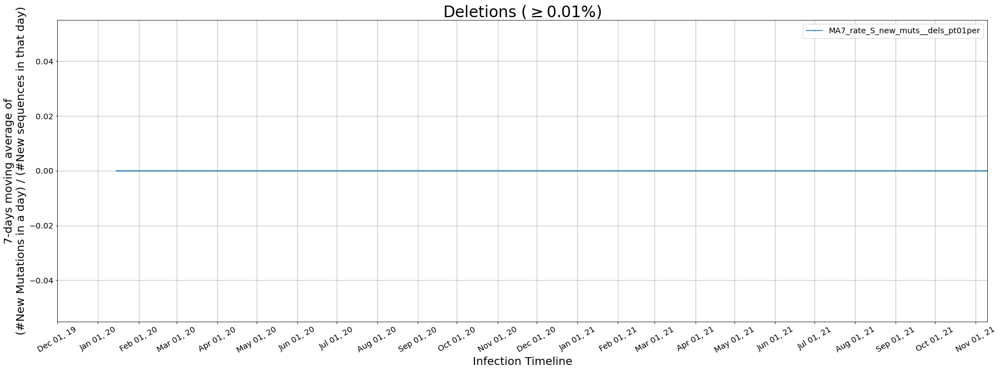

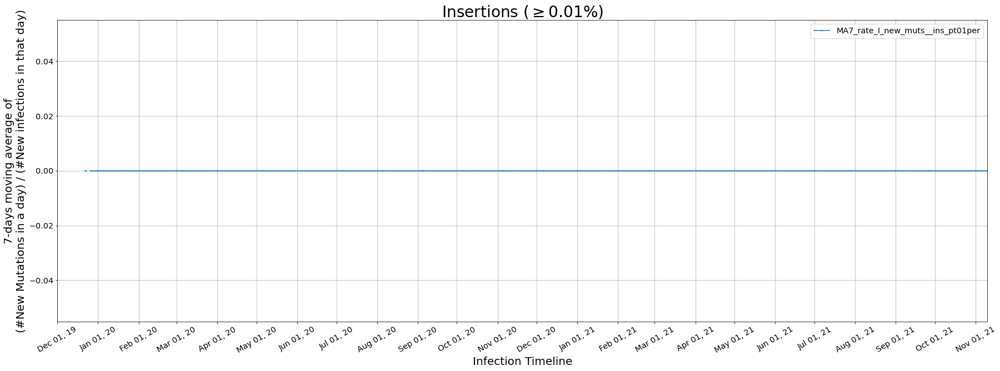

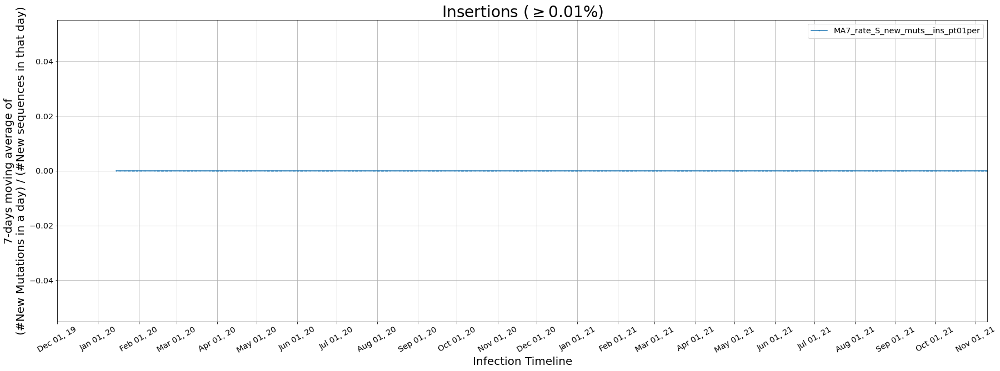

In [48]:
list_of_cols = df_ws.columns[5:]


for col in list_of_cols:
#     print(col)
    plt.figure(figsize=(30,10), facecolor = (1, 1, 1))
    plt.grid(True)
    
    if '_subs_' in col:
        if '_1per' in col:
            plt.title('Substitutions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in col:
            plt.title('Substitutions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in col:
            plt.title('Substitutions ($\geq$0.01%)', fontsize = 28)
    elif '_dels_' in col:
        if '_1per' in col:
            plt.title('Deletions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in col:
            plt.title('Deletions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in col:
            plt.title('Deletions ($\geq$0.01%)', fontsize = 28)
    elif '_ins_' in col:
        if '_1per' in col:
            plt.title('Insertions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in col:
            plt.title('Insertions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in col:
            plt.title('Insertions ($\geq$0.01%)', fontsize = 28)
    
    if 'rate_I_' in col:
        if 'MA7' in col:
            plt.ylabel('7-days moving average of\n(#New Mutations in a day) / (#New infections in that day)', fontsize = 20)
        else:
            plt.ylabel('(#New Mutations in a day) / (#New infections in that day)', fontsize = 20)
    elif 'rate_S_' in col:
        if 'MA7' in col:
            plt.ylabel('7-days moving average of\n(#New Mutations in a day) / (#New sequences in that day)', fontsize = 20)
        else:
            plt.ylabel('(#New Mutations in a day) / (#New sequences in that day)', fontsize = 20)
    else:
        if 'MA7' in col:
                plt.ylabel('#7-days moving average of\nNew Mutations in a day', fontsize = 20)
        else:
                plt.ylabel('#New Mutations in a day', fontsize = 20)
    
    plt.xlabel('Infection Timeline', fontsize = 20)
    plt.xticks(rotation=30)

    # # Setting cutoffs for drawing vertical lines
    # from datetime import date
    # cutoff1 = date(2020,1,5)
    # cutoff2 = date(2020,2,29)
    # plt.axvline(x = cutoff1, color = 'black', linestyle = '--')
    # plt.axvline(x = cutoff2, color = 'black', linestyle = '--')
    # # Adding text on the vertical axes
    # plt.text(cutoff1, 72, "\nEnd of first week", rotation=90, verticalalignment='center', size = 18)
    # plt.text(cutoff2, 70, "\nMarch begins", rotation=90, verticalalignment='center', size = 18)
    plt.xticks(size='x-large')
    plt.yticks(size='x-large')
#     # x-axis date representation formatting
#     date_format = mpl_dates.DateFormatter('%b %d, %y')
#     plt.gca().xaxis.set_major_formatter(date_format)
    plt.gca().xaxis.set_major_locator(mpl_dates.MonthLocator(interval=1))
    plt.gca().xaxis.set_major_formatter(mpl_dates.DateFormatter('%b %d, %y'))
    
    plt.xlim(date(2019,12,1),date(2021,11,10))
    
    plt.plot(df_ws.collection_date, df_ws[col], marker = 'o', markersize=1, label=col)

    plt.legend(loc = 'best')
    plt.legend(fontsize="x-large")
    # plt.savefig('plots_void_story/ma7_top5000.png', dpi=1000, bbox_inches='tight')

### Length-wise distribution of mutations

#### code blocks

In [49]:
df_pos_info = pd.DataFrame({'ref_index':allpos}).reset_index(drop=True)
df_pos_info.index = df_pos_info['ref_index']
df_pos_info['empty_col'] = 0
del df_pos_info['ref_index']

list_of_dfs = [df_per1_subs, df_per1_dels, df_per1_ins, 
               df_per_pt1_subs, df_per_pt1_dels, df_per_pt1_ins, 
               df_per_pt01_subs, df_per_pt01_dels, df_per_pt01_ins]


for x in list_of_dfs:
    
    df_pos_info['pos_info_'+x.name] = df_pos_info.empty_col
    temp = x.pos.value_counts()
#     (temp.groupby(['pos']).size()) # Alternative to above

    for position in temp.index:
        df_pos_info['pos_info_'+x.name][position] = temp[position]
    
#     Verification
    print('pos_info_'+x.name, end=' = ')
    print(sum(df_pos_info['pos_info_'+x.name]))


pos_info_subs_1per = 281
pos_info_dels_1per = 0
pos_info_ins_1per = 0
pos_info_subs_pt1per = 1556
pos_info_dels_pt1per = 0
pos_info_ins_pt1per = 0
pos_info_subs_pt01per = 9157
pos_info_dels_pt01per = 0
pos_info_ins_pt01per = 0


In [50]:
df_pos_info

,empty_col,pos_info_subs_1per,pos_info_dels_1per,pos_info_ins_1per,pos_info_subs_pt1per,pos_info_dels_pt1per,pos_info_ins_pt1per,pos_info_subs_pt01per,pos_info_dels_pt01per,pos_info_ins_pt01per
ref_index,,,,,,,,,,
1,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
29899,0,0,0,0,0,0,0,0,0,0
29900,0,0,0,0,0,0,0,0,0,0
29901,0,0,0,0,0,0,0,0,0,0


In [51]:
# Normalization by percentage
# ________________________________________________________________________________________________

# >1%
df_pos_info['per_of_pos_info_subs_1per'] = df_pos_info['pos_info_subs_1per'] * (100 / n_per1['subs'])
df_pos_info['per_of_pos_info_dels_1per'] = df_pos_info['pos_info_dels_1per'] * (100 / n_per1['dels'])
df_pos_info['per_of_pos_info_ins_1per'] = df_pos_info['pos_info_ins_1per'] * (100 / n_per1['ins'])

# >0.1%
df_pos_info['per_of_pos_info_subs_pt1per'] = df_pos_info['pos_info_subs_pt1per'] * (100 / n_pt1per['subs'])
df_pos_info['per_of_pos_info_dels_pt1per'] = df_pos_info['pos_info_dels_pt1per'] * (100 / n_pt1per['dels'])
df_pos_info['per_of_pos_info_ins_pt1per'] = df_pos_info['pos_info_ins_pt1per'] * (100 / n_pt1per['ins'])

# >0.01%
df_pos_info['per_of_pos_info_subs_pt01per'] = df_pos_info['pos_info_subs_pt01per'] * (100 / n_pt01per['subs'])
df_pos_info['per_of_pos_info_dels_pt01per'] = df_pos_info['pos_info_dels_pt01per'] * (100 / n_pt01per['dels'])
df_pos_info['per_of_pos_info_ins_pt01per'] = df_pos_info['pos_info_ins_pt01per'] * (100 / n_pt01per['ins'])


/local/scratch/41564533.1.interactive/ipykernel_248208/2285075830.py:6: RuntimeWarning: divide by zero encountered in scalar divide
  df_pos_info['per_of_pos_info_dels_1per'] = df_pos_info['pos_info_dels_1per'] * (100 / n_per1['dels'])
/local/scratch/41564533.1.interactive/ipykernel_248208/2285075830.py:7: RuntimeWarning: divide by zero encountered in scalar divide
  df_pos_info['per_of_pos_info_ins_1per'] = df_pos_info['pos_info_ins_1per'] * (100 / n_per1['ins'])
/local/scratch/41564533.1.interactive/ipykernel_248208/2285075830.py:11: RuntimeWarning: divide by zero encountered in scalar divide
  df_pos_info['per_of_pos_info_dels_pt1per'] = df_pos_info['pos_info_dels_pt1per'] * (100 / n_pt1per['dels'])
/local/scratch/41564533.1.interactive/ipykernel_248208/2285075830.py:12: RuntimeWarning: divide by zero encountered in scalar divide
  df_pos_info['per_of_pos_info_ins_pt1per'] = df_pos_info['pos_info_ins_pt1per'] * (100 / n_pt1per['ins'])
/local/scratch/41564533.1.interactive/ipykernel_

#### Rolling functions' computation

In [52]:
list_of_cols = df_pos_info.columns[10:]

# Rolling function for columns with positional mutation data
for x in list_of_cols:
    df_pos_info['mean_MA200_'+x] = df_pos_info[x].rolling(window=200, closed='both').mean()
    df_pos_info['sum_MA200_'+x] = df_pos_info[x].rolling(window=200, closed='both').sum()

#### Way 1

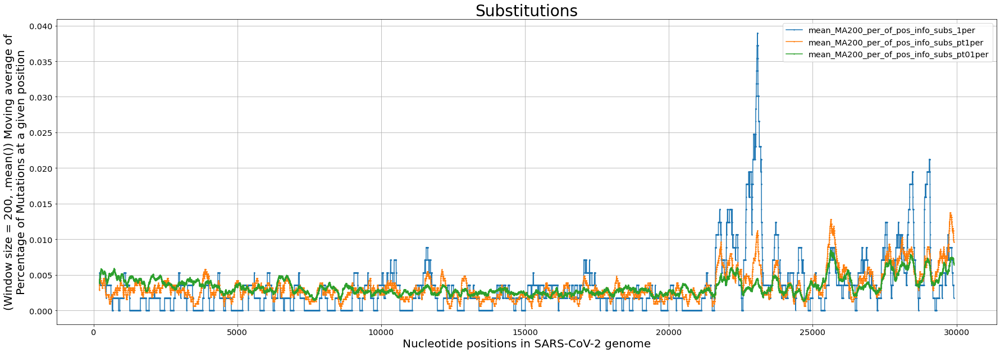

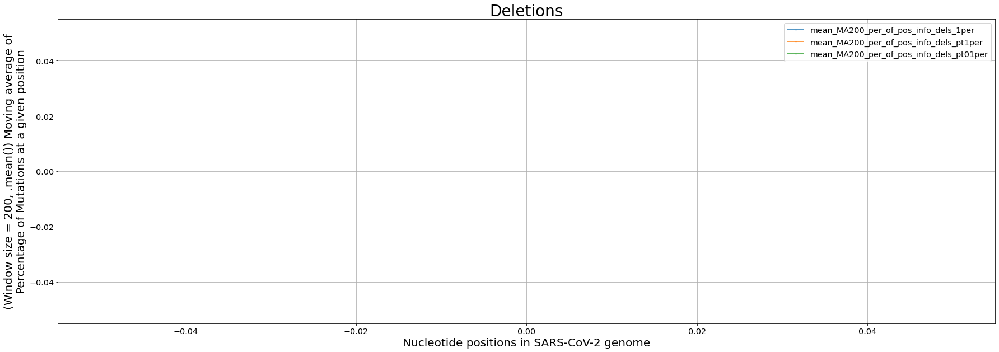

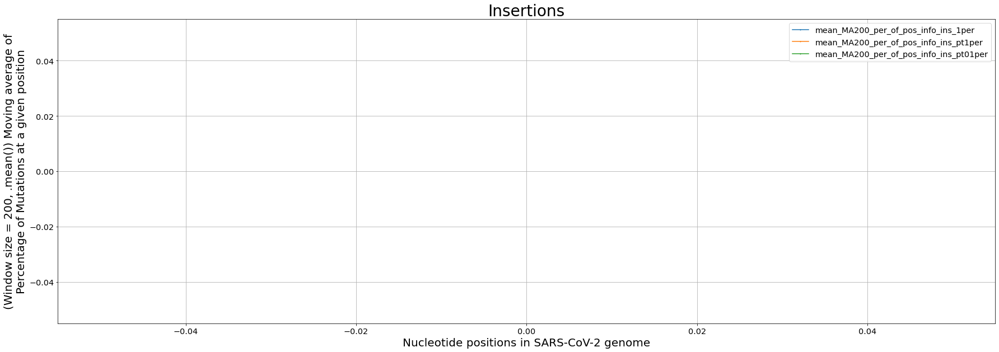

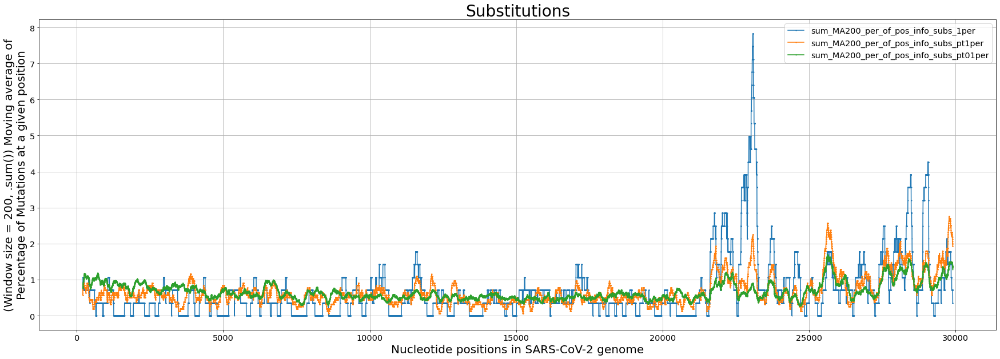

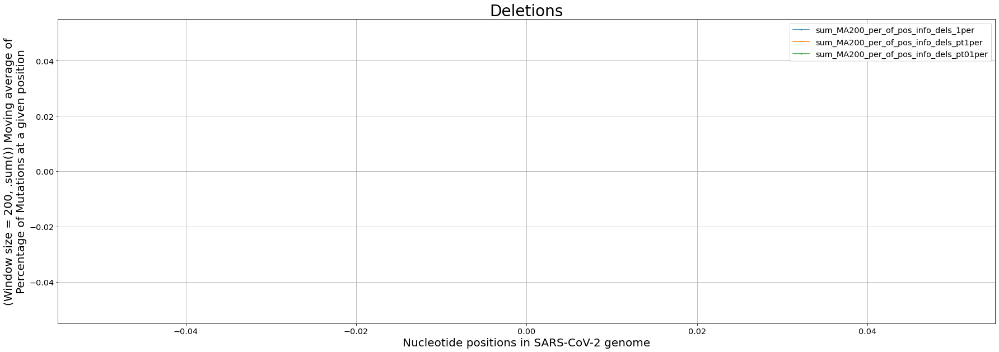

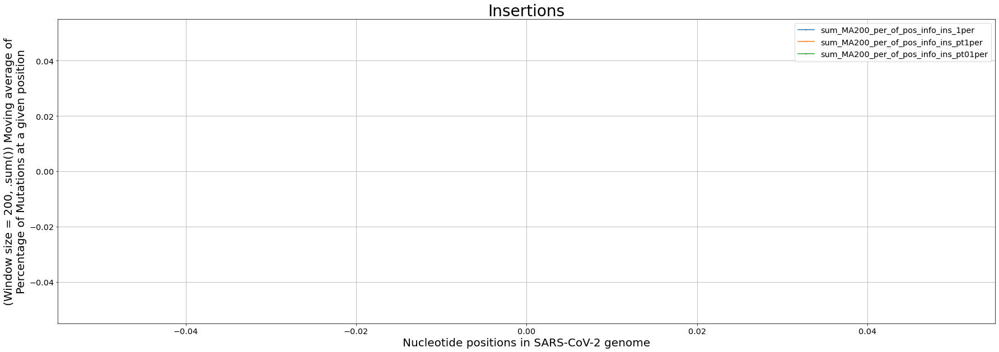

In [53]:
tuple_of_cols = ((df_pos_info.mean_MA200_per_of_pos_info_subs_1per, df_pos_info.mean_MA200_per_of_pos_info_subs_pt1per, df_pos_info.mean_MA200_per_of_pos_info_subs_pt01per), 
                (df_pos_info.mean_MA200_per_of_pos_info_dels_1per, df_pos_info.mean_MA200_per_of_pos_info_dels_pt1per, df_pos_info.mean_MA200_per_of_pos_info_dels_pt01per), 
                (df_pos_info.mean_MA200_per_of_pos_info_ins_1per, df_pos_info.mean_MA200_per_of_pos_info_ins_pt1per, df_pos_info.mean_MA200_per_of_pos_info_ins_pt01per), 
                (df_pos_info.sum_MA200_per_of_pos_info_subs_1per, df_pos_info.sum_MA200_per_of_pos_info_subs_pt1per, df_pos_info.sum_MA200_per_of_pos_info_subs_pt01per), 
                (df_pos_info.sum_MA200_per_of_pos_info_dels_1per, df_pos_info.sum_MA200_per_of_pos_info_dels_pt1per, df_pos_info.sum_MA200_per_of_pos_info_dels_pt01per), 
                (df_pos_info.sum_MA200_per_of_pos_info_ins_1per, df_pos_info.sum_MA200_per_of_pos_info_ins_pt1per, df_pos_info.sum_MA200_per_of_pos_info_ins_pt01per))

# print(tuple_of_cols[0][0].name)


for col in tuple_of_cols:
#     print(col)
    plt.figure(figsize=(30,10), facecolor = (1, 1, 1))
    plt.grid(True)
    
#     y_1per = col[0]
#     y_pt1per = col[1]
#     y_pt01per = col[2]
#     instead of col[0], we can even pick col[1] or col[2]. everything works fine here
    if '_subs_' in col[0].name:
        plt.title('Substitutions', fontsize = 28)
#         if '_1per' in col[0].name:
#             plt.title('Substitutions ($\geq$1%)', fontsize = 28)
#         elif '_pt1per' in col[0].name:
#             plt.title('Substitutions ($\geq$0.1%)', fontsize = 28)
#         elif '_pt01per' in col[0].name:
#             plt.title('Substitutions ($\geq$0.01%)', fontsize = 28)
    elif '_dels_' in col[0].name:
        plt.title('Deletions', fontsize = 28)
#         if '_1per' in col[0].name:
#             plt.title('Deletions ($\geq$1%)', fontsize = 28)
#         elif '_pt1per' in col[0].name:
#             plt.title('Deletions ($\geq$0.1%)', fontsize = 28)
#         elif '_pt01per' in col[0].name:
#             plt.title('Deletions ($\geq$0.01%)', fontsize = 28)
    elif '_ins_' in col[0].name:
        plt.title('Insertions', fontsize = 28)
#         if '_1per' in col[0].name:
#             plt.title('Insertions ($\geq$1%)', fontsize = 28)
#         elif '_pt1per' in col[0].name:
#             plt.title('Insertions ($\geq$0.1%)', fontsize = 28)
#         elif '_pt01per' in col[0].name:
#             plt.title('Insertions ($\geq$0.01%)', fontsize = 28)
    
    if 'mean_' in col[0].name:
        plt.ylabel('(Window size = 200, .mean()) Moving average of\nPercentage of Mutations at a given position', fontsize = 20)
    elif 'sum_' in col[0].name:
        plt.ylabel('(Window size = 200, .sum()) Moving average of\nPercentage of Mutations at a given position', fontsize = 20)
    
    plt.xlabel('Nucleotide positions in SARS-CoV-2 genome', fontsize = 20)
#     plt.xticks(rotation=90)

    # # Setting cutoffs for drawing vertical lines
    # from datetime import date
    # cutoff1 = date(2020,1,5)
    # cutoff2 = date(2020,2,29)
    # plt.axvline(x = cutoff1, color = 'black', linestyle = '--')
    # plt.axvline(x = cutoff2, color = 'black', linestyle = '--')
    # # Adding text on the vertical axes
    # plt.text(cutoff1, 72, "\nEnd of first week", rotation=90, verticalalignment='center', size = 18)
    # plt.text(cutoff2, 70, "\nMarch begins", rotation=90, verticalalignment='center', size = 18)
    plt.xticks(size='x-large')
    plt.yticks(size='x-large')
#     # x-axis date representation formatting
#     date_format = mpl_dates.DateFormatter('%b %d, %y')
#     plt.gca().xaxis.set_major_formatter(date_format)
    
#     plt.plot(df_ws.collection_date, df_ws[col], marker = 'o', markersize=1, linewidth=1.5, label=col)
    plt.plot(df_pos_info.index, df_pos_info[col[0].name], marker = 'o', markersize=1, label=col[0].name)
    plt.plot(df_pos_info.index, df_pos_info[col[1].name], marker = 'o', markersize=1, label=col[1].name)
    plt.plot(df_pos_info.index, df_pos_info[col[2].name], marker = 'o', markersize=1, label=col[2].name)

    plt.legend(loc = 'best')
    plt.legend(fontsize="x-large")
    # plt.savefig('plots_void_story/ma7_top5000.png', dpi=1000, bbox_inches='tight')

#### Way 2- annotated

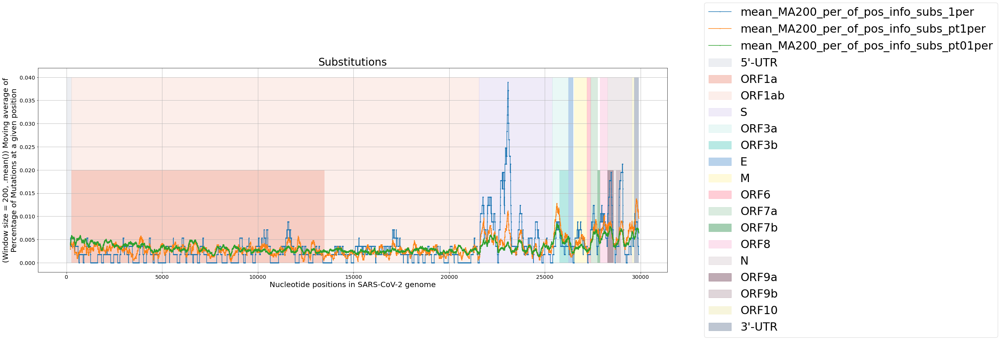

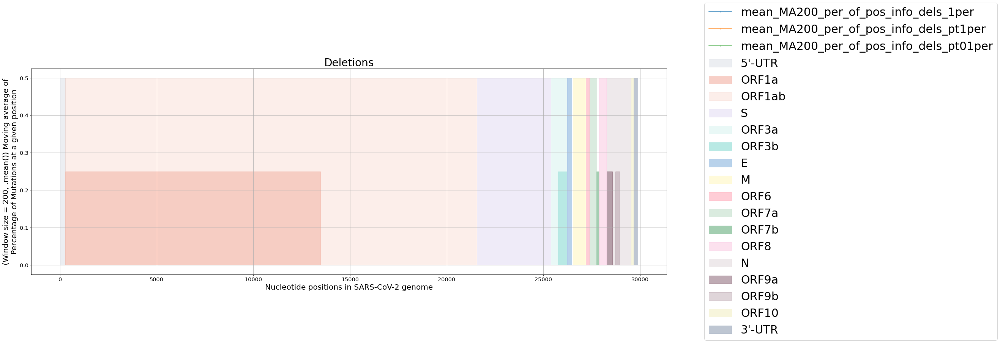

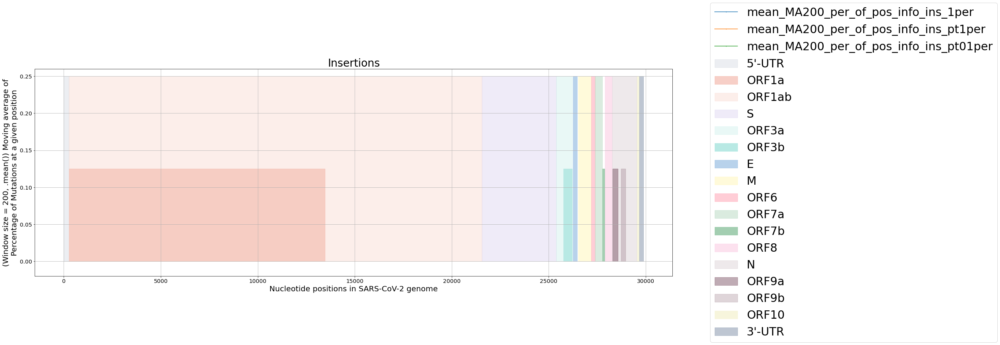

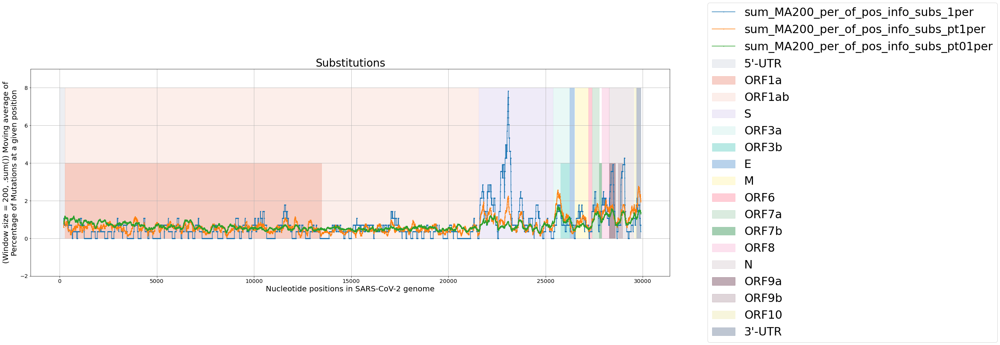

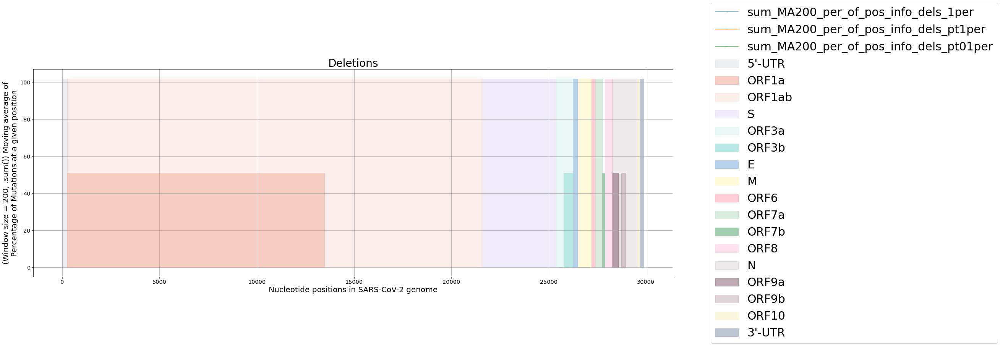

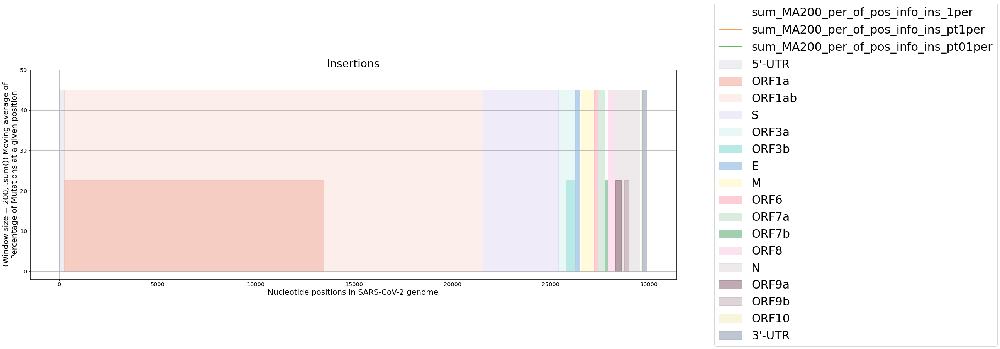

In [54]:
# Change the upper limit of patches from 100 to the max value and 50 to max value / 2

tuple_of_cols = ((df_pos_info.mean_MA200_per_of_pos_info_subs_1per, df_pos_info.mean_MA200_per_of_pos_info_subs_pt1per, df_pos_info.mean_MA200_per_of_pos_info_subs_pt01per), 
                (df_pos_info.mean_MA200_per_of_pos_info_dels_1per, df_pos_info.mean_MA200_per_of_pos_info_dels_pt1per, df_pos_info.mean_MA200_per_of_pos_info_dels_pt01per), 
                (df_pos_info.mean_MA200_per_of_pos_info_ins_1per, df_pos_info.mean_MA200_per_of_pos_info_ins_pt1per, df_pos_info.mean_MA200_per_of_pos_info_ins_pt01per), 
                (df_pos_info.sum_MA200_per_of_pos_info_subs_1per, df_pos_info.sum_MA200_per_of_pos_info_subs_pt1per, df_pos_info.sum_MA200_per_of_pos_info_subs_pt01per), 
                (df_pos_info.sum_MA200_per_of_pos_info_dels_1per, df_pos_info.sum_MA200_per_of_pos_info_dels_pt1per, df_pos_info.sum_MA200_per_of_pos_info_dels_pt01per), 
                (df_pos_info.sum_MA200_per_of_pos_info_ins_1per, df_pos_info.sum_MA200_per_of_pos_info_ins_pt1per, df_pos_info.sum_MA200_per_of_pos_info_ins_pt01per))

# print(tuple_of_cols[0][0].name)
# max_val = 0.04

for col in tuple_of_cols:
#     print(col)
    plt.figure(figsize=(30,10), facecolor = (1, 1, 1))
    plt.grid(True)
    
#     instead of col[0], we can even pick col[1] or col[2]. everything works fine here
    if 'mean_' in col[0].name:
        plt.ylabel('(Window size = 200, .mean()) Moving average of\nPercentage of Mutations at a given position', fontsize = 20)
        if '_subs_' in col[0].name:
            plt.title('Substitutions', fontsize = 28)
            max_val = 0.04
        elif '_dels_' in col[0].name:
            plt.title('Deletions', fontsize = 28)
            max_val = 0.5
        elif '_ins_' in col[0].name:
            plt.title('Insertions', fontsize = 28)
            max_val = 0.25
            plt.ylim(-0.02, 0.26)

    elif 'sum_' in col[0].name:
        plt.ylabel('(Window size = 200, .sum()) Moving average of\nPercentage of Mutations at a given position', fontsize = 20)
        if '_subs_' in col[0].name:
            plt.title('Substitutions', fontsize = 28)
            max_val = 8
            plt.ylim(-2,9)
        elif '_dels_' in col[0].name:
            plt.title('Deletions', fontsize = 28)
            max_val = 102
        elif '_ins_' in col[0].name:
            plt.title('Insertions', fontsize = 28)
            max_val = 45
            plt.ylim(-2, 50)
    
    plt.xlabel('Nucleotide positions in SARS-CoV-2 genome', fontsize = 20)
#     plt.xticks(rotation=90)

    # # Setting cutoffs for drawing vertical lines
    # from datetime import date
    # cutoff1 = date(2020,1,5)
    # cutoff2 = date(2020,2,29)
    # plt.axvline(x = cutoff1, color = 'black', linestyle = '--')
    # plt.axvline(x = cutoff2, color = 'black', linestyle = '--')
    # # Adding text on the vertical axes
    # plt.text(cutoff1, 72, "\nEnd of first week", rotation=90, verticalalignment='center', size = 18)
    # plt.text(cutoff2, 70, "\nMarch begins", rotation=90, verticalalignment='center', size = 18)
    plt.xticks(size='x-large')
    plt.yticks(size='x-large')
#     # x-axis date representation formatting
#     date_format = mpl_dates.DateFormatter('%b %d, %y')
#     plt.gca().xaxis.set_major_formatter(date_format)
    
#     plt.plot(df_ws.collection_date, df_ws[col], marker = 'o', markersize=1, linewidth=1.5, label=col)
    plt.plot(df_pos_info.index, df_pos_info[col[0].name], marker = 'o', markersize=1, label=col[0].name)
    plt.plot(df_pos_info.index, df_pos_info[col[1].name], marker = 'o', markersize=1, label=col[1].name)
    plt.plot(df_pos_info.index, df_pos_info[col[2].name], marker = 'o', markersize=1, label=col[2].name)
    # ----------------------------------------------------------------------------------------------------
    # Adding patches for regions
    # 5'-utr
    rect5utr = mpatches.Rectangle((1,0),264,max_val, fill = True, color = "#A3AEC0", alpha=0.2, linewidth = 1, label='5\'-UTR')
    plt.gca().add_patch(rect5utr)
    # orf1a
    rect1 = mpatches.Rectangle((266,0),13202,(max_val/2), fill = True, color = "#F2AFA3", alpha=0.6, linewidth = 1, label='ORF1a')
    plt.gca().add_patch(rect1)
    # orf1ab
    rect2 = mpatches.Rectangle((266,0),21289,max_val, fill = True, color = "#F6C9BC", alpha=0.3, linewidth = 1, label='ORF1ab')
    plt.gca().add_patch(rect2)
    # s
    rect3 = mpatches.Rectangle((21563,0),3821,max_val, fill = True, color = "#CCBFE9", alpha=0.3, linewidth = 1, label='S')
    plt.gca().add_patch(rect3)
    # orf3a
    rect4 = mpatches.Rectangle((25393,0),827,max_val, fill = True, color = "#B8E9E4", alpha=0.3, linewidth = 1, label='ORF3a')
    plt.gca().add_patch(rect4)
    # orf3b FEF3D8
    rect5 = mpatches.Rectangle((25765,0),455,(max_val/2), fill = True, color = "#B8E9E4", alpha=1, linewidth = 1, label='ORF3b')
    plt.gca().add_patch(rect5)
    # e A4DDED E8FAFF
    rect6 = mpatches.Rectangle((26245,0),227,max_val, fill = True, color = "#A7C7E7", alpha=0.8, linewidth = 1, label='E')
    plt.gca().add_patch(rect6)
    # m
    rect7 = mpatches.Rectangle((26523,0),668,max_val, fill = True, color = "#FFF8C2", alpha=0.6, linewidth = 1, label='M')
    plt.gca().add_patch(rect7)
    # orf6
    rect8 = mpatches.Rectangle((27202,0),185,max_val, fill = True, color = "#FFADBB", alpha=0.6, linewidth = 1, label='ORF6')
    plt.gca().add_patch(rect8)
    # orf7a
    rect9 = mpatches.Rectangle((27394,0),365,max_val, fill = True, color = "#A3CEB1", alpha=0.4, linewidth = 1, label='ORF7a')
    plt.gca().add_patch(rect9)
    # orf7b CFF3CA
    rect10 = mpatches.Rectangle((27756,0),131,(max_val/2), fill = True, color = "#A3CEB1", alpha=1, linewidth = 1, label='ORF7b')
    plt.gca().add_patch(rect10)
    # orf8
    rect11 = mpatches.Rectangle((27894,0),365,max_val, fill = True, color = "#FBCDE4", alpha=0.6, linewidth = 1, label='ORF8')
    plt.gca().add_patch(rect11)
    # n
    rect12 = mpatches.Rectangle((28274,0),1259,max_val, fill = True, color = "#602F44", alpha=0.1, linewidth = 1, label='N')
    plt.gca().add_patch(rect12)
    # orf9a
    rect13 = mpatches.Rectangle((28284,0),293,(max_val/2), fill = True, color = "#602F44", alpha=0.4, linewidth = 1, label='ORF9a')
    plt.gca().add_patch(rect13)
    # orf9b
    rect14 = mpatches.Rectangle((28734,0),221,(max_val/2), fill = True, color = "#602F44", alpha=0.2, linewidth = 1, label='ORF9b')
    plt.gca().add_patch(rect14)
    # orf10
    rect15 = mpatches.Rectangle((29558,0),116,max_val, fill = True, color = "#F7F5DC", alpha=1, linewidth = 1, label='ORF10')
    plt.gca().add_patch(rect15)
    # 3'-utr
    rect3utr = mpatches.Rectangle((29675,0),216,max_val, fill = True, color = "#A3AEC0", alpha=0.7, linewidth = 1, label='3\'-UTR')
    plt.gca().add_patch(rect3utr)
    # ----------------------------------------------------------------------------------------------------

    # plt.legend(loc=7)
    # plt.legend(loc='center left', bbox_to_anchor=(0.65, 1.10), fontsize=20)
    plt.legend(loc='center left', bbox_to_anchor=(1.05, .5), fontsize=30)

#     plt.legend(loc = 'best')
#     plt.legend(fontsize="x-large")
    # plt.savefig('plots_void_story/ma7_top5000.png', dpi=1000, bbox_inches='tight')

### Mutational abundance distribution wrt time 

#### Way 1

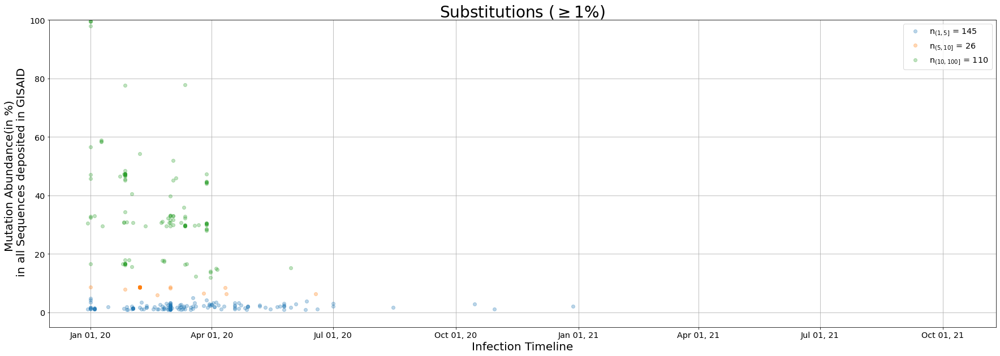

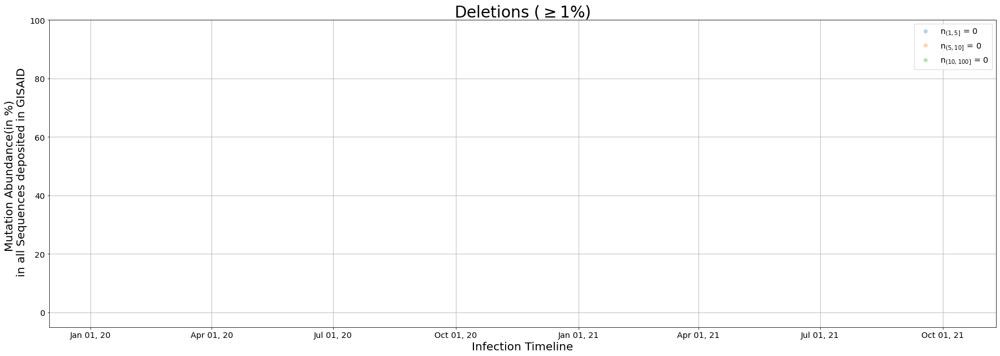

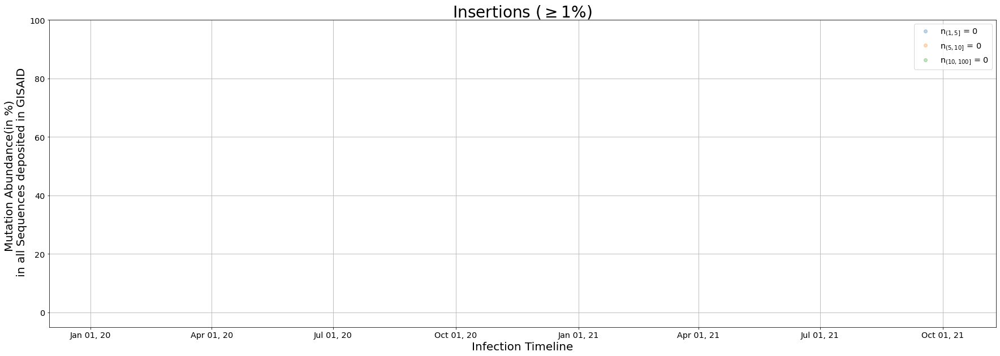

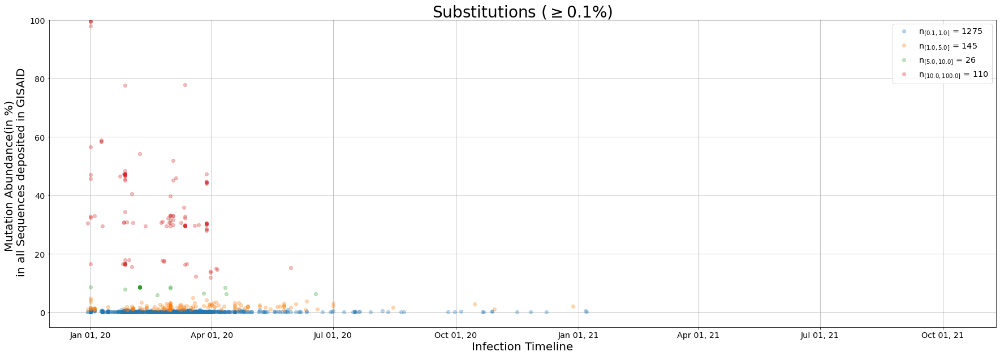

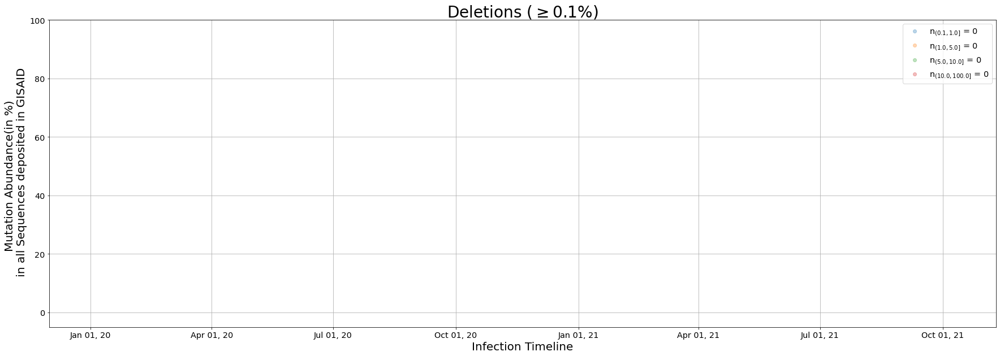

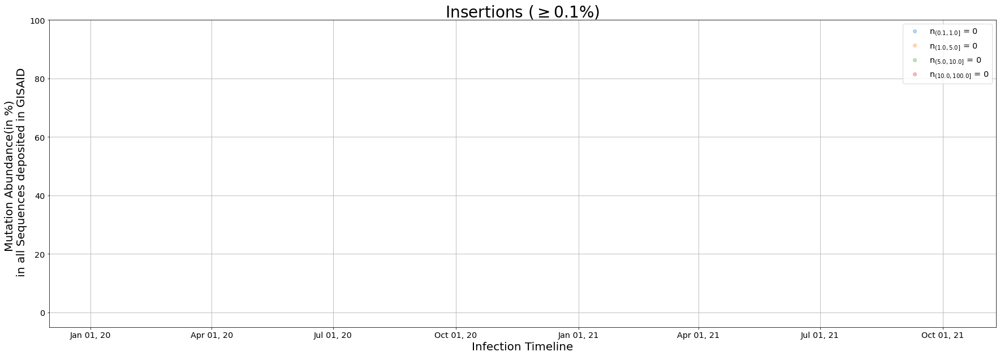

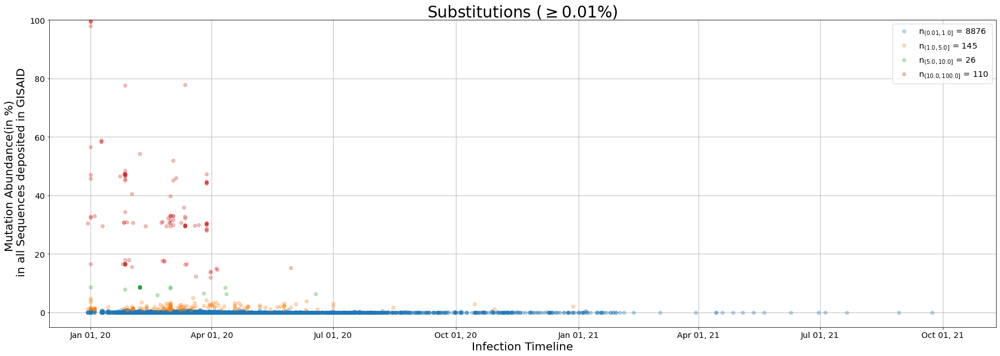

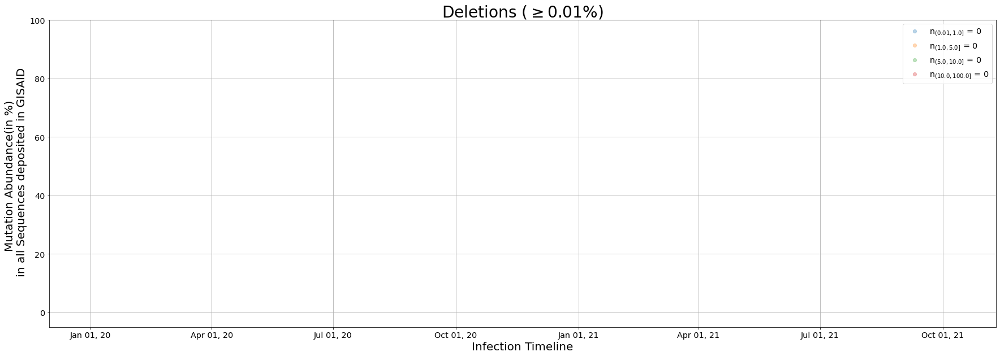

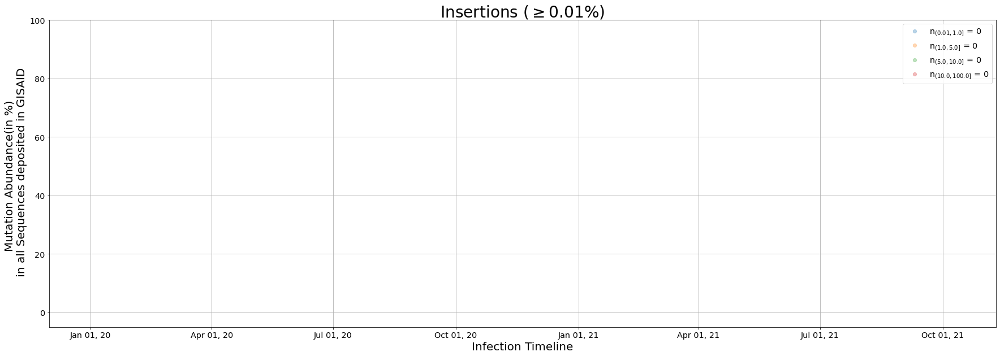

In [55]:
list_of_dfs = [df_per1_subs, df_per1_dels, df_per1_ins, 
               df_per_pt1_subs, df_per_pt1_dels, df_per_pt1_ins, 
               df_per_pt01_subs, df_per_pt01_dels, df_per_pt01_ins]

for x in list_of_dfs:
    
    plt.figure(figsize=(30,10), facecolor = (1, 1, 1))
    plt.grid(True)
#     Grouping the data
#     print(x.name)
    if '_1per' in x.name:
        test = x.groupby(pd.cut(x.per_abundance, [1, 5, 10, 100]))
    elif '_pt1per' in x.name:
        test = x.groupby(pd.cut(x.per_abundance, [0.1, 1, 5, 10, 100]))
    elif '_pt01per' in x.name:
        test = x.groupby(pd.cut(x.per_abundance, [0.01, 1, 5, 10, 100]))
    i = 0
    for names, group in test:
#         print(names, group)
        i += len(group.index)
#         print(len(group.index))
#     print(i == len(x.index))

    if 'subs' in x.name:
        if '_1per' in x.name:
            plt.title('Substitutions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in x.name:
            plt.title('Substitutions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in x.name:
            plt.title('Substitutions ($\geq$0.01%)', fontsize = 28)
    elif 'dels' in x.name:
        if '_1per' in x.name:
            plt.title('Deletions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in x.name:
            plt.title('Deletions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in x.name:
            plt.title('Deletions ($\geq$0.01%)', fontsize = 28)
    elif 'ins' in x.name:
        if '_1per' in x.name:
            plt.title('Insertions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in x.name:
            plt.title('Insertions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in x.name:
            plt.title('Insertions ($\geq$0.01%)', fontsize = 28)
    
#     plt.title('Top 100- Mutation Abundance vs Infection Timeline', fontsize = 28)
    plt.ylabel('Mutation Abundance(in %) \n in all Sequences deposited in GISAID', fontsize = 20)
    plt.xlabel('Infection Timeline', fontsize = 20)

#     # Adding Vertical lines for setting a cutoff
#     # For end of March 
#     # (https://www.analyticsvidhya.com/blog/2020/05/datetime-variables-python-pandas/)
#     from datetime import date
#     cutoff1 = date(2020,2,1)
#     cutoff2 = date(2020,4,1)
#     plt.axvline(x = cutoff1, color = 'black', linestyle = '--')
#     plt.axvline(x = cutoff2, color = 'black', linestyle = '--')
#     # Adding text on the vertical axes
#     plt.text(cutoff1, 75, "\nEnd of January \'20", rotation=90, verticalalignment='center', size = 18)
#     plt.text(cutoff2, 75, "\nEnd of March \'20", rotation=90, verticalalignment='center', size = 18)

#     plt.xticks(rotation=90)
    plt.xticks(size='x-large')
    plt.yticks(size='x-large')
    
    for name, group in test:
        plt.plot(group['collection_date'], group['per_abundance'], linestyle = 'none', marker = 'o', label='n$_{'+str(name)+'}$ = '+str(len(group.index)), alpha = 0.3)
    
    plt.xlim(date(2019,12,1),date(2021,11,10))
    plt.ylim(-5, 100)
    # x-axis date representation formatting
    date_format = mpl_dates.DateFormatter('%b %d, %y')
    plt.gca().xaxis.set_major_formatter(date_format)
    plt.legend(loc = 'best')
    plt.legend(fontsize="x-large")
    
    

#### Way 2

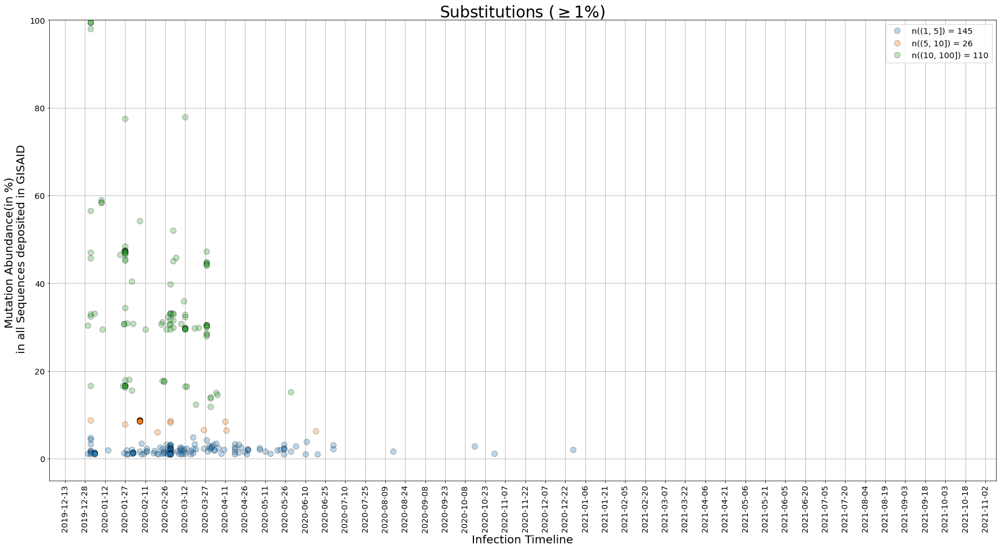

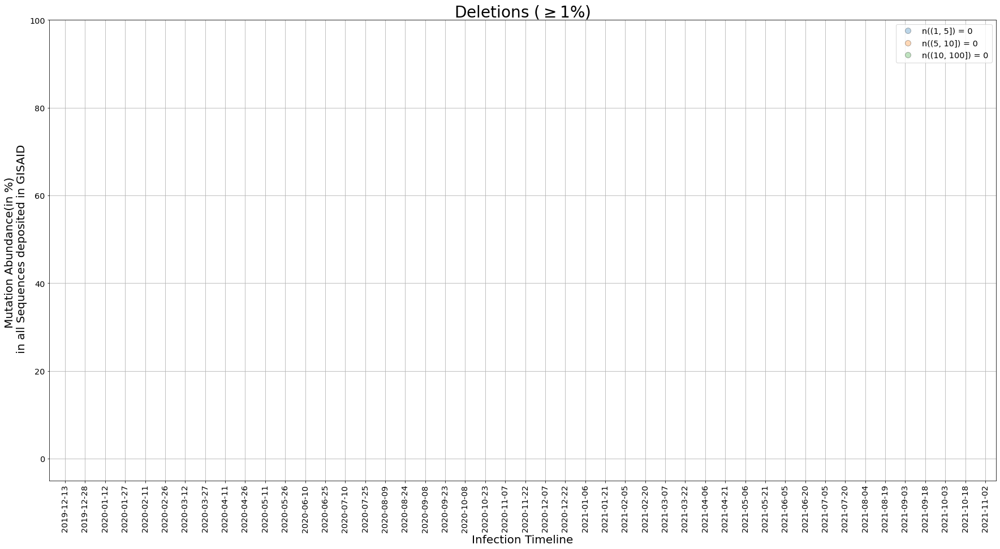

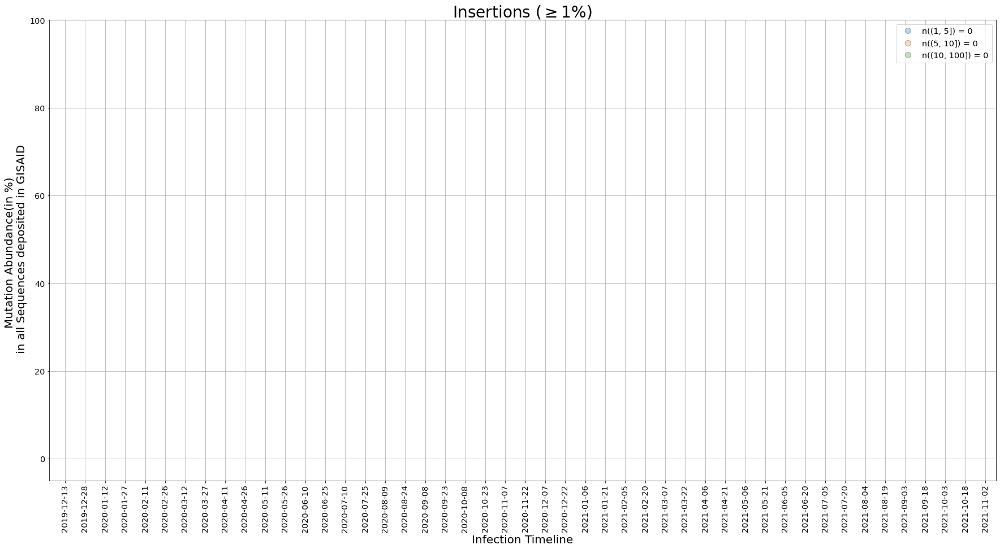

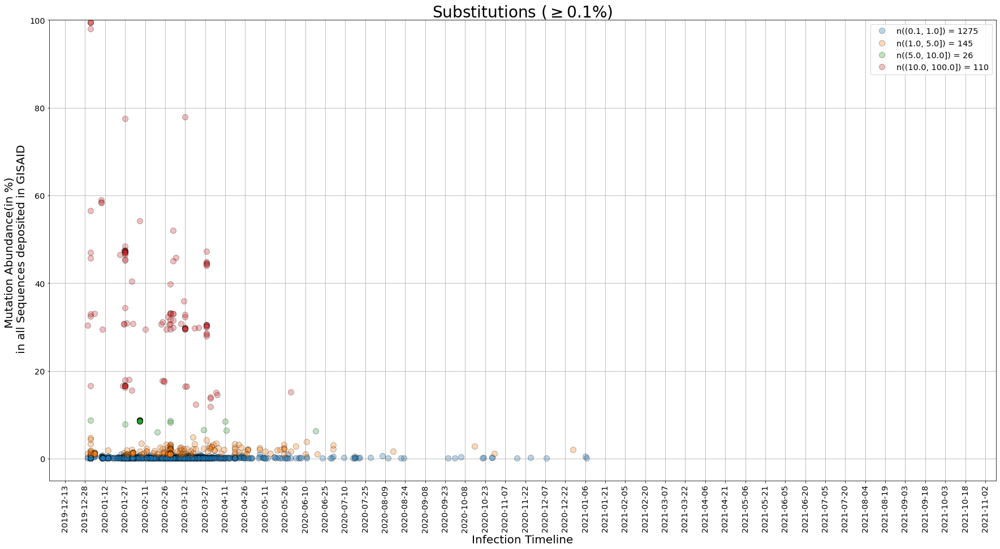

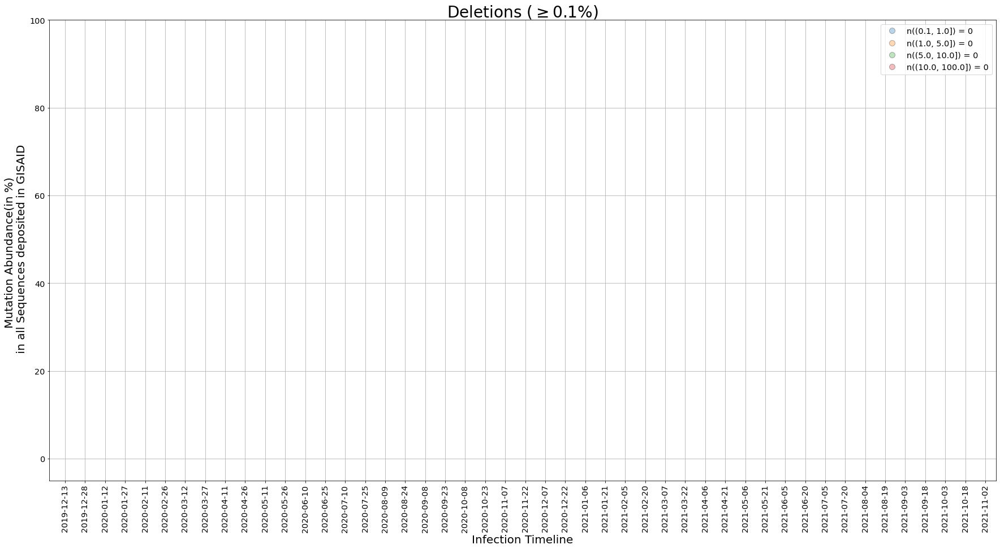

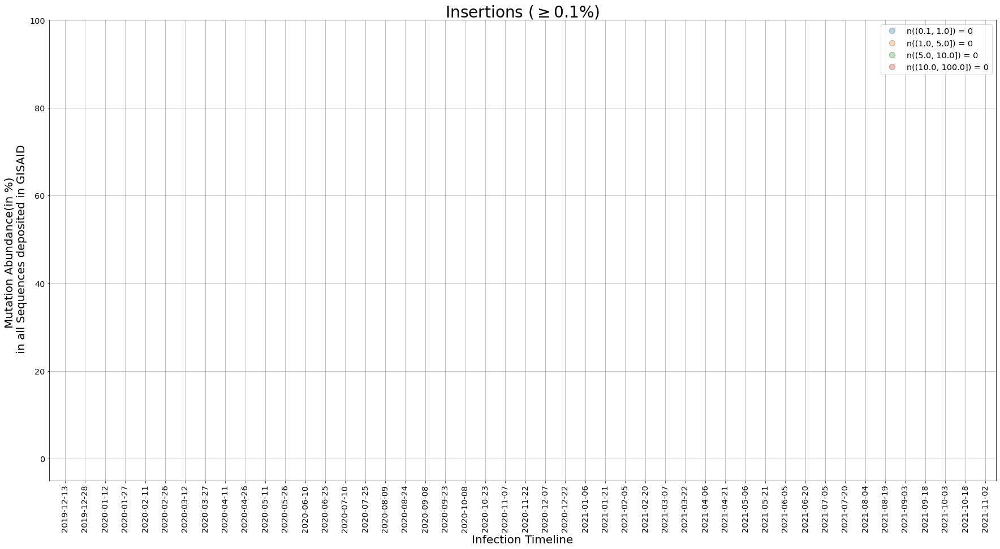

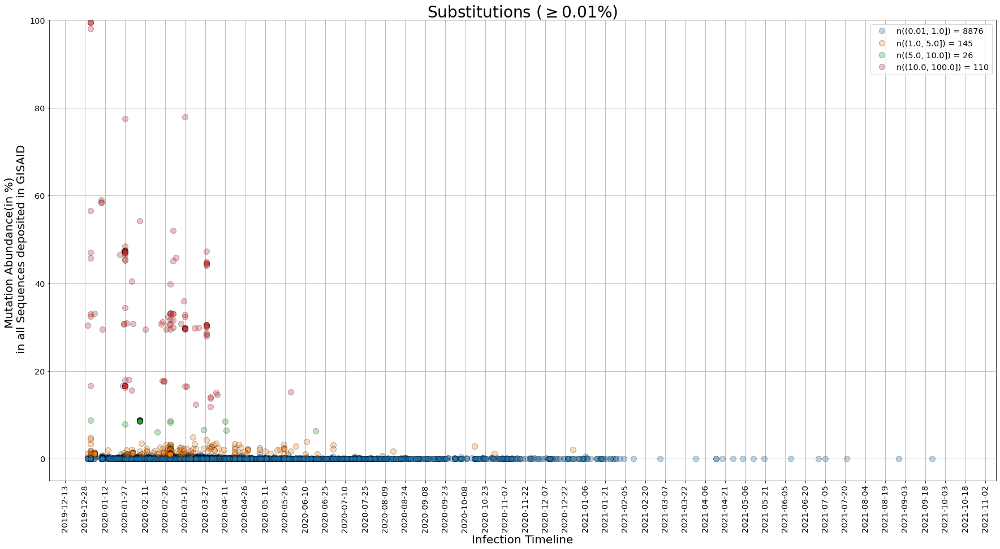

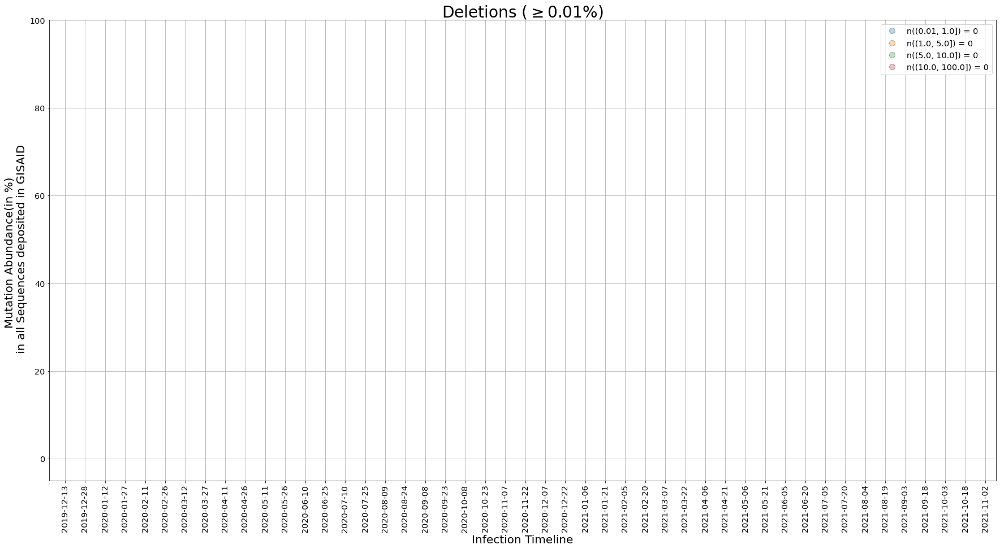

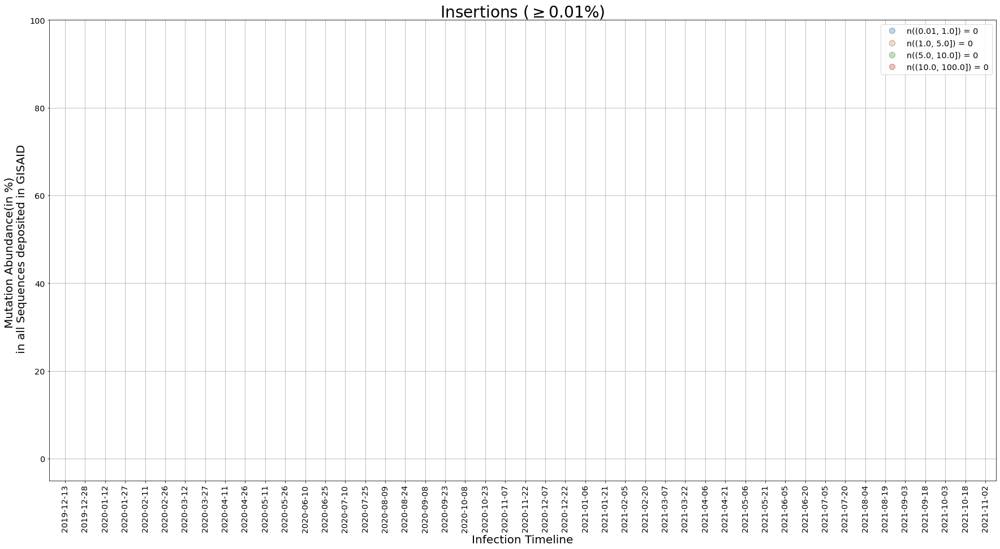

In [56]:
list_of_dfs = [df_per1_subs, df_per1_dels, df_per1_ins, 
               df_per_pt1_subs, df_per_pt1_dels, df_per_pt1_ins, 
               df_per_pt01_subs, df_per_pt01_dels, df_per_pt01_ins]

for x in list_of_dfs:
    
    plt.figure(figsize=(30,15), facecolor = (1, 1, 1))
    plt.grid(True)
#     Grouping the data
#     print(x.name)
    if '_1per' in x.name:
        test = x.groupby(pd.cut(x.per_abundance, [1, 5, 10, 100]))
    elif '_pt1per' in x.name:
        test = x.groupby(pd.cut(x.per_abundance, [0.1, 1, 5, 10, 100]))
    elif '_pt01per' in x.name:
        test = x.groupby(pd.cut(x.per_abundance, [0.01, 1, 5, 10, 100]))
    i = 0
    for names, group in test:
#         print(names, group)
        i += len(group.index)
#         print(len(group.index))
#     print(i == len(x.index))

    if 'subs' in x.name:
        if '_1per' in x.name:
            plt.title('Substitutions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in x.name:
            plt.title('Substitutions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in x.name:
            plt.title('Substitutions ($\geq$0.01%)', fontsize = 28)
    elif 'dels' in x.name:
        if '_1per' in x.name:
            plt.title('Deletions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in x.name:
            plt.title('Deletions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in x.name:
            plt.title('Deletions ($\geq$0.01%)', fontsize = 28)
    elif 'ins' in x.name:
        if '_1per' in x.name:
            plt.title('Insertions ($\geq$1%)', fontsize = 28)
        elif '_pt1per' in x.name:
            plt.title('Insertions ($\geq$0.1%)', fontsize = 28)
        elif '_pt01per' in x.name:
            plt.title('Insertions ($\geq$0.01%)', fontsize = 28)
    
#     plt.title('Top 100- Mutation Abundance vs Infection Timeline', fontsize = 28)
    plt.ylabel('Mutation Abundance(in %) \n in all Sequences deposited in GISAID', fontsize = 20)
    plt.xlabel('Infection Timeline', fontsize = 20)

#     # Adding Vertical lines for setting a cutoff
#     # For end of March 
#     # (https://www.analyticsvidhya.com/blog/2020/05/datetime-variables-python-pandas/)
#     from datetime import date
#     cutoff1 = date(2020,2,1)
#     cutoff2 = date(2020,4,1)
#     plt.axvline(x = cutoff1, color = 'black', linestyle = '--')
#     plt.axvline(x = cutoff2, color = 'black', linestyle = '--')
#     # Adding text on the vertical axes
#     plt.text(cutoff1, 75, "\nEnd of January \'20", rotation=90, verticalalignment='center', size = 18)
#     plt.text(cutoff2, 75, "\nEnd of March \'20", rotation=90, verticalalignment='center', size = 18)

    plt.xticks(rotation=90)
    plt.xticks(size='x-large')
    plt.yticks(size='x-large')
    
    for name, group in test:
        plt.plot(group['collection_date'], group['per_abundance'], linestyle = 'none', marker = 'o', markersize=10 , markeredgecolor='black', label='n('+str(name)+') = '+str(len(group.index)), alpha = 0.3)
    
    plt.xlim(date(2019,12,1),date(2021,11,10))
    plt.ylim(-5, 100)
#     # x-axis date representation formatting
#     date_format = mpl_dates.DateFormatter('%b %d, %y')
#     plt.gca().xaxis.set_major_formatter(date_format)
    plt.gca().xaxis.set_major_locator(mpl_dates.DayLocator(interval=15))
    plt.gca().xaxis.set_major_formatter(mpl_dates.DateFormatter('%Y-%m-%d'))
    plt.legend(loc = 'best')
    plt.legend(fontsize="x-large")
    
    

In [57]:
df[df.mutation_name.str.contains('N+')]

,collection_date,mutation_name,mutation_str,pos,ref,alt,count_of_seqs,fraction,fraction_corrected,per_abundance


#### R$^2$ Linear fit (Supplementary)

In [58]:
supp_df = df_ws[['collection_date', 'total_cases', 'total_seqs']]
supp_df['Cummulative Infections Worldwide (in millions)'] = supp_df['total_cases'] / (10**6)
supp_df['Cummulative sequences deposited in GISAID (in millions)'] = supp_df['total_seqs'] / (10**6)
supp_df

/local/scratch/41564533.1.interactive/ipykernel_248208/4133719537.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  supp_df['Cummulative Infections Worldwide (in millions)'] = supp_df['total_cases'] / (10**6)
/local/scratch/41564533.1.interactive/ipykernel_248208/4133719537.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  supp_df['Cummulative sequences deposited in GISAID (in millions)'] = supp_df['total_seqs'] / (10**6)


,collection_date,total_cases,total_seqs,Cummulative Infections Worldwide (in millions),Cummulative sequences deposited in GISAID (in millions)
0,2019-12-08,1,0.0,0.000001,0.000000
1,2019-12-09,1,0.0,0.000001,0.000000
2,2019-12-10,2,0.0,0.000002,0.000000
3,2019-12-11,2,0.0,0.000002,0.000000
4,2019-12-12,2,0.0,0.000002,0.000000
...,...,...,...,...,...
1260,2023-05-21,767007103,11740545.0,767.007103,11.740545
1261,2023-05-22,767134189,11740545.0,767.134189,11.740545
1262,2023-05-23,767169321,11740545.0,767.169321,11.740545
1263,2023-05-24,767211663,11740545.0,767.211663,11.740545


In [59]:
supp_df.iloc[170:210]

,collection_date,total_cases,total_seqs,Cummulative Infections Worldwide (in millions),Cummulative sequences deposited in GISAID (in millions)
170,2020-05-26,5497584,129566.0,5.497584,0.129566
171,2020-05-27,5587465,130454.0,5.587465,0.130454
172,2020-05-28,5687175,131167.0,5.687175,0.131167
173,2020-05-29,5795360,131898.0,5.795360,0.131898
174,2020-05-30,5915658,132376.0,5.915658,0.132376
175,2020-05-31,6036635,132765.0,6.036635,0.132765
176,2020-06-01,6163864,134462.0,6.163864,0.134462
177,2020-06-02,6272800,135281.0,6.272800,0.135281
178,2020-06-03,6371984,136078.0,6.371984,0.136078
179,2020-06-04,6496517,136869.0,6.496517,0.136869


In [60]:
res = stats.linregress(supp_df['Cummulative sequences deposited in GISAID (in millions)'], supp_df['Cummulative Infections Worldwide (in millions)'])
print(f"R-squared: {res.rvalue**2:.6f}")


R-squared: 0.975564


In [68]:
'./raw_data/owid/'+'infection_vs_sequences_data'+'.csv'

'./raw_data/owid/infection_vs_sequences_data.csv'

In [67]:
# supp_df.to_csv('./raw_data/owid/'+'infection_vs_sequences_data'+'.csv', index=False)

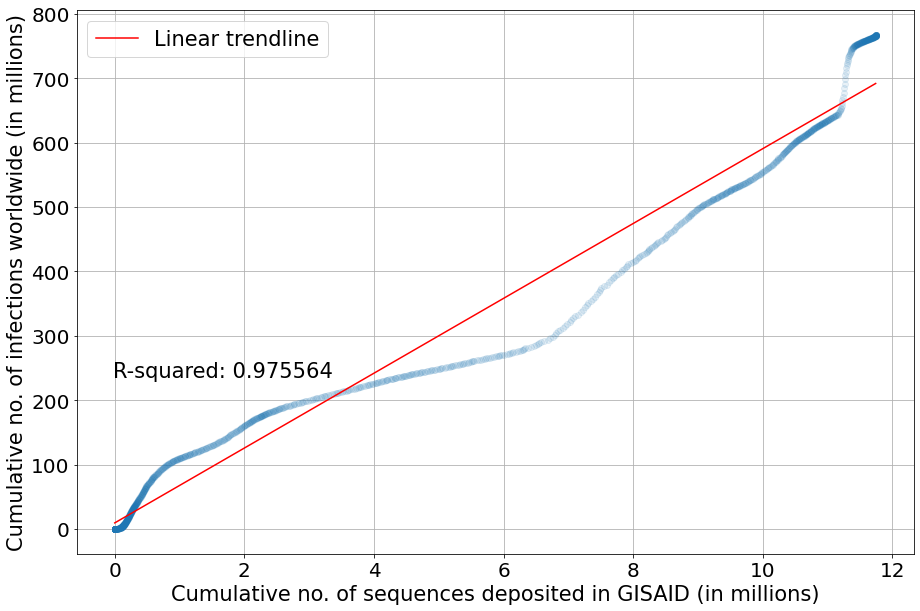

In [61]:
plt.figure(figsize=(15,10), facecolor=(1, 1, 1))
plt.grid(True)

plt.plot(supp_df['Cummulative sequences deposited in GISAID (in millions)'], supp_df['Cummulative Infections Worldwide (in millions)'], 'o', alpha=0.1) # , label='original data'
plt.plot(supp_df['Cummulative sequences deposited in GISAID (in millions)'], res.intercept + res.slope*supp_df['Cummulative sequences deposited in GISAID (in millions)'], 'r', label='Linear trendline')
# plt.legend()
plt.ylabel('Cumulative no. of infections worldwide (in millions)', fontsize = 21)
plt.xlabel('Cumulative no. of sequences deposited in GISAID (in millions)', fontsize = 21)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)


textstr = f'R-squared: {res.rvalue**2:.6f}'
# textstr = f'R-squared: {res.rvalue**2:.6f}\nCorrelation Coefficient={correlation_coefficient:.4f}'

# place a text box in upper left in axes coords
plt.gca().text(-0.02, 261, textstr, fontsize=21, verticalalignment='top')
# plt.gca().text(0.765, 45, textstr, fontsize=24, verticalalignment='top')

plt.legend(loc=2, fontsize=21)
# plt.savefig('Supplementary_Panel_1_A_r_squared.png', dpi=1000, bbox_inches='tight')
# plt.savefig('Supplementary_Panel_1_A.png', dpi=1000, bbox_inches='tight')


#### Misc plots

[Text(0.0, 0, '0.0'), Text(0.2, 0, '0.2'), Text(0.4, 0, '0.4'), Text(0.6000000000000001, 0, '0.6'), Text(0.8, 0, '0.8'), Text(1.0, 0, '1.0')]


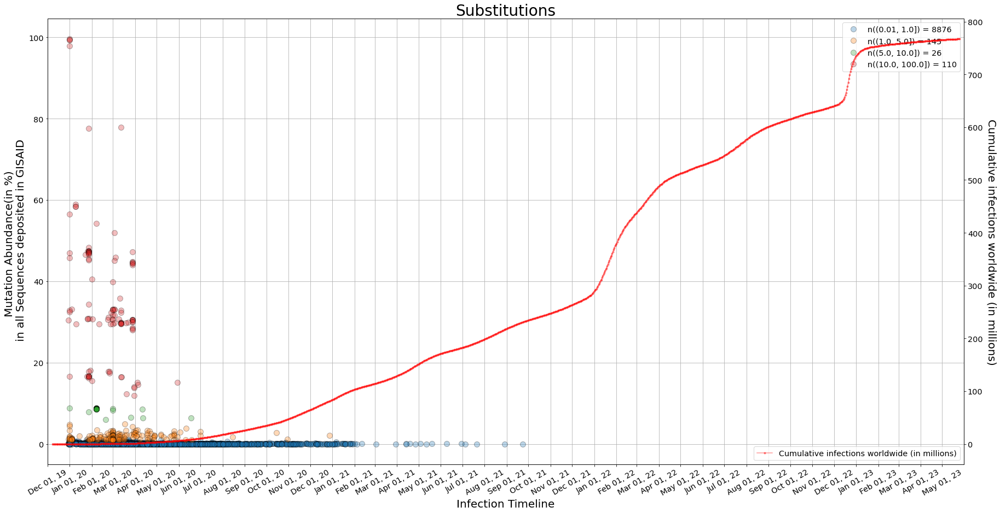

In [81]:
x = df_per_pt01_subs

plt.figure(figsize=(30,15), facecolor = (1, 1, 1))
plt.grid(True)
#     Grouping the data
#     print(x.name)
if '_1per' in x.name:
    test = x.groupby(pd.cut(x.per_abundance, [1, 5, 10, 100]))
elif '_pt1per' in x.name:
    test = x.groupby(pd.cut(x.per_abundance, [0.1, 1, 5, 10, 100]))
elif '_pt01per' in x.name:
    test = x.groupby(pd.cut(x.per_abundance, [0.01, 1, 5, 10, 100]))
i = 0

plt.title('Substitutions', fontsize = 28)
# if 'subs' in x.name:
#     if '_1per' in x.name:
#         plt.title('Substitutions ($\geq$1%)', fontsize = 28)
#     elif '_pt1per' in x.name:
#         plt.title('Substitutions ($\geq$0.1%)', fontsize = 28)
#     elif '_pt01per' in x.name:
#         plt.title('Substitutions ($\geq$0.01%)', fontsize = 28)
# elif 'dels' in x.name:
#     if '_1per' in x.name:
#         plt.title('Deletions ($\geq$1%)', fontsize = 28)
#     elif '_pt1per' in x.name:
#         plt.title('Deletions ($\geq$0.1%)', fontsize = 28)
#     elif '_pt01per' in x.name:
#         plt.title('Deletions ($\geq$0.01%)', fontsize = 28)
# elif 'ins' in x.name:
#     if '_1per' in x.name:
#         plt.title('Insertions ($\geq$1%)', fontsize = 28)
#     elif '_pt1per' in x.name:
#         plt.title('Insertions ($\geq$0.1%)', fontsize = 28)
#     elif '_pt01per' in x.name:
#         plt.title('Insertions ($\geq$0.01%)', fontsize = 28)

#     plt.title('Top 100- Mutation Abundance vs Infection Timeline', fontsize = 28)

plt.xlabel('Infection Timeline', fontsize = 20)

#     # Adding Vertical lines for setting a cutoff
#     # For end of March 
#     # (https://www.analyticsvidhya.com/blog/2020/05/datetime-variables-python-pandas/)
#     from datetime import date
#     cutoff1 = date(2020,2,1)
#     cutoff2 = date(2020,4,1)
#     plt.axvline(x = cutoff1, color = 'black', linestyle = '--')
#     plt.axvline(x = cutoff2, color = 'black', linestyle = '--')
#     # Adding text on the vertical axes
#     plt.text(cutoff1, 75, "\nEnd of January \'20", rotation=90, verticalalignment='center', size = 18)
#     plt.text(cutoff2, 75, "\nEnd of March \'20", rotation=90, verticalalignment='center', size = 18)

plt.xticks(rotation=30)
plt.xticks(size='x-large')
plt.yticks(size='x-large')

print(plt.gca().get_xticklabels())

plt.ylabel('Mutation Abundance(in %) \n in all Sequences deposited in GISAID', fontsize = 20)
for name, group in test:
    plt.plot(group['collection_date'], group['per_abundance'], linestyle = 'none', marker = 'o', markersize=10 , markeredgecolor='black', label='n('+str(name)+') = '+str(len(group.index)), alpha = 0.3)

plt.xlim(date(2019,12,1),date(2023,5,31))
# plt.ylim(-5, 100)
#     # x-axis date representation formatting
#     date_format = mpl_dates.DateFormatter('%b %d, %y')
#     plt.gca().xaxis.set_major_formatter(date_format)
plt.gca().xaxis.set_major_locator(mpl_dates.MonthLocator(interval=1))
plt.gca().xaxis.set_major_formatter(mpl_dates.DateFormatter('%b %d, %y'))
plt.legend(loc = 'upper right', fontsize="x-large")

# Adding secondary Y-axis
plt.twinx()
plt.ylabel('Cumulative infections worldwide (in millions)', fontsize = 20, labelpad = 25).set_rotation(270)
plt.plot(supp_df['collection_date'], supp_df['Cummulative Infections Worldwide (in millions)'], color='red', marker='.', alpha=0.4, label='Cumulative infections worldwide (in millions)')
# plt.plot(supp_df['Cummulative sequences deposited in GISAID (in millions)'], supp_df['Cummulative Infections Worldwide (in millions)'], linestyle = '-', color='red', marker='s', alpha=0.4, label='Cumulative infections worldwide (in millions)')
# plt.plot(world_data["date_pd"], world_data["total_cases"], label = 'Total cases worldwide', color = 'red', marker = 's', alpha = 0.4)
plt.xticks(size='x-large')
plt.yticks(size='x-large')
plt.gca().xaxis.set_major_locator(mpl_dates.MonthLocator(interval=1))
plt.gca().xaxis.set_major_formatter(mpl_dates.DateFormatter('%b %d, %y'))
# plt.gca().set_xticklabels(xtick_labs)
plt.legend(loc = 'lower right', fontsize="x-large")



In [82]:
supp_df['collection_date_str'] = supp_df.collection_date.dt.strftime('%Y-%m-%d')
test = supp_df[supp_df.collection_date_str.str.contains('....-..-01')]

# Creating xticklabels for the 2 Y-axis plot
ini_xtick = list(test['Cummulative sequences deposited in GISAID (in millions)'])
fin_xtick = list(test['collection_date'].dt.strftime('%b %d, %y'))
# print(len(ini_xtick) == len(fin_xtick))

xtick_labs = list()
xtick_labs.append(str(0)+'\n(Dec 01, 19)')
for i in range(len(ini_xtick)):
    
    xtick_labs.append(str(ini_xtick[i])+'\n('+fin_xtick[i]+')')

/local/scratch/40399868.1.interactive/ipykernel_275765/1501492187.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  supp_df['collection_date_str'] = supp_df.collection_date.dt.strftime('%Y-%m-%d')


[Text(0.0, 0, '0.0'), Text(0.2, 0, '0.2'), Text(0.4, 0, '0.4'), Text(0.6000000000000001, 0, '0.6'), Text(0.8, 0, '0.8'), Text(1.0, 0, '1.0')]


/local/scratch/40399868.1.interactive/ipykernel_275765/3307650351.py:84: UserWarning: FixedFormatter should only be used together with FixedLocator
  plt.gca().set_xticklabels(xtick_labs)


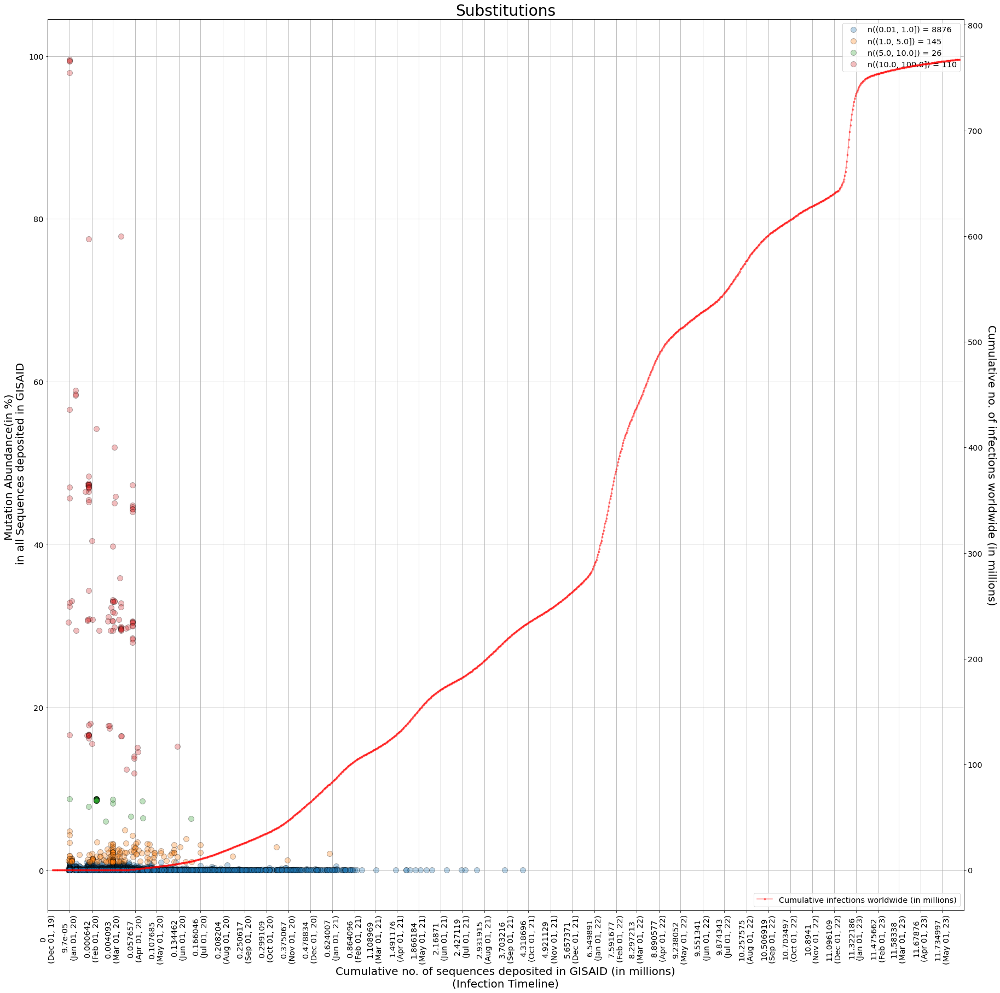

In [83]:
x = df_per_pt01_subs

plt.figure(figsize=(30,30), facecolor = (1, 1, 1))
plt.grid(True)
#     Grouping the data
#     print(x.name)
if '_1per' in x.name:
    test = x.groupby(pd.cut(x.per_abundance, [1, 5, 10, 100]))
elif '_pt1per' in x.name:
    test = x.groupby(pd.cut(x.per_abundance, [0.1, 1, 5, 10, 100]))
elif '_pt01per' in x.name:
    test = x.groupby(pd.cut(x.per_abundance, [0.01, 1, 5, 10, 100]))
i = 0

plt.title('Substitutions', fontsize = 28)
# if 'subs' in x.name:
#     if '_1per' in x.name:
#         plt.title('Substitutions ($\geq$1%)', fontsize = 28)
#     elif '_pt1per' in x.name:
#         plt.title('Substitutions ($\geq$0.1%)', fontsize = 28)
#     elif '_pt01per' in x.name:
#         plt.title('Substitutions ($\geq$0.01%)', fontsize = 28)
# elif 'dels' in x.name:
#     if '_1per' in x.name:
#         plt.title('Deletions ($\geq$1%)', fontsize = 28)
#     elif '_pt1per' in x.name:
#         plt.title('Deletions ($\geq$0.1%)', fontsize = 28)
#     elif '_pt01per' in x.name:
#         plt.title('Deletions ($\geq$0.01%)', fontsize = 28)
# elif 'ins' in x.name:
#     if '_1per' in x.name:
#         plt.title('Insertions ($\geq$1%)', fontsize = 28)
#     elif '_pt1per' in x.name:
#         plt.title('Insertions ($\geq$0.1%)', fontsize = 28)
#     elif '_pt01per' in x.name:
#         plt.title('Insertions ($\geq$0.01%)', fontsize = 28)

#     plt.title('Top 100- Mutation Abundance vs Infection Timeline', fontsize = 28)

plt.xlabel('Cumulative no. of sequences deposited in GISAID (in millions)\n(Infection Timeline)', fontsize = 20)

#     # Adding Vertical lines for setting a cutoff
#     # For end of March 
#     # (https://www.analyticsvidhya.com/blog/2020/05/datetime-variables-python-pandas/)
#     from datetime import date
#     cutoff1 = date(2020,2,1)
#     cutoff2 = date(2020,4,1)
#     plt.axvline(x = cutoff1, color = 'black', linestyle = '--')
#     plt.axvline(x = cutoff2, color = 'black', linestyle = '--')
#     # Adding text on the vertical axes
#     plt.text(cutoff1, 75, "\nEnd of January \'20", rotation=90, verticalalignment='center', size = 18)
#     plt.text(cutoff2, 75, "\nEnd of March \'20", rotation=90, verticalalignment='center', size = 18)

plt.xticks(rotation=90)
plt.xticks(size='x-large')
plt.yticks(size='x-large')

print(plt.gca().get_xticklabels())

plt.ylabel('Mutation Abundance(in %) \n in all Sequences deposited in GISAID', fontsize = 20)
for name, group in test:
    plt.plot(group['collection_date'], group['per_abundance'], linestyle = 'none', marker = 'o', markersize=10 , markeredgecolor='black', label='n('+str(name)+') = '+str(len(group.index)), alpha = 0.3)

plt.xlim(date(2019,12,1),date(2023,5,31))
# plt.ylim(-5, 100)
#     # x-axis date representation formatting
#     date_format = mpl_dates.DateFormatter('%b %d, %y')
#     plt.gca().xaxis.set_major_formatter(date_format)
plt.gca().xaxis.set_major_locator(mpl_dates.MonthLocator(interval=1))
plt.gca().xaxis.set_major_formatter(mpl_dates.DateFormatter('%b %d, %y'))
plt.legend(loc = 'upper right', fontsize="x-large")

# Adding secondary Y-axis
plt.twinx()

plt.ylabel('Cumulative no. of infections worldwide (in millions)', fontsize = 20, labelpad = 25).set_rotation(270)
plt.plot(supp_df['collection_date'], supp_df['Cummulative Infections Worldwide (in millions)'], color='red', marker='.', alpha=0.4, label='Cumulative infections worldwide (in millions)')
# plt.plot(supp_df['Cummulative sequences deposited in GISAID (in millions)'], supp_df['Cummulative Infections Worldwide (in millions)'], linestyle = '-', color='red', marker='s', alpha=0.4, label='Cumulative infections worldwide (in millions)')
# plt.plot(world_data["date_pd"], world_data["total_cases"], label = 'Total cases worldwide', color = 'red', marker = 's', alpha = 0.4)
plt.xticks(size='x-large')
plt.yticks(size='x-large')
plt.gca().xaxis.set_major_locator(mpl_dates.MonthLocator(interval=1))
plt.gca().xaxis.set_major_formatter(mpl_dates.DateFormatter('%b %d, %y'))
plt.gca().set_xticklabels(xtick_labs)
plt.legend(loc = 'lower right', fontsize="x-large")



In [84]:
test = supp_df[supp_df.collection_date_str.str.contains('....-..-01')]
test

,collection_date,total_cases,total_seqs,Cummulative Infections Worldwide (in millions),Cummulative sequences deposited in GISAID (in millions),collection_date_str
24,2020-01-01,87,97.0,0.000087,0.000097,2020-01-01
55,2020-02-01,12146,642.0,0.012146,0.000642,2020-02-01
84,2020-03-01,86649,4093.0,0.086649,0.004093,2020-03-01
115,2020-04-01,891604,57657.0,0.891604,0.057657,2020-04-01
145,2020-05-01,3222442,107685.0,3.222442,0.107685,2020-05-01
176,2020-06-01,6163864,134462.0,6.163864,0.134462,2020-06-01
206,2020-07-01,10491361,166046.0,10.491361,0.166046,2020-07-01
237,2020-08-01,17658898,208204.0,17.658898,0.208204,2020-08-01
268,2020-09-01,25900895,250617.0,25.900895,0.250617,2020-09-01
298,2020-10-01,34719727,299109.0,34.719727,0.299109,2020-10-01


### More plots

In [85]:
df_sorted_collection_date = df.sort_values(by="collection_date").reset_index(drop=True)
df_sorted_collection_date

,collection_date,mutation_name,mutation_str,pos,ref,alt,count_of_seqs,fraction,fraction_corrected,per_abundance
0,2019-12-30,A21137G,1|21137|A|G,21137,A,G,136073,0.021286,0.011590,1.159001
1,2019-12-30,T6996C,1|6996|T|C,6996,T,C,1423,0.000223,0.000121,0.012120
2,2019-12-30,G20679A,1|20679|G|A,20679,G,A,4537,0.000710,0.000386,0.038644
3,2019-12-30,C9534T,1|9534|C|T,9534,C,T,3574520,0.559164,0.304459,30.445946
4,2019-12-30,T28144C,1|28144|T|C,28144,T,C,16870,0.002639,0.001437,0.143690
...,...,...,...,...,...,...,...,...,...,...
9152,2021-06-30,A28652C,1|28652|A|C,28652,A,C,3673,0.000575,0.000313,0.031285
9153,2021-07-05,T6564G,1|6564|T|G,6564,T,G,1342,0.000210,0.000114,0.011430
9154,2021-07-21,T22196A,1|22196|T|A,22196,T,A,1302,0.000204,0.000111,0.011090
9155,2021-08-29,T7995G,1|7995|T|G,7995,T,G,1453,0.000227,0.000124,0.012376


In [86]:
df_sorted_per_abundance = df.sort_values(by="per_abundance", ascending=False).reset_index(drop=True)
df_sorted_per_abundance = df_sorted_per_abundance[df_sorted_per_abundance.per_abundance >= 0.01]
df_sorted_per_abundance

,collection_date,mutation_name,mutation_str,pos,ref,alt,count_of_seqs,fraction,fraction_corrected,per_abundance
0,2020-01-01,A23403G,1|23403|A|G,23403,A,G,11692133,1.829007,0.995877,99.587651
1,2020-01-01,C3037T,1|3037|C|T,3037,C,T,11670729,1.825659,0.994053,99.405343
2,2020-01-01,C14408T,1|14408|C|T,14408,C,T,11669447,1.825458,0.993944,99.394423
3,2020-01-01,C241T,1|241|C|T,241,C,T,11499166,1.798821,0.979441,97.944056
4,2020-03-12,C22995A,1|22995|C|A,22995,C,A,9139297,1.429666,0.778439,77.843891
...,...,...,...,...,...,...,...,...,...,...
9152,2020-03-28,G24947A,1|24947|G|A,24947,G,A,1175,0.000184,0.000100,0.010008
9153,2020-04-17,T19095C,1|19095|T|C,19095,T,C,1175,0.000184,0.000100,0.010008
9154,2020-04-18,A24619G,1|24619|A|G,24619,A,G,1175,0.000184,0.000100,0.010008
9155,2020-07-07,A1870G,1|1870|A|G,1870,A,G,1175,0.000184,0.000100,0.010008


In [87]:
df_geq1per = df_sorted_per_abundance.query("per_abundance >= 1")
df_geqpt1per = df_sorted_per_abundance.query("per_abundance >= 0.1")

In [88]:
df_top100 = df_sorted_per_abundance.head(n=100)
df_top1000 = df_sorted_per_abundance.head(n=1000)

In [89]:
df_top100

,collection_date,mutation_name,mutation_str,pos,ref,alt,count_of_seqs,fraction,fraction_corrected,per_abundance
0,2020-01-01,A23403G,1|23403|A|G,23403,A,G,11692133,1.829007,0.995877,99.587651
1,2020-01-01,C3037T,1|3037|C|T,3037,C,T,11670729,1.825659,0.994053,99.405343
2,2020-01-01,C14408T,1|14408|C|T,14408,C,T,11669447,1.825458,0.993944,99.394423
3,2020-01-01,C241T,1|241|C|T,241,C,T,11499166,1.798821,0.979441,97.944056
4,2020-03-12,C22995A,1|22995|C|A,22995,C,A,9139297,1.429666,0.778439,77.843891
...,...,...,...,...,...,...,...,...,...,...
95,2020-01-01,T13195C,1|13195|T|C,13195,T,C,1947833,0.304701,0.165907,16.590652
96,2020-01-27,G8393A,1|8393|G|A,8393,G,A,1945084,0.304271,0.165672,16.567238
97,2020-01-25,C24130A,1|24130|C|A,24130,C,A,1944255,0.304141,0.165602,16.560177
98,2020-01-27,C24503T,1|24503|C|T,24503,C,T,1943280,0.303988,0.165519,16.551872


In [90]:
df_top1000

,collection_date,mutation_name,mutation_str,pos,ref,alt,count_of_seqs,fraction,fraction_corrected,per_abundance
0,2020-01-01,A23403G,1|23403|A|G,23403,A,G,11692133,1.829007,0.995877,99.587651
1,2020-01-01,C3037T,1|3037|C|T,3037,C,T,11670729,1.825659,0.994053,99.405343
2,2020-01-01,C14408T,1|14408|C|T,14408,C,T,11669447,1.825458,0.993944,99.394423
3,2020-01-01,C241T,1|241|C|T,241,C,T,11499166,1.798821,0.979441,97.944056
4,2020-03-12,C22995A,1|22995|C|A,22995,C,A,9139297,1.429666,0.778439,77.843891
...,...,...,...,...,...,...,...,...,...,...
995,2020-03-02,C5826T,1|5826|C|T,5826,C,T,18804,0.002942,0.001602,0.160163
996,2020-03-10,C22987T,1|22987|C|T,22987,C,T,18804,0.002942,0.001602,0.160163
997,2020-02-25,G2246A,1|2246|G|A,2246,G,A,18802,0.002941,0.001601,0.160146
998,2020-03-17,C22224T,1|22224|C|T,22224,C,T,18768,0.002936,0.001599,0.159856


In [91]:
# df_sorted_per_abundance.to_csv('./Supplementary Files/'+'subs_only/'+'df_sorted_per_abundance'+'.csv', index=False)
# df_top100.to_csv('./Supplementary Files/'+'subs_only/'+'df_top100'+'.csv', index=False)
# df_top1000.to_csv('./Supplementary Files/'+'subs_only/'+'df_top1000'+'.csv', index=False)

#### Mutations over time

In [92]:
df_sorted_per_abundance = df.sort_values(by="per_abundance", ascending=False).reset_index(drop=True)
df_sorted_per_abundance = df_sorted_per_abundance[df_sorted_per_abundance.per_abundance >= 0.01]
df_sorted_per_abundance

,collection_date,mutation_name,mutation_str,pos,ref,alt,count_of_seqs,fraction,fraction_corrected,per_abundance
0,2020-01-01,A23403G,1|23403|A|G,23403,A,G,11692133,1.829007,0.995877,99.587651
1,2020-01-01,C3037T,1|3037|C|T,3037,C,T,11670729,1.825659,0.994053,99.405343
2,2020-01-01,C14408T,1|14408|C|T,14408,C,T,11669447,1.825458,0.993944,99.394423
3,2020-01-01,C241T,1|241|C|T,241,C,T,11499166,1.798821,0.979441,97.944056
4,2020-03-12,C22995A,1|22995|C|A,22995,C,A,9139297,1.429666,0.778439,77.843891
...,...,...,...,...,...,...,...,...,...,...
9152,2020-03-28,G24947A,1|24947|G|A,24947,G,A,1175,0.000184,0.000100,0.010008
9153,2020-04-17,T19095C,1|19095|T|C,19095,T,C,1175,0.000184,0.000100,0.010008
9154,2020-04-18,A24619G,1|24619|A|G,24619,A,G,1175,0.000184,0.000100,0.010008
9155,2020-07-07,A1870G,1|1870|A|G,1870,A,G,1175,0.000184,0.000100,0.010008


In [93]:
df_top100

,collection_date,mutation_name,mutation_str,pos,ref,alt,count_of_seqs,fraction,fraction_corrected,per_abundance
0,2020-01-01,A23403G,1|23403|A|G,23403,A,G,11692133,1.829007,0.995877,99.587651
1,2020-01-01,C3037T,1|3037|C|T,3037,C,T,11670729,1.825659,0.994053,99.405343
2,2020-01-01,C14408T,1|14408|C|T,14408,C,T,11669447,1.825458,0.993944,99.394423
3,2020-01-01,C241T,1|241|C|T,241,C,T,11499166,1.798821,0.979441,97.944056
4,2020-03-12,C22995A,1|22995|C|A,22995,C,A,9139297,1.429666,0.778439,77.843891
...,...,...,...,...,...,...,...,...,...,...
95,2020-01-01,T13195C,1|13195|T|C,13195,T,C,1947833,0.304701,0.165907,16.590652
96,2020-01-27,G8393A,1|8393|G|A,8393,G,A,1945084,0.304271,0.165672,16.567238
97,2020-01-25,C24130A,1|24130|C|A,24130,C,A,1944255,0.304141,0.165602,16.560177
98,2020-01-27,C24503T,1|24503|C|T,24503,C,T,1943280,0.303988,0.165519,16.551872


In [94]:
# df_sorted_per_abundance.query('pos >= 21563 and pos <= 25384')
# df_sorted_per_abundance[(df_sorted_per_abundance.pos >= 21563) & (df_sorted_per_abundance.pos <= 25384)]
# df_sorted_per_abundance.query('pos >= 21563 and pos <= 25384').equals(df_sorted_per_abundance[(df_sorted_per_abundance.pos >= 21563) & (df_sorted_per_abundance.pos <= 25384)])

df_spike = df_sorted_per_abundance[(df_sorted_per_abundance.pos >= 21563) & (df_sorted_per_abundance.pos <= 25384)].sort_values(by="per_abundance", ascending=False).reset_index(drop=True)
df_nonspike = df_sorted_per_abundance[~((df_sorted_per_abundance.pos >= 21563) & (df_sorted_per_abundance.pos <= 25384))].sort_values(by="per_abundance", ascending=False).reset_index(drop=True)

df_top100_spike = df_spike.head(n=100)
df_top100_nonspike = df_nonspike.head(n=100)

df_top1000_spike = df_spike.head(n=1000)
df_top1000_nonspike = df_nonspike.head(n=1000)


In [95]:
df_geq1per_spike = df_spike.query("per_abundance >= 1")
df_geqpt1per_spike = df_spike.query("per_abundance >= 0.1")

df_geq1per_nonspike = df_nonspike.query("per_abundance >= 1")
df_geqpt1per_nonspike = df_nonspike.query("per_abundance >= 0.1")

In [96]:
# df_geq1per_spike.to_csv('./Supplementary Files/'+'subs_only/'+'df_geq1per_spike'+'.csv', index=False)
# df_geqpt1per_spike.to_csv('./Supplementary Files/'+'subs_only/'+'df_geqpt1per_spike'+'.csv', index=False)

# df_geq1per_nonspike.to_csv('./Supplementary Files/'+'subs_only/'+'df_geq1per_nonspike'+'.csv', index=False)
# df_geqpt1per_nonspike.to_csv('./Supplementary Files/'+'subs_only/'+'df_geqpt1per_nonspike'+'.csv', index=False)

In [97]:
# df_top100_spike.to_csv('./Supplementary Files/'+'subs_only/'+'df_top100_spike'+'.csv', index=False)
# df_top1000_spike.to_csv('./Supplementary Files/'+'subs_only/'+'df_top1000_spike'+'.csv', index=False)

# df_top100_nonspike.to_csv('./Supplementary Files/'+'subs_only/'+'df_top100_nonspike'+'.csv', index=False)
# df_top1000_nonspike.to_csv('./Supplementary Files/'+'subs_only/'+'df_top1000_nonspike'+'.csv', index=False)

In [98]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Convert 'collection_date' column to datetime
# df_sorted_per_abundance['collection_date'] = pd.to_datetime(df_sorted_per_abundance['collection_date'])

# Define bin boundaries
bin_boundaries = [
    pd.to_datetime('2020-01-01'),  # Jan 20
    pd.to_datetime('2020-02-01'),  # Feb 20
    pd.to_datetime('2020-03-01'),  # Mar 20
    pd.to_datetime('2020-04-01'),  # Apr 20
    pd.to_datetime('2020-07-01'),  # Jul 20
    pd.to_datetime('2021-01-01'),  # Jan 21
    df_sorted_per_abundance['collection_date'].max()  # Last recorded date
]

# Assign rows to bins
df_sorted_per_abundance['bin'] = pd.cut(df_sorted_per_abundance['collection_date'], bins=bin_boundaries)

In [99]:
df_sorted_per_abundance

,collection_date,mutation_name,mutation_str,pos,ref,alt,count_of_seqs,fraction,fraction_corrected,per_abundance,bin
0,2020-01-01,A23403G,1|23403|A|G,23403,A,G,11692133,1.829007,0.995877,99.587651,NaN
1,2020-01-01,C3037T,1|3037|C|T,3037,C,T,11670729,1.825659,0.994053,99.405343,NaN
2,2020-01-01,C14408T,1|14408|C|T,14408,C,T,11669447,1.825458,0.993944,99.394423,NaN
3,2020-01-01,C241T,1|241|C|T,241,C,T,11499166,1.798821,0.979441,97.944056,NaN
4,2020-03-12,C22995A,1|22995|C|A,22995,C,A,9139297,1.429666,0.778439,77.843891,"(2020-03-01, 2020-04-01]"
...,...,...,...,...,...,...,...,...,...,...,...
9152,2020-03-28,G24947A,1|24947|G|A,24947,G,A,1175,0.000184,0.000100,0.010008,"(2020-03-01, 2020-04-01]"
9153,2020-04-17,T19095C,1|19095|T|C,19095,T,C,1175,0.000184,0.000100,0.010008,"(2020-04-01, 2020-07-01]"
9154,2020-04-18,A24619G,1|24619|A|G,24619,A,G,1175,0.000184,0.000100,0.010008,"(2020-04-01, 2020-07-01]"
9155,2020-07-07,A1870G,1|1870|A|G,1870,A,G,1175,0.000184,0.000100,0.010008,"(2020-07-01, 2021-01-01]"


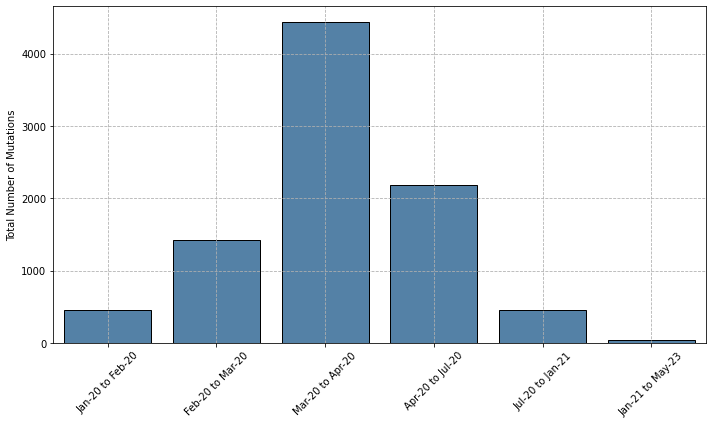

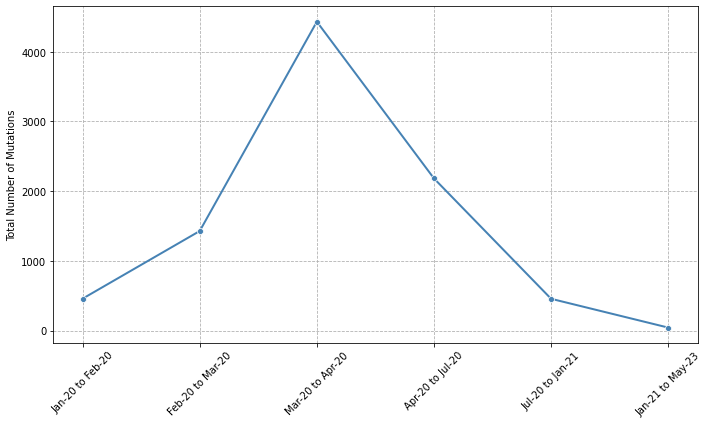

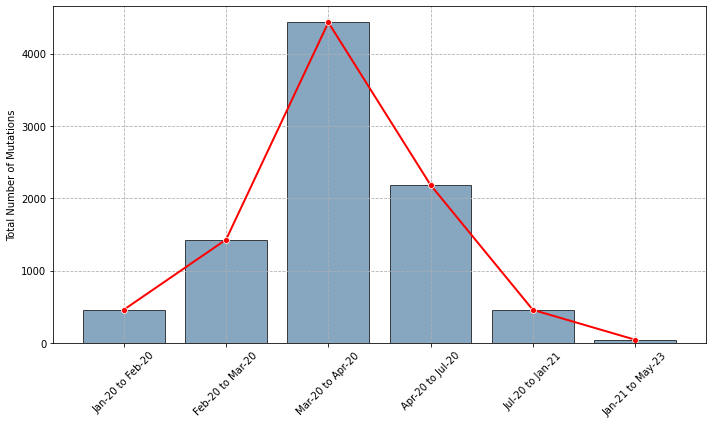

In [100]:
# Define bin boundaries
bin_boundaries = [
    pd.to_datetime('2020-01-01'),  # Jan 20
    pd.to_datetime('2020-02-01'),  # Feb 20
    pd.to_datetime('2020-03-01'),  # Mar 20
    pd.to_datetime('2020-04-01'),  # Apr 20
    pd.to_datetime('2020-07-01'),  # Jul 20
    pd.to_datetime('2021-01-01'),  # Jan 21
    pd.to_datetime('2023-05-25'), # Last recorded date
    # df_sorted_per_abundance['collection_date'].max() #+ pd.DateOffset(months=1)  # Last recorded date + 1 month
]

# Assign rows to bins
df_sorted_per_abundance['bin'] = pd.cut(df_sorted_per_abundance['collection_date'], bins=bin_boundaries)

# Calculate mutation counts in each bin
mutation_counts = df_sorted_per_abundance.groupby('bin').size()

# # Create the plot
# plt.figure(figsize=(10, 6))
# plt.bar(range(len(mutation_counts)), mutation_counts.values)
# plt.xlabel('Bins')
# plt.ylabel('Total Number of Mutations')
# plt.title('Total Number of Mutations in Each Bin')
# plt.xticks(range(len(bin_boundaries[:-1])), [f"{start.strftime('%Y-%m')} to {end.strftime('%Y-%m')}" for start, end in zip(bin_boundaries[:-1], bin_boundaries[1:])], rotation=45)
# plt.show()


# Create the plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x=[f"{start.strftime('%b-%y')} to {end.strftime('%b-%y')}" for start, end in zip(bin_boundaries[:-1], bin_boundaries[1:])],
            y=mutation_counts.values,
            color='steelblue',
            edgecolor='black')  # Add black borders to the bars
# plt.xlabel('Bins')
plt.ylabel('Total Number of Mutations')
# plt.title('Total Number of Mutations in Each Bin')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True, which='both', linestyle='--')
plt.show()


# Create the line plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(x=[f"{start.strftime('%b-%y')} to {end.strftime('%b-%y')}" for start, end in zip(bin_boundaries[:-1], bin_boundaries[1:])],
             y=mutation_counts.values,
             marker='o',
             color='steelblue',
             linewidth=2)
# plt.xlabel('Bins')
plt.ylabel('Total Number of Mutations')
# plt.title('Total Number of Mutations over Time')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True, which='both', linestyle='--')
plt.show()

# Create the overlaid plot with bar and line plots
plt.figure(figsize=(10, 6))
sns.barplot(x=[f"{start.strftime('%b-%y')} to {end.strftime('%b-%y')}" for start, end in zip(bin_boundaries[:-1], bin_boundaries[1:])],
            y=mutation_counts.values,
            color='steelblue',
            edgecolor='black',
            alpha=0.7)
sns.lineplot(x=[f"{start.strftime('%b-%y')} to {end.strftime('%b-%y')}" for start, end in zip(bin_boundaries[:-1], bin_boundaries[1:])],
             y=mutation_counts.values,
             marker='o',
             color='red',
             linewidth=2)
# plt.xlabel('Bins')
plt.ylabel('Total Number of Mutations')
# plt.title('Total Number of Mutations over Time')
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True, which='both', linestyle='--')
plt.show()

In [101]:
df_sorted_per_abundance.groupby('bin').size()

bin
(2020-01-01, 2020-02-01]     459
(2020-02-01, 2020-03-01]    1429
(2020-03-01, 2020-04-01]    4431
(2020-04-01, 2020-07-01]    2183
(2020-07-01, 2021-01-01]     457
(2021-01-01, 2023-05-25]      44
dtype: int64

In [102]:
df_owid = pd.read_csv("./owid_china_world_jan20tojun20.csv")
df_owid['date'] = pd.to_datetime(df_owid['date'], format='%Y-%m-%d')
df_owid

,location,date,total_cases,new_cases
0,China,2020-01-03,0,0
1,China,2020-01-04,1,1
2,China,2020-01-05,1,0
3,China,2020-01-06,4,3
4,China,2020-01-07,4,0
...,...,...,...,...
445,Rest of the World,2020-05-27,5498482,89880
446,Rest of the World,2020-05-28,5598189,99707
447,Rest of the World,2020-05-29,5706374,108185
448,Rest of the World,2020-05-30,5826654,120280


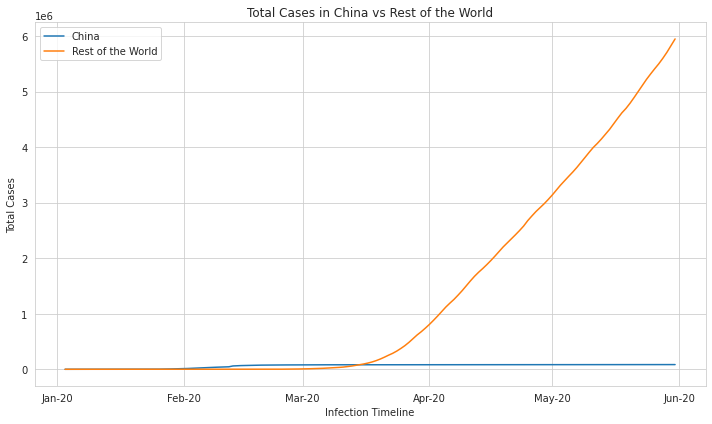

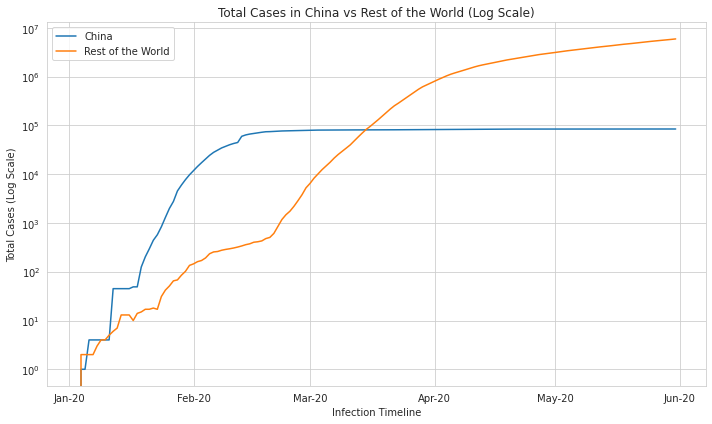

In [103]:
# Filter the dataframe for China and the rest of the world
df_china = df_owid[df_owid['location'] == 'China']
df_rest_of_world = df_owid[df_owid['location'] == 'Rest of the World']

# Set Seaborn style
sns.set_style('whitegrid')

# # Create the line plot using Seaborn
# plt.figure(figsize=(10, 6))
# sns.lineplot(x='date', y='total_cases', data=df_china, label='China')
# sns.lineplot(x='date', y='total_cases', data=df_rest_of_world, label='Rest of the World')
# plt.xlabel('Date')
# plt.ylabel('Total Cases')
# plt.title('Total Cases in China vs Rest of the World')
# plt.xticks(rotation=45)
# plt.tight_layout()
# plt.legend()
# plt.show()
# # Create the line plot using Seaborn with logarithmic y-axis
# plt.figure(figsize=(10, 6))
# sns.lineplot(x='date', y='total_cases', data=df_china, label='China')
# sns.lineplot(x='date', y='total_cases', data=df_rest_of_world, label='Rest of the World')
# plt.xlabel('Date')
# plt.ylabel('Total Cases (Log Scale)')
# plt.title('Total Cases in China vs Rest of the World (Log Scale)')
# plt.xticks(rotation=45)
# plt.yscale('log')  # Set the y-axis to use logarithmic scale
# plt.tight_layout()
# plt.legend()
# plt.show()

# Create the line plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(x='date', y='total_cases', data=df_china, label='China')
sns.lineplot(x='date', y='total_cases', data=df_rest_of_world, label='Rest of the World')
plt.xlabel('Infection Timeline')
plt.ylabel('Total Cases')
plt.title('Total Cases in China vs Rest of the World')
# plt.xticks(rotation=45)

# Format the x-axis labels
date_formatter = DateFormatter('%b-%y')
plt.gca().xaxis.set_major_formatter(date_formatter)

plt.tight_layout()
plt.legend()
plt.show()

# Create the line plot using Seaborn with logarithmic y-axis
plt.figure(figsize=(10, 6))
sns.lineplot(x='date', y='total_cases', data=df_china, label='China')
sns.lineplot(x='date', y='total_cases', data=df_rest_of_world, label='Rest of the World')
plt.xlabel('Infection Timeline')
plt.ylabel('Total Cases (Log Scale)')
plt.title('Total Cases in China vs Rest of the World (Log Scale)')
# plt.xticks(rotation=45)

# Format the x-axis labels
date_formatter = DateFormatter('%b-%y')
plt.gca().xaxis.set_major_formatter(date_formatter)

plt.yscale('log')  # Set the y-axis to use logarithmic scale
plt.tight_layout()
plt.legend()
plt.show()

In [104]:
# ---------------------------------------------------------------------------
# Spike vs Rest- Top 100 ---------------------------------------------------
# ---------------------------------------------------------------------------

# Extract year and month from the 'collection_date' column
df_top100_spike['year_month'] = df_top100_spike['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_top100_spike = df_top100_spike.groupby('year_month').size()

# Extract year and month from the 'collection_date' column
df_top100_nonspike['year_month'] = df_top100_nonspike['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_top100_nonspike = df_top100_nonspike.groupby('year_month').size()


# Create a date range from Dec 2019 till May 2023
date_range = pd.date_range(start='2019-12-01', end='2023-05-31', freq='M')

# Initialize an empty list to store the data for the DataFrame
data = []

# Iterate through the date range and fill in the data
for date in date_range:
    year_month_str = date.strftime('%Y-%m')
    spike_value = total_mutations_per_month_top100_spike.get(year_month_str, 0)
    nonspike_value = total_mutations_per_month_top100_nonspike.get(year_month_str, 0)
    data.append({'Infection Timeline': date, 'Spike': spike_value, 'Rest of the genome': nonspike_value})

# Create the DataFrame
df_SvsNS_top100 = pd.DataFrame(data)
df_SvsNS_top100

/local/scratch/40399868.1.interactive/ipykernel_275765/3052553217.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top100_spike['year_month'] = df_top100_spike['collection_date'].dt.to_period('M')
/local/scratch/40399868.1.interactive/ipykernel_275765/3052553217.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top100_nonspike['year_month'] = df_top100_nonspike['collection_date'].dt.to_period('M')


,Infection Timeline,Spike,Rest of the genome
0,2019-12-31,0,1
1,2020-01-31,22,34
2,2020-02-29,12,27
3,2020-03-31,43,33
4,2020-04-30,10,4
5,2020-05-31,8,0
6,2020-06-30,2,1
7,2020-07-31,1,0
8,2020-08-31,0,0
9,2020-09-30,0,0


In [105]:
date_range

DatetimeIndex(['2019-12-31', '2020-01-31', '2020-02-29', '2020-03-31',
               '2020-04-30', '2020-05-31', '2020-06-30', '2020-07-31',
               '2020-08-31', '2020-09-30', '2020-10-31', '2020-11-30',
               '2020-12-31', '2021-01-31', '2021-02-28', '2021-03-31',
               '2021-04-30', '2021-05-31', '2021-06-30', '2021-07-31',
               '2021-08-31', '2021-09-30', '2021-10-31', '2021-11-30',
               '2021-12-31', '2022-01-31', '2022-02-28', '2022-03-31',
               '2022-04-30', '2022-05-31', '2022-06-30', '2022-07-31',
               '2022-08-31', '2022-09-30', '2022-10-31', '2022-11-30',
               '2022-12-31', '2023-01-31', '2023-02-28', '2023-03-31',
               '2023-04-30', '2023-05-31'],
              dtype='datetime64[ns]', freq='M')

In [106]:
# ---------------------------------------------------------------------------
# Spike vs Rest- Top 1000 ---------------------------------------------------
# ---------------------------------------------------------------------------

# Extract year and month from the 'collection_date' column
df_top1000_spike['year_month'] = df_top1000_spike['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_top1000_spike = df_top1000_spike.groupby('year_month').size()

# Extract year and month from the 'collection_date' column
df_top1000_nonspike['year_month'] = df_top1000_nonspike['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_top1000_nonspike = df_top1000_nonspike.groupby('year_month').size()


# Create a date range from Dec 2019 till May 2023
date_range = pd.date_range(start='2019-12-01', end='2023-05-31', freq='M')

# Initialize an empty list to store the data for the DataFrame
data = []

# Iterate through the date range and fill in the data
for date in date_range:
    year_month_str = date.strftime('%Y-%m')
    spike_value = total_mutations_per_month_top1000_spike.get(year_month_str, 0)
    nonspike_value = total_mutations_per_month_top1000_nonspike.get(year_month_str, 0)
    data.append({'Infection Timeline': date, 'Spike': spike_value, 'Rest of the genome': nonspike_value})

# Create the DataFrame
df_SvsNS_top1000 = pd.DataFrame(data)
df_SvsNS_top1000

/local/scratch/40399868.1.interactive/ipykernel_275765/3880041428.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top1000_spike['year_month'] = df_top1000_spike['collection_date'].dt.to_period('M')
/local/scratch/40399868.1.interactive/ipykernel_275765/3880041428.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top1000_nonspike['year_month'] = df_top1000_nonspike['collection_date'].dt.to_period('M')


,Infection Timeline,Spike,Rest of the genome
0,2019-12-31,1,4
1,2020-01-31,80,196
2,2020-02-29,76,212
3,2020-03-31,530,499
4,2020-04-30,176,50
5,2020-05-31,56,17
6,2020-06-30,22,5
7,2020-07-31,26,7
8,2020-08-31,10,2
9,2020-09-30,3,0


In [107]:
# ---------------------------------------------------------------------------
# Spike vs Rest- >= 1% ---------------------------------------------------
# ---------------------------------------------------------------------------

# Extract year and month from the 'collection_date' column
df_geq1per_spike['year_month'] = df_geq1per_spike['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_geq1per_spike = df_geq1per_spike.groupby('year_month').size()

# Extract year and month from the 'collection_date' column
df_geq1per_nonspike['year_month'] = df_geq1per_nonspike['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_geq1per_nonspike = df_geq1per_nonspike.groupby('year_month').size()


# Create a date range from Dec 2019 till May 2023
date_range = pd.date_range(start='2019-12-01', end='2023-05-31', freq='M')

# Initialize an empty list to store the data for the DataFrame
data = []

# Iterate through the date range and fill in the data
for date in date_range:
    year_month_str = date.strftime('%Y-%m')
    spike_value = total_mutations_per_month_geq1per_spike.get(year_month_str, 0)
    nonspike_value = total_mutations_per_month_geq1per_nonspike.get(year_month_str, 0)
    data.append({'Infection Timeline': date, 'Spike': spike_value, 'Rest of the genome': nonspike_value})

# Create the DataFrame
df_SvsNS_geq1per = pd.DataFrame(data)
df_SvsNS_geq1per

/local/scratch/40399868.1.interactive/ipykernel_275765/1792779809.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_geq1per_spike['year_month'] = df_geq1per_spike['collection_date'].dt.to_period('M')
/local/scratch/40399868.1.interactive/ipykernel_275765/1792779809.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_geq1per_nonspike['year_month'] = df_geq1per_nonspike['collection_date'].dt.to_period('M')


,Infection Timeline,Spike,Rest of the genome
0,2019-12-31,0,2
1,2020-01-31,19,47
2,2020-02-29,11,50
3,2020-03-31,34,68
4,2020-04-30,9,17
5,2020-05-31,8,5
6,2020-06-30,2,3
7,2020-07-31,0,2
8,2020-08-31,0,1
9,2020-09-30,0,0


In [108]:
# ---------------------------------------------------------------------------
# Spike vs Rest- >= 0.1% ---------------------------------------------------
# ---------------------------------------------------------------------------

# Extract year and month from the 'collection_date' column
df_geqpt1per_spike['year_month'] = df_geqpt1per_spike['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_geqpt1per_spike = df_geqpt1per_spike.groupby('year_month').size()

# Extract year and month from the 'collection_date' column
df_geqpt1per_nonspike['year_month'] = df_geqpt1per_nonspike['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_geqpt1per_nonspike = df_geqpt1per_nonspike.groupby('year_month').size()


# Create a date range from Dec 2019 till May 2023
date_range = pd.date_range(start='2019-12-01', end='2023-05-31', freq='M')

# Initialize an empty list to store the data for the DataFrame
data = []

# Iterate through the date range and fill in the data
for date in date_range:
    year_month_str = date.strftime('%Y-%m')
    spike_value = total_mutations_per_month_geqpt1per_spike.get(year_month_str, 0)
    nonspike_value = total_mutations_per_month_geqpt1per_nonspike.get(year_month_str, 0)
    data.append({'Infection Timeline': date, 'Spike': spike_value, 'Rest of the genome': nonspike_value})

# Create the DataFrame
df_SvsNS_geqpt1per = pd.DataFrame(data)
df_SvsNS_geqpt1per

/local/scratch/40399868.1.interactive/ipykernel_275765/943261652.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_geqpt1per_spike['year_month'] = df_geqpt1per_spike['collection_date'].dt.to_period('M')
/local/scratch/40399868.1.interactive/ipykernel_275765/943261652.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_geqpt1per_nonspike['year_month'] = df_geqpt1per_nonspike['collection_date'].dt.to_period('M')


,Infection Timeline,Spike,Rest of the genome
0,2019-12-31,0,4
1,2020-01-31,44,231
2,2020-02-29,40,253
3,2020-03-31,125,676
4,2020-04-30,26,75
5,2020-05-31,10,26
6,2020-06-30,4,10
7,2020-07-31,3,9
8,2020-08-31,2,3
9,2020-09-30,0,2


In [109]:
# ---------------------------------------------------------------------------
# Top 100 vs Top 1000 -------------------------------------------------------
# ---------------------------------------------------------------------------

# Extract year and month from the 'collection_date' column
df_top100['year_month'] = df_top100['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_top100 = df_top100.groupby('year_month').size()

# Extract year and month from the 'collection_date' column
df_top1000['year_month'] = df_top1000['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_top1000 = df_top1000.groupby('year_month').size()


# Create a date range from Dec 2019 till May 2023
date_range = pd.date_range(start='2019-12-01', end='2023-05-31', freq='M')

# Initialize an empty list to store the data for the DataFrame
data = []

# Iterate through the date range and fill in the data
for date in date_range:
    year_month_str = date.strftime('%Y-%m')
    top100 = total_mutations_per_month_top100.get(year_month_str, 0)
    top1000 = total_mutations_per_month_top1000.get(year_month_str, 0)
    data.append({'Infection Timeline': date, 'Top 100': top100, 'Top 1000': top1000})

# Create the DataFrame
df_top100vstop1000 = pd.DataFrame(data)
df_top100vstop1000

/local/scratch/40399868.1.interactive/ipykernel_275765/1270483119.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top100['year_month'] = df_top100['collection_date'].dt.to_period('M')
/local/scratch/40399868.1.interactive/ipykernel_275765/1270483119.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top1000['year_month'] = df_top1000['collection_date'].dt.to_period('M')


,Infection Timeline,Top 100,Top 1000
0,2019-12-31,1,3
1,2020-01-31,43,204
2,2020-02-29,12,204
3,2020-03-31,44,468
4,2020-04-30,0,65
5,2020-05-31,0,26
6,2020-06-30,0,8
7,2020-07-31,0,10
8,2020-08-31,0,3
9,2020-09-30,0,0


In [110]:
# ---------------------------------------------------------------------------
# >= 1% vs >= 0.1% ----------------------------------------------------------
# ---------------------------------------------------------------------------

# Extract year and month from the 'collection_date' column
df_geq1per['year_month'] = df_geq1per['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_geq1per = df_geq1per.groupby('year_month').size()

# Extract year and month from the 'collection_date' column
df_geqpt1per['year_month'] = df_geqpt1per['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_geqpt1per = df_geqpt1per.groupby('year_month').size()


# Create a date range from Dec 2019 till May 2023
date_range = pd.date_range(start='2019-12-01', end='2023-05-31', freq='M')

# Initialize an empty list to store the data for the DataFrame
data = []

# Iterate through the date range and fill in the data
for date in date_range:
    year_month_str = date.strftime('%Y-%m')
    geq1per = total_mutations_per_month_geq1per.get(year_month_str, 0)
    geqpt1per = total_mutations_per_month_geqpt1per.get(year_month_str, 0)
    data.append({'Infection Timeline': date, 'geq1per': geq1per, 'geqpt1per': geqpt1per})

# Create the DataFrame
df_geq1pervsgeqpt1per = pd.DataFrame(data)
df_geq1pervsgeqpt1per

/local/scratch/40399868.1.interactive/ipykernel_275765/2366288506.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_geq1per['year_month'] = df_geq1per['collection_date'].dt.to_period('M')
/local/scratch/40399868.1.interactive/ipykernel_275765/2366288506.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_geqpt1per['year_month'] = df_geqpt1per['collection_date'].dt.to_period('M')


,Infection Timeline,geq1per,geqpt1per
0,2019-12-31,2,4
1,2020-01-31,66,275
2,2020-02-29,61,293
3,2020-03-31,102,801
4,2020-04-30,26,101
5,2020-05-31,13,36
6,2020-06-30,5,14
7,2020-07-31,2,12
8,2020-08-31,1,5
9,2020-09-30,0,2


In [111]:
# ---------------------------------------------------------------------------
# >= 1% vs >= 0.1% vs top 100 -----------------------------------------------
# ---------------------------------------------------------------------------

# Extract year and month from the 'collection_date' column
df_geq1per['year_month'] = df_geq1per['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_geq1per = df_geq1per.groupby('year_month').size()

# Extract year and month from the 'collection_date' column
df_geqpt1per['year_month'] = df_geqpt1per['collection_date'].dt.to_period('M')
# Group the data by year_month and calculate the total mutations in each month
total_mutations_per_month_geqpt1per = df_geqpt1per.groupby('year_month').size()


# Create a date range from Dec 2019 till May 2023
date_range = pd.date_range(start='2019-12-01', end='2023-05-31', freq='M')

# Initialize an empty list to store the data for the DataFrame
data = []

# Iterate through the date range and fill in the data
for date in date_range:
    year_month_str = date.strftime('%Y-%m')
    top100 = total_mutations_per_month_top100.get(year_month_str, 0)
    geq1per = total_mutations_per_month_geq1per.get(year_month_str, 0)
    geqpt1per = total_mutations_per_month_geqpt1per.get(year_month_str, 0)
    data.append({'Infection Timeline': date, 'Top 100': top100, 'geq1per': geq1per, 'geqpt1per': geqpt1per})

# Create the DataFrame
df_top100vsgeq1pervsgeqpt1per = pd.DataFrame(data)
df_top100vsgeq1pervsgeqpt1per

/local/scratch/40399868.1.interactive/ipykernel_275765/2944048492.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_geq1per['year_month'] = df_geq1per['collection_date'].dt.to_period('M')
/local/scratch/40399868.1.interactive/ipykernel_275765/2944048492.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_geqpt1per['year_month'] = df_geqpt1per['collection_date'].dt.to_period('M')


,Infection Timeline,Top 100,geq1per,geqpt1per
0,2019-12-31,1,2,4
1,2020-01-31,43,66,275
2,2020-02-29,12,61,293
3,2020-03-31,44,102,801
4,2020-04-30,0,26,101
5,2020-05-31,0,13,36
6,2020-06-30,0,5,14
7,2020-07-31,0,2,12
8,2020-08-31,0,1,5
9,2020-09-30,0,0,2


In [112]:
melt_df_top100vsgeq1pervsgeqpt1per = df_top100vsgeq1pervsgeqpt1per.melt(
    id_vars=['Infection Timeline'], 
    value_vars=['Top 100', 'geq1per', 'geqpt1per'], 
    var_name='Mutation-level', 
    value_name='Total number of mutations'
)

In [113]:
melt_df_geq1pervsgeqpt1per = df_geq1pervsgeqpt1per.melt(
    id_vars=['Infection Timeline'], 
    value_vars=['geq1per', 'geqpt1per'], 
    var_name='Mutation-level', 
    value_name='Total number of mutations'
)

melt_df_SvsNS_geq1per = df_SvsNS_geq1per.melt(
    id_vars=['Infection Timeline'], 
    value_vars=['Spike', 'Rest of the genome'], 
    var_name='Genome region', 
    value_name='Total number of mutations'
)

melt_df_SvsNS_geqpt1per = df_SvsNS_geqpt1per.melt(
    id_vars=['Infection Timeline'], 
    value_vars=['Spike', 'Rest of the genome'], 
    var_name='Genome region', 
    value_name='Total number of mutations'
)

In [114]:
# Melt the dataframes for plotting

melt_df_top100vstop1000 = df_top100vstop1000.melt(
    id_vars=['Infection Timeline'], 
    value_vars=['Top 100', 'Top 1000'], 
    var_name='Mutation-level', 
    value_name='Total number of mutations'
)

melt_df_SvsNS_top100 = df_SvsNS_top100.melt(
    id_vars=['Infection Timeline'], 
    value_vars=['Spike', 'Rest of the genome'], 
    var_name='Genome region', 
    value_name='Total number of mutations'
)

melt_df_SvsNS_top1000 = df_SvsNS_top1000.melt(
    id_vars=['Infection Timeline'], 
    value_vars=['Spike', 'Rest of the genome'], 
    var_name='Genome region', 
    value_name='Total number of mutations'
)

In [115]:
melt_df_top100vsgeq1pervsgeqpt1per

,Infection Timeline,Mutation-level,Total number of mutations
0,2019-12-31,Top 100,1
1,2020-01-31,Top 100,43
2,2020-02-29,Top 100,12
3,2020-03-31,Top 100,44
4,2020-04-30,Top 100,0
...,...,...,...
121,2023-01-31,geqpt1per,0
122,2023-02-28,geqpt1per,0
123,2023-03-31,geqpt1per,0
124,2023-04-30,geqpt1per,0


In [116]:
melt_df_SvsNS_top100

,Infection Timeline,Genome region,Total number of mutations
0,2019-12-31,Spike,0
1,2020-01-31,Spike,22
2,2020-02-29,Spike,12
3,2020-03-31,Spike,43
4,2020-04-30,Spike,10
...,...,...,...
79,2023-01-31,Rest of the genome,0
80,2023-02-28,Rest of the genome,0
81,2023-03-31,Rest of the genome,0
82,2023-04-30,Rest of the genome,0


In [117]:
melt_df_SvsNS_top1000

,Infection Timeline,Genome region,Total number of mutations
0,2019-12-31,Spike,1
1,2020-01-31,Spike,80
2,2020-02-29,Spike,76
3,2020-03-31,Spike,530
4,2020-04-30,Spike,176
...,...,...,...
79,2023-01-31,Rest of the genome,0
80,2023-02-28,Rest of the genome,0
81,2023-03-31,Rest of the genome,0
82,2023-04-30,Rest of the genome,0


In [118]:
melt_df_top100vstop1000

,Infection Timeline,Mutation-level,Total number of mutations
0,2019-12-31,Top 100,1
1,2020-01-31,Top 100,43
2,2020-02-29,Top 100,12
3,2020-03-31,Top 100,44
4,2020-04-30,Top 100,0
...,...,...,...
79,2023-01-31,Top 1000,0
80,2023-02-28,Top 1000,0
81,2023-03-31,Top 1000,0
82,2023-04-30,Top 1000,0


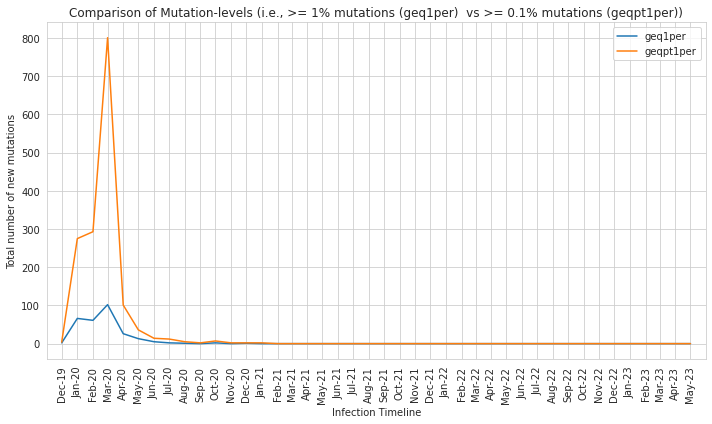

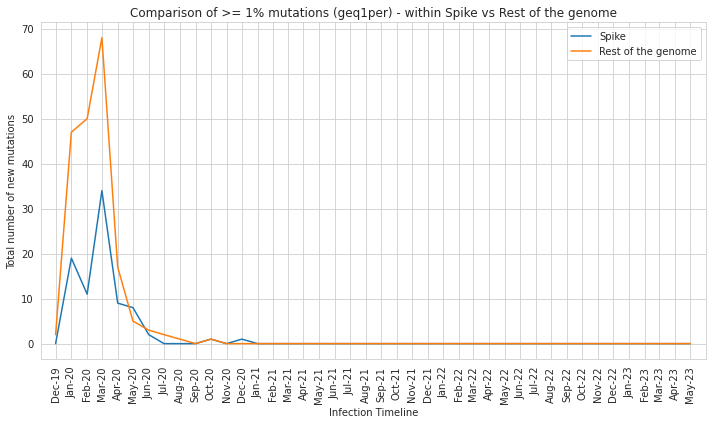

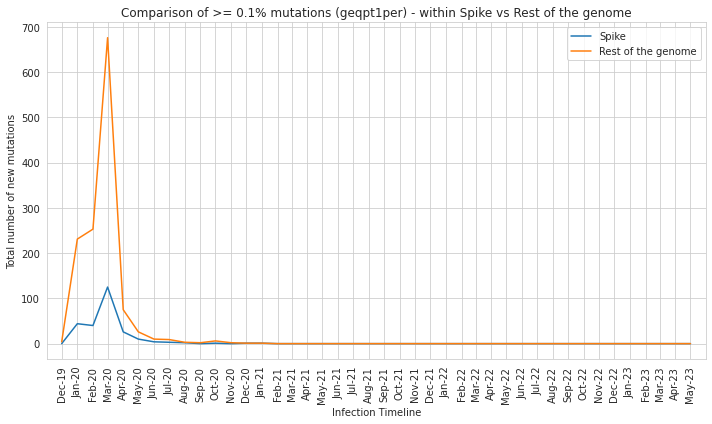

In [119]:
# ---------------------------------------------------------------------------
# geq1per vs geqpt1per -------------------------------------------------------
# ---------------------------------------------------------------------------

# Convert 'Infection Timeline' to datetime
melt_df_geq1pervsgeqpt1per['Infection Timeline'] = pd.to_datetime(melt_df_geq1pervsgeqpt1per['Infection Timeline'])

# Convert the dates to the first day of the month
melt_df_geq1pervsgeqpt1per['Infection Timeline'] = melt_df_geq1pervsgeqpt1per['Infection Timeline'].dt.to_period('M').dt.to_timestamp()

# Set 'Infection Timeline' as the index
melt_df_geq1pervsgeqpt1per.set_index('Infection Timeline', inplace=True)

# Create the line plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=melt_df_geq1pervsgeqpt1per, x=melt_df_geq1pervsgeqpt1per.index, y="Total number of mutations", hue="Mutation-level")
plt.ylabel('Total number of new mutations')
plt.title('Comparison of Mutation-levels (i.e., >= 1% mutations (geq1per)  vs >= 0.1% mutations (geqpt1per))')
plt.xticks(rotation=90)

# Format the x-axis labels
date_formatter = DateFormatter('%b-%y')
plt.gca().xaxis.set_major_formatter(date_formatter)

# Set the x-axis tick frequency to be monthly
plt.gca().xaxis.set_major_locator(MonthLocator(interval=1))

# Limit x-axis to show only dates between Dec 2019 and May 2023
plt.xlim(pd.Timestamp('2019-11-02'), pd.Timestamp('2023-05-31'))

plt.tight_layout()
plt.legend()
plt.show()


# ---------------------------------------------------------------------------
# Spike vs Rest- geq1per ----------------------------------------------------
# ---------------------------------------------------------------------------

# Convert 'Infection Timeline' to datetime
melt_df_SvsNS_geq1per['Infection Timeline'] = pd.to_datetime(melt_df_SvsNS_geq1per['Infection Timeline'])

# Convert the dates to the first day of the month
melt_df_SvsNS_geq1per['Infection Timeline'] = melt_df_SvsNS_geq1per['Infection Timeline'].dt.to_period('M').dt.to_timestamp()

# Set 'Infection Timeline' as the index
melt_df_SvsNS_geq1per.set_index('Infection Timeline', inplace=True)

# Create the line plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=melt_df_SvsNS_geq1per, x=melt_df_SvsNS_geq1per.index, y="Total number of mutations", hue="Genome region")
plt.ylabel('Total number of new mutations')
plt.title('Comparison of >= 1% mutations (geq1per) - within Spike vs Rest of the genome')
plt.xticks(rotation=90)

# Format the x-axis labels
date_formatter = DateFormatter('%b-%y')
plt.gca().xaxis.set_major_formatter(date_formatter)

# Set the x-axis tick frequency to be monthly
plt.gca().xaxis.set_major_locator(MonthLocator(interval=1))

# Limit x-axis to show only dates between Dec 2019 and May 2023
plt.xlim(pd.Timestamp('2019-11-02'), pd.Timestamp('2023-05-31'))

plt.tight_layout()
plt.legend()
plt.show()


# ---------------------------------------------------------------------------
# Spike vs Rest- geqpt1per ---------------------------------------------------
# ---------------------------------------------------------------------------

# Convert 'Infection Timeline' to datetime
melt_df_SvsNS_geqpt1per['Infection Timeline'] = pd.to_datetime(melt_df_SvsNS_geqpt1per['Infection Timeline'])

# Convert the dates to the first day of the month
melt_df_SvsNS_geqpt1per['Infection Timeline'] = melt_df_SvsNS_geqpt1per['Infection Timeline'].dt.to_period('M').dt.to_timestamp()

# Set 'Infection Timeline' as the index
melt_df_SvsNS_geqpt1per.set_index('Infection Timeline', inplace=True)

# Create the line plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=melt_df_SvsNS_geqpt1per, x=melt_df_SvsNS_geqpt1per.index, y="Total number of mutations", hue="Genome region")
plt.ylabel('Total number of new mutations')
plt.title('Comparison of >= 0.1% mutations (geqpt1per) - within Spike vs Rest of the genome')
plt.xticks(rotation=90)

# Format the x-axis labels
date_formatter = DateFormatter('%b-%y')
plt.gca().xaxis.set_major_formatter(date_formatter)

# Set the x-axis tick frequency to be monthly
plt.gca().xaxis.set_major_locator(MonthLocator(interval=1))

# Limit x-axis to show only dates between Dec 2019 and May 2023
plt.xlim(pd.Timestamp('2019-11-02'), pd.Timestamp('2023-05-31'))

plt.tight_layout()
plt.legend()
plt.show()

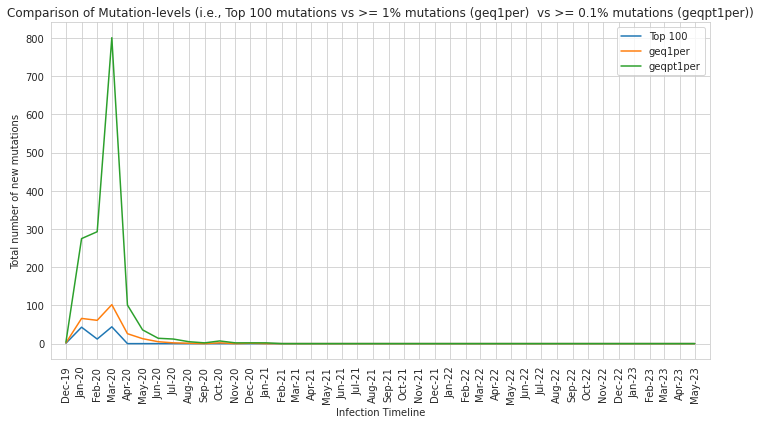

In [120]:
# ---------------------------------------------------------------------------
# top 100 vs geq1per vs geqpt1per -------------------------------------------------------
# ---------------------------------------------------------------------------

# Convert 'Infection Timeline' to datetime
melt_df_top100vsgeq1pervsgeqpt1per['Infection Timeline'] = pd.to_datetime(melt_df_top100vsgeq1pervsgeqpt1per['Infection Timeline'])

# Convert the dates to the first day of the month
melt_df_top100vsgeq1pervsgeqpt1per['Infection Timeline'] = melt_df_top100vsgeq1pervsgeqpt1per['Infection Timeline'].dt.to_period('M').dt.to_timestamp()

# Set 'Infection Timeline' as the index
melt_df_top100vsgeq1pervsgeqpt1per.set_index('Infection Timeline', inplace=True)

# Create the line plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=melt_df_top100vsgeq1pervsgeqpt1per, x=melt_df_top100vsgeq1pervsgeqpt1per.index, y="Total number of mutations", hue="Mutation-level")
plt.ylabel('Total number of new mutations')
plt.title('Comparison of Mutation-levels (i.e., Top 100 mutations vs >= 1% mutations (geq1per)  vs >= 0.1% mutations (geqpt1per))')
plt.xticks(rotation=90)

# Format the x-axis labels
date_formatter = DateFormatter('%b-%y')
plt.gca().xaxis.set_major_formatter(date_formatter)

# Set the x-axis tick frequency to be monthly
plt.gca().xaxis.set_major_locator(MonthLocator(interval=1))

# Limit x-axis to show only dates between Dec 2019 and May 2023
plt.xlim(pd.Timestamp('2019-11-02'), pd.Timestamp('2023-05-31'))

plt.tight_layout()
plt.legend()
plt.show()

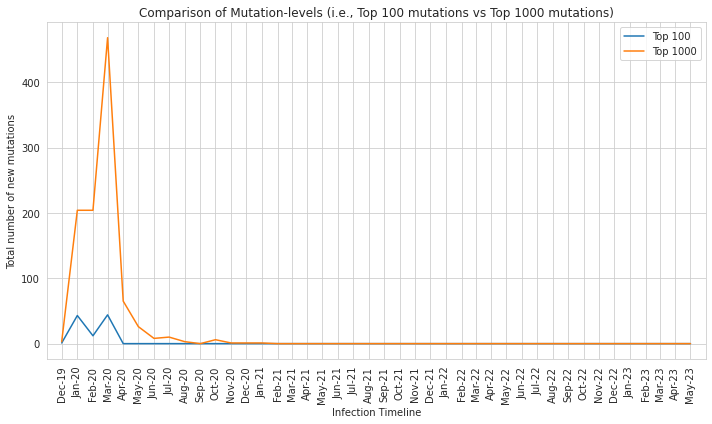

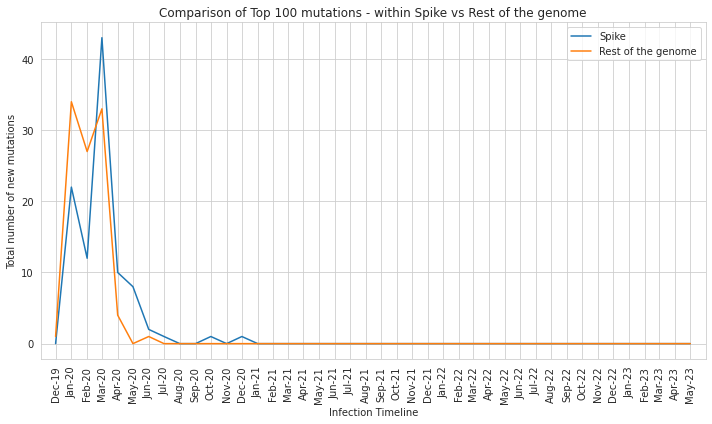

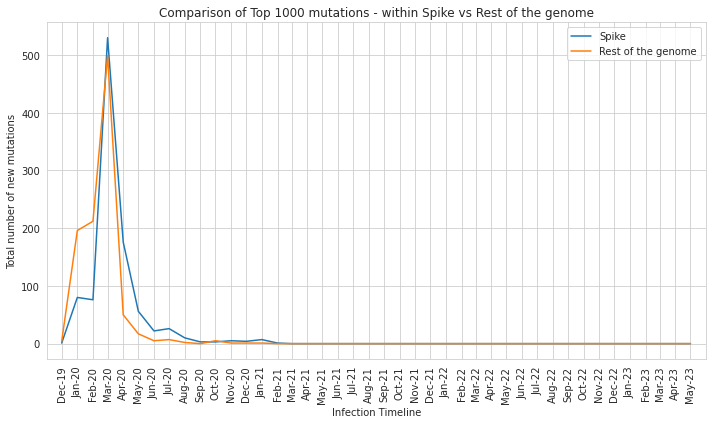

In [121]:
# ---------------------------------------------------------------------------
# Top 100 vs Top 1000 -------------------------------------------------------
# ---------------------------------------------------------------------------

# Convert 'Infection Timeline' to datetime
melt_df_top100vstop1000['Infection Timeline'] = pd.to_datetime(melt_df_top100vstop1000['Infection Timeline'])

# Convert the dates to the first day of the month
melt_df_top100vstop1000['Infection Timeline'] = melt_df_top100vstop1000['Infection Timeline'].dt.to_period('M').dt.to_timestamp()

# Set 'Infection Timeline' as the index
melt_df_top100vstop1000.set_index('Infection Timeline', inplace=True)

# Create the line plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=melt_df_top100vstop1000, x=melt_df_top100vstop1000.index, y="Total number of mutations", hue="Mutation-level")
plt.ylabel('Total number of new mutations')
plt.title('Comparison of Mutation-levels (i.e., Top 100 mutations vs Top 1000 mutations)')
plt.xticks(rotation=90)

# Format the x-axis labels
date_formatter = DateFormatter('%b-%y')
plt.gca().xaxis.set_major_formatter(date_formatter)

# Set the x-axis tick frequency to be monthly
plt.gca().xaxis.set_major_locator(MonthLocator(interval=1))

# Limit x-axis to show only dates between Dec 2019 and May 2023
plt.xlim(pd.Timestamp('2019-11-02'), pd.Timestamp('2023-05-31'))

plt.tight_layout()
plt.legend()
plt.show()


# ---------------------------------------------------------------------------
# Spike vs Rest- Top 100 ----------------------------------------------------
# ---------------------------------------------------------------------------

# Convert 'Infection Timeline' to datetime
melt_df_SvsNS_top100['Infection Timeline'] = pd.to_datetime(melt_df_SvsNS_top100['Infection Timeline'])

# Convert the dates to the first day of the month
melt_df_SvsNS_top100['Infection Timeline'] = melt_df_SvsNS_top100['Infection Timeline'].dt.to_period('M').dt.to_timestamp()

# Set 'Infection Timeline' as the index
melt_df_SvsNS_top100.set_index('Infection Timeline', inplace=True)

# Create the line plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=melt_df_SvsNS_top100, x=melt_df_SvsNS_top100.index, y="Total number of mutations", hue="Genome region")
plt.ylabel('Total number of new mutations')
plt.title('Comparison of Top 100 mutations - within Spike vs Rest of the genome')
plt.xticks(rotation=90)

# Format the x-axis labels
date_formatter = DateFormatter('%b-%y')
plt.gca().xaxis.set_major_formatter(date_formatter)

# Set the x-axis tick frequency to be monthly
plt.gca().xaxis.set_major_locator(MonthLocator(interval=1))

# Limit x-axis to show only dates between Dec 2019 and May 2023
plt.xlim(pd.Timestamp('2019-11-02'), pd.Timestamp('2023-05-31'))

plt.tight_layout()
plt.legend()
plt.show()


# ---------------------------------------------------------------------------
# Spike vs Rest- Top 1000 ---------------------------------------------------
# ---------------------------------------------------------------------------

# Convert 'Infection Timeline' to datetime
melt_df_SvsNS_top1000['Infection Timeline'] = pd.to_datetime(melt_df_SvsNS_top1000['Infection Timeline'])

# Convert the dates to the first day of the month
melt_df_SvsNS_top1000['Infection Timeline'] = melt_df_SvsNS_top1000['Infection Timeline'].dt.to_period('M').dt.to_timestamp()

# Set 'Infection Timeline' as the index
melt_df_SvsNS_top1000.set_index('Infection Timeline', inplace=True)

# Create the line plot using Seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(data=melt_df_SvsNS_top1000, x=melt_df_SvsNS_top1000.index, y="Total number of mutations", hue="Genome region")
plt.ylabel('Total number of new mutations')
plt.title('Comparison of Top 1000 mutations - within Spike vs Rest of the genome')
plt.xticks(rotation=90)

# Format the x-axis labels
date_formatter = DateFormatter('%b-%y')
plt.gca().xaxis.set_major_formatter(date_formatter)

# Set the x-axis tick frequency to be monthly
plt.gca().xaxis.set_major_locator(MonthLocator(interval=1))

# Limit x-axis to show only dates between Dec 2019 and May 2023
plt.xlim(pd.Timestamp('2019-11-02'), pd.Timestamp('2023-05-31'))

plt.tight_layout()
plt.legend()
plt.show()

In [122]:
# df_top100vstop1000.to_csv('./Supplementary Files/'+'subs_only/'+'df_top100vstop1000'+'.csv', index=False)
# melt_df_top100vstop1000.to_csv('./Supplementary Files/'+'subs_only/'+'melt_df_top100vstop1000'+'.csv', index=False)

# df_SvsNS_top100.to_csv('./Supplementary Files/'+'subs_only/'+'df_SvsNS_top100'+'.csv', index=False)
# melt_df_SvsNS_top100.to_csv('./Supplementary Files/'+'subs_only/'+'melt_df_SvsNS_top100'+'.csv', index=False)

# df_SvsNS_top1000.to_csv('./Supplementary Files/'+'subs_only/'+'df_SvsNS_top1000'+'.csv', index=False)
# melt_df_SvsNS_top1000.to_csv('./Supplementary Files/'+'subs_only/'+'melt_df_SvsNS_top1000'+'.csv', index=False)

### Saving files

#### Saving Supplementary Table 1

In [123]:
df3.head()

,unnest,collection_date
0,EPI_ISL_402121,2019-12-30
1,EPI_ISL_402123,2019-12-24
2,EPI_ISL_402124,2019-12-30
3,EPI_ISL_402127,2019-12-30
4,EPI_ISL_402128,2019-12-30


In [124]:
df3.rename(columns = {'unnest':'Accession ID'}, inplace=True)

In [125]:
df3.head()

,Accession ID,collection_date
0,EPI_ISL_402121,2019-12-30
1,EPI_ISL_402123,2019-12-24
2,EPI_ISL_402124,2019-12-30
3,EPI_ISL_402127,2019-12-30
4,EPI_ISL_402128,2019-12-30


In [126]:
# first_mil = df3['Accession ID'].iloc[:1000000]
# first_mil.reset_index(inplace=True, drop=True)
# second_mil = df3['Accession ID'].iloc[1000000:2000000]
# second_mil.reset_index(inplace=True, drop=True)
# third_mil = df3['Accession ID'].iloc[2000000:3000000]
# third_mil.reset_index(inplace=True, drop=True)
# fourth_mil = df3['Accession ID'].iloc[3000000:4000000]
# fourth_mil.reset_index(inplace=True, drop=True)
# fifth_mil = df3['Accession ID'].iloc[4000000:5000000]
# fifth_mil.reset_index(inplace=True, drop=True)
# sixth_mil = df3['Accession ID'].iloc[5000000:6000000]
# sixth_mil.reset_index(inplace=True, drop=True)
# seventh_mil = df3['Accession ID'].iloc[6000000:7000000]
# seventh_mil.reset_index(inplace=True, drop=True)
# eighth_mil = df3['Accession ID'].iloc[7000000:8000000]
# eighth_mil.reset_index(inplace=True, drop=True)
# ninth_mil = df3['Accession ID'].iloc[8000000:9000000]
# ninth_mil.reset_index(inplace=True, drop=True)
# tenth_mil = df3['Accession ID'].iloc[9000000:10000000]
# tenth_mil.reset_index(inplace=True, drop=True)
# eleventh_mil = df3['Accession ID'].iloc[10000000:11000000]
# eleventh_mil.reset_index(inplace=True, drop=True)
# twelfth_mil = df3['Accession ID'].iloc[11000000:]
# twelfth_mil.reset_index(inplace=True, drop=True)


# accession_ids = pd.concat(
#     [
#         first_mil, 
#         second_mil, 
#         third_mil, 
#         fourth_mil,
#         fifth_mil,
#         sixth_mil,
#         seventh_mil,
#         eighth_mil,
#         ninth_mil,
#         tenth_mil,
#         eleventh_mil,
#         twelfth_mil
#     ],
#     axis=1, 
#     ignore_index=True
# )

# accession_ids.rename(columns={
#     0:'Accession IDs | (1-999999)', 
#     1:'Accession IDs | (1000000-1999999)', 
#     2:'Accession IDs | (2000000-2999999)',
#     3:'Accession IDs | (3000000-3999999)',
#     4:'Accession IDs | (4000000-4999999)',
#     5:'Accession IDs | (5000000-5999999)',
#     6:'Accession IDs | (6000000-6999999)',
#     7:'Accession IDs | (7000000-7999999)',
#     8:'Accession IDs | (8000000-8999999)',
#     9:'Accession IDs | (9000000-9999999)',
#     10:'Accession IDs | (10000000-10999999)',
#     11:'Accession IDs | (11000000-11999999)'
# })


# accession_ids.to_excel(
#     './Supplementary Files/Supplementary_Table_1.xlsx', 
#     index=False, 
#     sheet_name='IDs for seqs used', 
#     header=[
#         'Accession IDs | (1-999999)', 
#         'Accession IDs | (1000000-1999999)', 
#         'Accession IDs | (2000000-2999999)',
#         'Accession IDs | (3000000-3999999)',
#         'Accession IDs | (4000000-4999999)',
#         'Accession IDs | (5000000-5999999)',
#         'Accession IDs | (6000000-6999999)',
#         'Accession IDs | (7000000-7999999)',
#         'Accession IDs | (8000000-8999999)',
#         'Accession IDs | (9000000-9999999)',
#         'Accession IDs | (10000000-10999999)',
#         'Accession IDs | (11000000-11999999)'
#     ]
# )


#### Saving predecessors for Supplementary Tables 2, 3, 4

In [127]:
# for item in list_of_dfs:
#     item.to_csv('./Supplementary Files/'+ 'subs_only/' + item.name+'.csv', index=False)